In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
from astropy.io import fits
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as c
import pyneb as pn
import matplotlib.pyplot as plt
HAS_PYNEB=True
from astropy.coordinates import SkyCoord, SkyOffsetFrame
from scipy.stats import linregress
from astropy.visualization import AsinhStretch, PercentileInterval
from skimage.segmentation import find_boundaries
from matplotlib import cm
from skimage.measure import find_contours
from matplotlib.patches import ConnectionPatch
from scipy.optimize import curve_fit
import os
import re
import matplotlib as mpl
import seaborn as sns




plt.rcParams["text.usetex"] = False

plt.rc('text', usetex=True)
plt.rc('font', family='serif', size=20)

#add rc param for ticks are inwards and minor ticks are on
plt.rc('xtick', direction='in', top=True)
plt.rc('ytick', direction='in', right=True)

cmap = cm.get_cmap('magma')


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/2455195374.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('magma')


In [2]:
# load in the HII region catalog
cat_path = 'CATALOGS/flux_catalogs/total_flux_catalog_with_deprojected_clustering_metrics.csv'
cat = pd.read_csv(cat_path)
print(f"Catalog loaded with {len(cat.columns)} columns.")
# print all column names
for col in cat.columns:
    print(col)

Catalog loaded with 211 columns.
region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_int
F_Hbeta_e_int
SNR_Hbeta_int
F_[OIII]4959_int
F_[OIII]49

In [3]:
# load in the WR and SNR catalogs
wr_catalog = pd.read_csv('CATALOGS/WR_catalog.csv', sep='\t')
snr_catalog = pd.read_csv('CATALOGS/snr_table.csv')
rows = []
with open("CATALOGS/snr_table.csv", "r") as f:
    for line in f:
        # Remove LaTeX and dollar symbols
        clean = re.sub(r"\\rm|\\pm|\$", "", line)
        # Split by comma
        parts = [p.strip() for p in clean.split(",") if p.strip()]
        # Find any token that looks like an RA (contains colons) and a Dec (starts with + or -)
        ra, dec = None, None
        for p in parts:
            if ":" in p and ra is None:
                ra = p
            elif (p.startswith("+") or p.startswith("-")) and ":" in p and dec is None:
                dec = p
        if ra and dec:
            rows.append((ra, dec))

# Make a DataFrame
snr_catalog = pd.DataFrame(rows, columns=["RA", "Dec"])

In [ ]:

# def latex_escape(s):
#     """Escape characters that break LaTeX, for string values."""
#     if not isinstance(s, str):
#         return s
#     replacements = {
#         '&': r'\&',
#         '%': r'\%',
#         '$': r'\$',
#         '#': r'\#',
#         '_': r'\_',
#         '{': r'\{',
#         '}': r'\}',
#     }
#     for old, new in replacements.items():
#         s = s.replace(old, new)
#     return s

# def format_value(val, fmt=None):
#     """Format values for LaTeX command definitions."""
#     if pd.isna(val):
#         return "N/A"
#     if isinstance(val, (int, np.integer)):
#         return str(val)
#     if isinstance(val, (float, np.floating)):
#         if fmt is not None:
#             return format(val, fmt)
#         return str(val)
#     return latex_escape(str(val))

# def write_latex_commands(filename, values, formats=None):
#     """
#     Write a .tex file with \\newcommand definitions.

#     Parameters
#     ----------
#     filename : str or Path
#         Output file path, e.g. 'catalog_numbers.tex'
#     values : dict
#         Mapping from LaTeX command name to value
#         Example: {'nregions': 153, 'meansize': 12.4}
#     formats : dict, optional
#         Mapping from command name to Python format specifier
#         Example: {'meansize': '.2f', 'totalluminosity': '.2e'}
#     """
#     filename = Path(filename)
#     formats = formats or {}

#     lines = [
#         "% This file is auto-generated from the Jupyter notebook.",
#         "% Do not edit by hand.",
#         ""
#     ]

#     for cmd, val in values.items():
#         formatted = format_value(val, formats.get(cmd))
#         lines.append(rf"\newcommand{{\{cmd}}}{{{formatted}}}")

#     filename.write_text("\n".join(lines) + "\n", encoding="utf-8")
#     print(f"Wrote {filename}")
#     # Example summary statistics from your catalog DataFrame
# values = {
#     "nregions": len(cat),
# }

# formats = {
#     "meansize": ".2f",
#     "mediansize": ".2f",
#     "maxsize": ".2f",
#     "minsize": ".2f",
# }

# write_latex_commands("catalog_numbers.tex", values, formats)

Wrote catalog_numbers.tex


In [121]:
from pathlib import Path
import numpy as np
import pandas as pd

# ============================================================
# HELPERS
# ============================================================
def latex_escape(s):
    """Escape characters that break LaTeX, for string values."""
    if not isinstance(s, str):
        return s
    replacements = {
        '&': r'\&',
        '%': r'\%',
        '$': r'\$',
        '#': r'\#',
        '_': r'\_',
        '{': r'\{',
        '}': r'\}',
    }
    for old, new in replacements.items():
        s = s.replace(old, new)
    return s

def format_value(val, fmt=None):
    """Format values for LaTeX command definitions."""
    if pd.isna(val):
        return "N/A"
    if isinstance(val, (int, np.integer)):
        return str(val)
    if isinstance(val, (float, np.floating)):
        if fmt is not None:
            return format(val, fmt)
        return str(val)
    return latex_escape(str(val))

def write_latex_commands(filename, values, formats=None):
    """
    Write a .tex file with \\newcommand definitions.
    """
    filename = Path(filename)
    formats = formats or {}

    lines = [
        "% This file is auto-generated from the Jupyter notebook.",
        "% Do not edit by hand.",
        ""
    ]

    for cmd, val in values.items():
        formatted = format_value(val, formats.get(cmd))
        lines.append(rf"\newcommand{{\{cmd}}}{{{formatted}}}")

    filename.write_text("\n".join(lines) + "\n", encoding="utf-8")
    print(f"Wrote {filename}")

def add_summary_stats(values, formats, df, col, prefix, fmt=".2f"):
    """
    Add N, median, p16, p25, p75, p84, min, max for a column.
    """
    if col not in df.columns:
        print(f"Column not found, skipping: {col}")
        return

    data = pd.to_numeric(df[col], errors="coerce").dropna()
    if len(data) == 0:
        print(f"No valid data in column, skipping: {col}")
        return

    p5, p16, p25, p50, p75, p84, p95 = np.percentile(data, [5, 16, 25, 50, 75, 84, 95])

    values[f"n{prefix}"] = len(data)
    values[f"median{prefix}"] = p50
    values[f"pfive{prefix}"] = p5
    values[f"psixteen{prefix}"] = p16
    values[f"ptwentyfive{prefix}"] = p25
    values[f"pseventyfive{prefix}"] = p75
    values[f"peightyfour{prefix}"] = p84
    values[f"pninetyfive{prefix}"] = p95
    values[f"min{prefix}"] = data.min()
    values[f"max{prefix}"] = data.max()

    formats[f"median{prefix}"] = fmt
    formats[f"pfive{prefix}"] = fmt
    formats[f"psixteen{prefix}"] = fmt
    formats[f"ptwentyfive{prefix}"] = fmt
    formats[f"pseventyfive{prefix}"] = fmt
    formats[f"peightyfour{prefix}"] = fmt
    formats[f"pninetyfive{prefix}"] = fmt
    formats[f"min{prefix}"] = fmt
    formats[f"max{prefix}"] = fmt

# ============================================================
# MAIN
# ============================================================
values = {}
formats = {}

# Total number of regions
values["nregions"] = len(cat)

# ------------------------------------------------------------
# Core catalog summary properties
# ------------------------------------------------------------
add_summary_stats(
    values, formats, cat,
    col="log_L_Ha_sum_dered",
    prefix="logLHa",
    fmt=".2f"
)

add_summary_stats(
    values, formats, cat,
    col="radius_p50_pc",
    prefix="radius",
    fmt=".2f"
)

add_summary_stats(
    values, formats, cat,
    col="ne_SII_cm3",
    prefix="ne",
    fmt=".1f"
)

add_summary_stats(
    values, formats, cat,
    col="logU_KK04",
    prefix="logU",
    fmt=".3f"
)

add_summary_stats(
    values, formats, cat,
    col="Z_N2S2Halpha_Brazzini2024",
    prefix="metallicity",
    fmt=".3f"
)

add_summary_stats(
    values, formats, cat,
    col="sum_A_V",
    prefix="Av",
    fmt=".2f"
)

add_summary_stats(
    values, formats, cat,
    col="DIG_fraction",
    prefix="DIGfraction",
    fmt=".3f"
)

add_summary_stats(
    values, formats, cat,
    col="distance_5th_closest_pc_deproj",
    prefix="dfive",
    fmt=".2f"
)

add_summary_stats(
    values, formats, cat,
    col="L_Ha_sum_dered",
    prefix="LHaLinear",
    fmt=".2e"
)

add_summary_stats(
    values, formats, cat,
    col="sum_E_BV",
    prefix="EBV",
    fmt=".2f"
)

add_summary_stats(
    values, formats, cat,
    col="nearest_neighbor_pc_deproj",
    prefix="nearestneighbour",
    fmt=".2f"
)

if "sigma5_per_pc2_deproj" in cat.columns:
    add_summary_stats(
        values, formats, cat,
        col="sigma5_per_pc2_deproj",
        prefix="sigmafive",
        fmt=".3e"
    )

# ------------------------------------------------------------
# Write file
# ------------------------------------------------------------
write_latex_commands("catalog_numbers.tex", values, formats)

# Optional: print a quick check of what was written
print("\nCommands written:")
for k in values:
    print(f"\\{k} = {format_value(values[k], formats.get(k))}")

Wrote catalog_numbers.tex

Commands written:
\nregions = 6508
\nlogLHa = 6266
\medianlogLHa = 36.00
\pfivelogLHa = 35.15
\psixteenlogLHa = 35.51
\ptwentyfivelogLHa = 35.66
\pseventyfivelogLHa = 36.39
\peightyfourlogLHa = 36.61
\pninetyfivelogLHa = 37.23
\minlogLHa = 32.98
\maxlogLHa = 44.07
\nradius = 6508
\medianradius = 12.99
\pfiveradius = 5.27
\psixteenradius = 8.20
\ptwentyfiveradius = 10.31
\pseventyfiveradius = 15.75
\peightyfourradius = 17.25
\pninetyfiveradius = 21.01
\minradius = 0.00
\maxradius = 50.70
\nne = 3704
\medianne = 103.9
\pfivene = 9.0
\psixteenne = 30.5
\ptwentyfivene = 45.2
\pseventyfivene = 214.1
\peightyfourne = 293.8
\pninetyfivene = 618.5
\minne = 1.0
\maxne = 1172102.3
\nlogU = 6022
\medianlogU = -3.458
\pfivelogU = -3.822
\psixteenlogU = -3.673
\ptwentyfivelogU = -3.604
\pseventyfivelogU = -3.296
\peightyfourlogU = -3.218
\pninetyfivelogU = -3.019
\minlogU = -4.519
\maxlogU = -1.350
\nmetallicity = 6179
\medianmetallicity = 8.324
\pfivemetallicity = 8.122


In [6]:
def field_to_fieldnum(field_label: str) -> str:
    """
    Map your plot field labels to WR catalog Field codes.
    Input examples: 'NE','NW','SE','SW','F5'...'F9'
    Output: 'F1'...'F9'
    """
    mapping = {"NE": "F1", "NW": "F2", "SE": "F3", "SW": "F4"}
    return mapping.get(field_label, field_label)  # F5->F5 etc.


def parse_name_to_coords(name: str) -> SkyCoord:
    # Example: 'J013307.80+302951.1'
    ra_h = name[1:3]
    ra_m = name[3:5]
    ra_s = name[5:10]
    dec_sign = name[10]
    dec_d = name[11:13]
    dec_m = name[13:15]
    dec_s = name[15:]
    ra_str = f"{ra_h}h{ra_m}m{ra_s}s"
    dec_str = f"{dec_sign}{dec_d}d{dec_m}m{dec_s}s"
    return SkyCoord(ra_str, dec_str, frame="icrs")

# ha_fits_path = "M33_Halpha.fits"
def load_halpha_log_and_wcs(wcs: str):
    with fits.open(wcs) as hdul:
        data = hdul[0].data
        hdr = hdul[0].header

    data = np.where(np.isfinite(data), data, np.nan)

    with np.errstate(divide="ignore", invalid="ignore"):
        ha_log = np.log10(data)
    ha_log = np.where(np.isfinite(ha_log), ha_log, np.nan)

    wcs = WCS(hdr)
    return ha_log, wcs


def try_load_boundary_map(field_label: str, boundary_dir="boundary_map"):
    """
    Tries boundary_map/Boundary_map_{FIELD}.fits where FIELD is e.g. NE, NW, SE, SW, F5...
    Returns array or None if missing/unreadable.
    """
    path = os.path.join(boundary_dir, f"Boundary_map_{field_label}.fits")
    if not os.path.exists(path):
        return None
    try:
        return fits.getdata(path)
    except Exception:
        return None


def get_wr_pixels_for_field(wr_catalog: pd.DataFrame, field_num: str, wcs: WCS):
    wr_field = wr_catalog[wr_catalog["Field"] == field_num]
    if len(wr_field) == 0:
        return np.array([]), np.array([])

    coords = [parse_name_to_coords(n) for n in wr_field["Name (star)"]]
    sky = SkyCoord(coords)
    x_wr, y_wr = wcs.world_to_pixel(sky)
    return np.array(x_wr), np.array(y_wr)


def get_snr_pixels_for_field(snr_catalog: pd.DataFrame, wcs: WCS, xlim=(50, 2000), ylim=(50, 2000)):
    """
    Your snr_table.csv loaded with pd.read_csv.
    This assumes columns named exactly 'RA' and 'Dec' OR 'Dec'/'DEC' variants.
    """
    # Be forgiving about Dec column name
    if "Dec" in snr_catalog.columns:
        dec_col = "Dec"
    elif "DEC" in snr_catalog.columns:
        dec_col = "DEC"
    elif "dec" in snr_catalog.columns:
        dec_col = "dec"
    else:
        raise KeyError("SNR catalog must have a Dec/DEC column (plus RA).")

    if "RA" not in snr_catalog.columns:
        raise KeyError("SNR catalog must have an 'RA' column.")

    coords = SkyCoord(snr_catalog["RA"].astype(str),
                      snr_catalog[dec_col].astype(str),
                      unit=(u.hourangle, u.deg))

    x_snr, y_snr = wcs.world_to_pixel(coords)
    x_snr = np.array(x_snr)
    y_snr = np.array(y_snr)

    in_field = (x_snr > xlim[0]) & (x_snr < xlim[1]) & (y_snr > ylim[0]) & (y_snr < ylim[1])
    return x_snr[in_field], y_snr[in_field]


In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from astropy.io import fits
from skimage.segmentation import find_boundaries


def _first_existing_path(paths):
    for p in paths:
        if p and os.path.exists(p):
            return p
    return None


def _build_region_color_mapper(
    catalog,
    color_regions_by=None,
    default_color="k",
    categorical_colors=None,
    numeric_cmap="viridis",
    numeric_vmin=None,
    numeric_vmax=None,
    unclassified_color="#888888",
):
    """
    Returns:
        get_color(row) -> matplotlib color
        legend_info -> dict with metadata for optional legend / colorbar use
    """
    if color_regions_by is None:
        return (lambda row: default_color), {"mode": "constant"}

    if color_regions_by not in catalog.columns:
        raise ValueError(
            f"Column '{color_regions_by}' not found in catalog. "
            f"Available columns: {list(catalog.columns)}"
        )

    values = catalog[color_regions_by]

    # Treat strings / mixed objects / booleans as categorical
    is_categorical = (
        pd.api.types.is_object_dtype(values)
        or pd.api.types.is_string_dtype(values)
        or pd.api.types.is_bool_dtype(values)
        or pd.api.types.is_categorical_dtype(values)
    )

    if is_categorical:
        unique_vals = pd.Series(values.fillna("Unclassified")).astype(str).unique()

        if categorical_colors is None:
            # default palette for common BPT-like classes
            default_cat_colors = {
                "Star-forming": "blue",
                "Composite": "green",
                "AGN/Shock": "red",
                "Unclassified": "blue",
                "nan": unclassified_color,
            }

            # assign default colors to known values; others from tab20
            fallback_cmap = plt.get_cmap("tab20")
            fallback_vals = [v for v in unique_vals if v not in default_cat_colors]
            fallback_map = {
                v: fallback_cmap(i / max(1, len(fallback_vals) - 1))
                for i, v in enumerate(fallback_vals)
            }

            categorical_colors = {**default_cat_colors, **fallback_map}

        def get_color(row):
            val = row.get(color_regions_by, "Unclassified")
            if pd.isna(val):
                val = "Unclassified"
            return categorical_colors.get(str(val), unclassified_color)

        return get_color, {
            "mode": "categorical",
            "column": color_regions_by,
            "categorical_colors": categorical_colors,
        }

    # otherwise treat as numeric
    vals_num = pd.to_numeric(values, errors="coerce")
    finite = vals_num[np.isfinite(vals_num)]
    if finite.empty:
        return (lambda row: default_color), {"mode": "constant"}

    if numeric_vmin is None:
        numeric_vmin = np.nanmin(finite)
    if numeric_vmax is None:
        numeric_vmax = np.nanmax(finite)

    norm = colors.Normalize(vmin=numeric_vmin, vmax=numeric_vmax)
    cmap = plt.get_cmap(numeric_cmap)

    def get_color(row):
        val = pd.to_numeric(row.get(color_regions_by, np.nan), errors="coerce")
        if not np.isfinite(val):
            return unclassified_color
        return cmap(norm(val))

    return get_color, {
        "mode": "numeric",
        "column": color_regions_by,
        "cmap": cmap,
        "norm": norm,
    }


def _plot_labelmap_boundaries(
    ax,
    label_map,
    catalog=None,
    region_id_col="region_id",
    color_regions_by=None,
    default_color="k",
    lw=0.5,
    alpha=0.9,
    categorical_colors=None,
    numeric_cmap="viridis",
    numeric_vmin=None,
    numeric_vmax=None,
    zorder=2,
    draw_background_outline=False,
    background_outline_color="k",
    background_outline_lw=None,
    background_outline_alpha=None,
):
    label_int = np.rint(np.nan_to_num(label_map, nan=0)).astype(np.int32)
    print("label_map dtype:", label_map.dtype)
    print("label_int dtype:", label_int.dtype)
    print("label_map min/max:", np.nanmin(label_map), np.nanmax(label_map))
    print("unique labels (first 30):", np.unique(label_int)[:30])
    print("number of unique labels:", len(np.unique(label_int)))

    if draw_background_outline:
        ax.contour(
            (label_int > 0).astype(float),
            levels=[0.5],
            colors=[background_outline_color],
            linewidths=(lw if background_outline_lw is None else background_outline_lw),
            origin="lower",
            zorder=zorder,
            alpha=(alpha if background_outline_alpha is None else background_outline_alpha),
        )

    if catalog is None or region_id_col not in catalog.columns:
        ax.contour(
            (label_int > 0).astype(float),
            levels=[0.5],
            colors=[default_color],
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )
        return {"mode": "constant"}

    get_color, legend_info = _build_region_color_mapper(
        catalog=catalog,
        color_regions_by=color_regions_by,
        default_color=default_color,
        categorical_colors=categorical_colors,
        numeric_cmap=numeric_cmap,
        numeric_vmin=numeric_vmin,
        numeric_vmax=numeric_vmax,
    )

    # Optional speedup / safety: index rows by region_id
    catalog_valid = catalog.dropna(subset=[region_id_col]).copy()
    catalog_valid[region_id_col] = pd.to_numeric(catalog_valid[region_id_col], errors="coerce")
    catalog_valid = catalog_valid.dropna(subset=[region_id_col])
    catalog_valid[region_id_col] = catalog_valid[region_id_col].astype(int)

    for _, row in catalog_valid.iterrows():
        region_id = row.get(region_id_col, None)
        # c = get_color(row)
        # print(f"region_id={region_id}, {color_regions_by}={row.get(color_regions_by)}, color={c}")
        mask = (label_int == region_id)
        # print(region_id, np.sum(mask))

        if not np.any(mask):
            continue
        # print(get_color(row))
        ax.contour(
            mask.astype(float),
            levels=[0.5],
            colors=[get_color(row)],
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )

    return legend_info


def _plot_peaks_for_field(
    ax,
    peaks_df,
    field_name,
    wcs=None,
    field_col="field",
    x_col="x",
    y_col="y",
    ra_col=None,
    dec_col=None,
    marker="x",
    s=25,
    color="k",
    edgecolor="black",
    lw=0.6,
    alpha=1.0,
    zorder=6,
):
    """
    Plot Halpha peaks for one field.

    Supports either:
      - pixel columns x_col / y_col
      - sky columns ra_col / dec_col (converted via WCS)
    """
    if peaks_df is None:
        return

    if field_col in peaks_df.columns:
        sub = peaks_df[peaks_df[field_col].astype(str) == str(field_name)].copy()
    else:
        # if no field column, assume the CSV is already filtered to the relevant field
        sub = peaks_df.copy()

    if sub.empty:
        return

    if ra_col is not None and dec_col is not None and ra_col in sub.columns and dec_col in sub.columns:
        if wcs is None:
            raise ValueError("WCS required to plot peaks from RA/Dec columns.")
        x, y = wcs.world_to_pixel_values(sub[ra_col].values, sub[dec_col].values)
    elif x_col in sub.columns and y_col in sub.columns:
        x = sub[x_col].values
        y = sub[y_col].values
    else:
        raise ValueError(
            "Peak CSV must contain either pixel columns "
            f"('{x_col}', '{y_col}') or sky columns ('{ra_col}', '{dec_col}')."
        )

    ax.scatter(
        x, y,
        marker=marker,
        s=s,
        c=color,
        edgecolors=edgecolor,
        linewidths=lw,
        alpha=alpha,
        zorder=zorder,
    )


def plot_m33_9panel_bpt_overlay(
    ha_dir,
    ha_filename_pattern,  # e.g. "M33_{FIELD}_Halpha.fits"
    catalog_dir="CATALOGS",
    catalog_pattern="processed_M33_{FIELD}_catalog.csv",
    wcs_pattern=None,  # e.g. "M33_{FIELD}_Halpha.fits" if WCS is in a separate file; if None, use ha_filename_pattern

    # label-map sources
    boundary_dir="boundary_map",
    boundary_pattern="Boundary_map_{FIELD}.fits",
    zoi_dir=None,
    zoi_pattern="ZOI_map_{FIELD}.fits",

    field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
    xlim=(50, 2000),
    ylim=(50, 2000),
    savepath=None,
    cmap=cm.get_cmap("rainbow").copy(),

    # Halpha image stretch
    vmin=-18.5,
    vmax=-15,

    # overlay toggles
    plot_boundaries=True,
    plot_zoi=False,
    plot_peaks=False,

    # region coloring
    color_regions_by=None,              # e.g. "raw_BPT_class", "bpt_class", "metallicity", etc.
    region_id_col="region_id",
    categorical_colors=None,            # dict for categorical values -> colors
    numeric_cmap="viridis",
    numeric_vmin=None,
    numeric_vmax=None,

    # boundary style
    boundary_color="k",
    boundary_lw=0.4,
    boundary_alpha=0.9,
    boundary_zorder=2,

    # optional "global" outline underneath colored regions
    draw_background_outline=False,
    background_outline_color="k",
    background_outline_lw=None,
    background_outline_alpha=None,

    # peaks CSV + columns
    peaks_csv=None,
    peaks_field_col="field",
    peaks_x_col="x",
    peaks_y_col="y",
    peaks_ra_col=None,
    peaks_dec_col=None,
    peaks_marker="x",
    peaks_size=25,
    peaks_color="cyan",
    peaks_edgecolor="black",
    peaks_lw=0.6,
    peaks_alpha=1.0,

    # cosmetics
    field_label_fontsize=20,
    field_label_box_fc="grey",
    field_label_box_alpha=0.8,

    # WR / SNR toggles
    plot_wr=True,
    wr_color="lime",
    plot_snr=True,
    snr_color="yellow",
):
    """
    3x3 M33 Halpha panels with optional overlays:
      - region boundaries from a boundary label map
      - region boundaries from a ZOI label map
      - optional coloring by any catalog column
      - optional Halpha peak markers from CSV
      - WR stars and SNRs

    Notes
    -----
    For color_regions_by:
      - categorical columns -> categorical colors
      - numeric columns -> mapped through numeric_cmap

    For peaks_csv:
      - either include pixel columns (x,y)
      - or include RA/Dec columns and set peaks_ra_col / peaks_dec_col
    """

    

    # --- Load all Halpha logs + WCS first (for consistent stretch if desired) ---
    ha_log_by_field = {}
    wcs_by_field = {}
    all_finite = []

    for fld in field_order:
        # --- load optional peaks file once ---
        peaks_df = None
        if plot_peaks and peaks_csv is not None:
            peaks_df = pd.read_csv(peaks_csv.format(FIELD=fld))
        ha_path = os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld))
        wcs_path = os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)) if wcs_pattern else ha_path
        if not os.path.exists(ha_path):
            if fld.startswith("F"):
                ha_path2 = os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld[1:]))
                if os.path.exists(ha_path2):
                    ha_path = ha_path2
                else:
                    raise FileNotFoundError(
                        f"Halpha FITS not found for {fld}: tried {ha_path} and {ha_path2}"
                    )
            else:
                raise FileNotFoundError(f"Halpha FITS not found for {fld}: tried {ha_path}")

        ha_log, wcs = load_halpha_log_and_wcs(wcs_path)
        ha_log_by_field[fld] = ha_log
        wcs_by_field[fld] = wcs

        finite = ha_log[np.isfinite(ha_log)]
        if finite.size:
            all_finite.append(finite)

    if not all_finite:
        raise RuntimeError("No finite Halpha values found across fields.")

    all_finite = np.concatenate(all_finite)

    # If you want percentile-based stretch again, uncomment:
    # if vmin is None or vmax is None:
    #     vmin, vmax = np.nanpercentile(all_finite, [1, 99])

    # --- Figure layout ---
    fig, axes = plt.subplots(3, 3, figsize=(16, 16))
    axes = axes.ravel()

    plt.subplots_adjust(
        left=0.02,
        right=0.98,
        bottom=0.0,
        top=1.0,
        wspace=0.01,
        hspace=0.02,
    )

    cmap = cmap.copy()
    cmap.set_bad(color="white")
    im_for_cbar = None

    # --- legend proxies ---
    legend_handles = []

    if plot_wr:
        wr_proxy = plt.Line2D(
            [0], [0], marker="*", linestyle="None",
            markerfacecolor=wr_color, markeredgecolor="black",
            markersize=8, label="WR Stars"
        )
        legend_handles.append(wr_proxy)

    if plot_snr:
        snr_proxy = plt.Line2D(
            [0], [0], marker="o", linestyle="None",
            markerfacecolor=snr_color, markeredgecolor="black",
            markersize=6, label="SNRs"
        )
        legend_handles.append(snr_proxy)

    if plot_peaks:
        peak_proxy = plt.Line2D(
            [0], [0], marker=peaks_marker, linestyle="None",
            markerfacecolor=peaks_color, markeredgecolor=peaks_edgecolor,
            markersize=np.sqrt(peaks_size), label=r"H$\alpha$ peaks"
        )
        legend_handles.append(peak_proxy)

    last_legend_info = None

    for ax, fld in zip(axes, field_order):
        print(f"Plotting field {fld}...")
        ha_log = ha_log_by_field[fld]
        wcs = wcs_by_field[fld]

        # --- Background Halpha ---
        im = ax.imshow(
            ha_log,
            origin="lower",
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            aspect="equal",
        )
        im_for_cbar = im

        # --- Field label ---
        ax.text(
            0.03, 0.97, fld,
            transform=ax.transAxes,
            ha="left", va="top",
            fontsize=field_label_fontsize, color="k",
            bbox=dict(
                facecolor=field_label_box_fc,
                alpha=field_label_box_alpha,
                edgecolor="none",
                pad=3,
            ),
        )

        fld_numeric = fld[1:] if fld.startswith("F") else None

        # --- catalog path ---
        cat_candidates = [
            os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld)),
            os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        cat_path = _first_existing_path(cat_candidates)
        catalog_processed = None
        if cat_path is not None:
            try:
                catalog_processed = pd.read_csv(cat_path)
            except Exception as e:
                print(f"[WARN] Could not read catalog for {fld}: {e}")

        # --- boundary map path ---
        bnd_candidates = [
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld)),
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        bnd_path = _first_existing_path(bnd_candidates)

        # --- zoi map path ---
        zoi_path = None
        if zoi_dir is not None:
            zoi_candidates = [
                os.path.join(zoi_dir, zoi_pattern.format(FIELD=fld)),
                os.path.join(zoi_dir, zoi_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
            ]
            zoi_path = _first_existing_path(zoi_candidates)

        # --- boundary overlay ---
        if plot_boundaries and (bnd_path is not None):
            try:
                bnd_map = fits.getdata(bnd_path)
                last_legend_info = _plot_labelmap_boundaries(
                    ax=ax,
                    label_map=bnd_map,
                    catalog=catalog_processed,
                    region_id_col=region_id_col,
                    color_regions_by=color_regions_by,
                    default_color=boundary_color,
                    lw=boundary_lw,
                    alpha=boundary_alpha,
                    categorical_colors=categorical_colors,
                    numeric_cmap=numeric_cmap,
                    numeric_vmin=numeric_vmin,
                    numeric_vmax=numeric_vmax,
                    zorder=boundary_zorder,
                    draw_background_outline=draw_background_outline,
                    background_outline_color=background_outline_color,
                    background_outline_lw=background_outline_lw,
                    background_outline_alpha=background_outline_alpha,
                )
            except Exception as e:
                print(f"[WARN] Skipping boundary overlay for {fld} due to error: {e}")

        # --- ZOI overlay ---
        if plot_zoi and (zoi_path is not None):
            try:
                zoi_map = fits.getdata(zoi_path)
                last_legend_info = _plot_labelmap_boundaries(
                    ax=ax,
                    label_map=zoi_map,
                    catalog=catalog_processed,
                    region_id_col=region_id_col,
                    color_regions_by=color_regions_by,
                    default_color=boundary_color,
                    lw=boundary_lw,
                    alpha=boundary_alpha,
                    categorical_colors=categorical_colors,
                    numeric_cmap=numeric_cmap,
                    numeric_vmin=numeric_vmin,
                    numeric_vmax=numeric_vmax,
                    zorder=boundary_zorder,
                    draw_background_outline=draw_background_outline,
                    background_outline_color=background_outline_color,
                    background_outline_lw=background_outline_lw,
                    background_outline_alpha=background_outline_alpha,
                )
            except Exception as e:
                print(f"[WARN] Skipping ZOI overlay for {fld} due to error: {e}")

        # --- Halpha peaks overlay ---
        if plot_peaks and peaks_df is not None:
            print(f"  Plotting peaks for {fld}...")
            try:
                _plot_peaks_for_field(
                    ax=ax,
                    peaks_df=peaks_df,
                    field_name=fld,
                    wcs=wcs,
                    field_col=peaks_field_col,
                    x_col=peaks_x_col,
                    y_col=peaks_y_col,
                    ra_col=peaks_ra_col,
                    dec_col=peaks_dec_col,
                    marker=peaks_marker,
                    s=peaks_size,
                    color=peaks_color,
                    edgecolor=peaks_edgecolor,
                    lw=peaks_lw,
                    alpha=peaks_alpha,
                    zorder=6,
                )
            except Exception as e:
                print(f"[WARN] Skipping peaks for {fld} due to error: {e}")

        # --- WR overlay ---
        if plot_wr:
            field_num = field_to_fieldnum(fld)
            x_wr, y_wr = get_wr_pixels_for_field(wr_catalog, field_num, wcs)
            if x_wr.size:
                ax.scatter(
                    x_wr, y_wr,
                    marker="*", s=50, color="lime",
                    edgecolor="black", linewidth=0.8, zorder=5
                )

        # --- SNR overlay ---
        if plot_snr:
            x_snr, y_snr = get_snr_pixels_for_field(snr_catalog, wcs, xlim=xlim, ylim=ylim)
            if x_snr.size:
                ax.scatter(
                    x_snr, y_snr,
                    marker="o", s=10, facecolors="orange",
                    edgecolor="black", zorder=5
                )

        # --- cosmetics ---
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_facecolor("white")
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(2.0)
            spine.set_edgecolor("black")

    # --- shared Halpha colorbar ---
    cbar = fig.colorbar(
        im_for_cbar,
        ax=axes.tolist(),
        orientation="horizontal",
        fraction=0.039,
        pad=0.01,
        aspect=30,
    )
    cbar.set_label(r"$\log_{10}$(H$\alpha$ + [OIII] amplitude)", fontsize=20)
    cbar.outline.set_edgecolor("black")
    cbar.ax.tick_params(color="black", labelcolor="black")
    cbar.outline.set_linewidth(2.0)

    # --- optional second colorbar for numeric region coloring ---
    if last_legend_info is not None and last_legend_info.get("mode") == "numeric":
        sm = cm.ScalarMappable(
            norm=last_legend_info["norm"],
            cmap=last_legend_info["cmap"]
        )
        sm.set_array([])
        cbar2 = fig.colorbar(
            sm,
            ax=axes.tolist(),
            orientation="vertical",
            fraction=0.02,
            pad=0.01,
            aspect=35,
        )
        cbar2.set_label(str(last_legend_info["column"]), fontsize=14)

    # --- optional categorical legend for region coloring ---
    if last_legend_info is not None and last_legend_info.get("mode") == "categorical":
        region_handles = []
        for lab, col in last_legend_info["categorical_colors"].items():
            region_handles.append(
                plt.Line2D([0], [0], color=col, lw=2, label=str(lab))
            )
        legend_handles = legend_handles + region_handles

    if legend_handles:
        fig.legend(
            handles=legend_handles,
            loc="lower right",
            bbox_to_anchor=(0.98, 0.05),
            frameon=True,
        )

    if savepath:
        fig.savefig(savepath, dpi=300, facecolor="white", bbox_inches="tight")

    plt.show()

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/2936983919.py:281: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


In [8]:
# plot_9_panel=True

# # IMPORTANT: set these to match your actual Halpha FITS location and naming
# ha_dir = "../M33-Maps"
# ha_filename_pattern = "M33-{FIELD}/M33{FIELD}-Haflux.fits" 

# haOIII_filename_pattern = "M33-{FIELD}/M33-{FIELD}_SN3.LineMaps.map.Ha+OIII.1x1.amplitude.fits"  # HA+OIII
# # If your processed catalogs are named exactly like:
# # 'CATALOGS/processed_M33_NW_catalog.csv'
# # then set:
# catalog_dir = "CATALOGS"
# catalog_pattern = "flux_catalogs/flux_catalog_{FIELD}.csv"


# if plot_9_panel:
#     # plot_m33_9panel_bpt_overlay(
#     #     ha_dir=ha_dir,
#     #     ha_filename_pattern=haOIII_filename_pattern,
#     #     catalog_dir=catalog_dir,
#     #     catalog_pattern=catalog_pattern,
#     #     wcs_pattern=ha_filename_pattern,  # use Halpha WCS for all panels
#     #     boundary_dir="Boundary_maps/Boundary_map_100pc",
#     #     field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
#     #     xlim=(50, 2000),
#     #     ylim=(50, 2000),
#     #     cmap = cm.get_cmap("rainbow").copy(),
        
#     #     savepath="plots/M33_allfields_9panel_boundary_rainbow.pdf",
#     #     plot_peaks = False,
#     #     boundary_color="k",
#     #     peaks_csv = "CATALOGS/final_peaks_{FIELD}.csv",
#     #     plot_boundaries =True
#     # )
    
#     # plot_m33_9panel_bpt_overlay(
#     #     ha_dir=ha_dir,
#     #     ha_filename_pattern=haOIII_filename_pattern,
#     #     catalog_dir=catalog_dir,
#     #     catalog_pattern=catalog_pattern,
#     #     wcs_pattern=ha_filename_pattern,  # use Halpha WCS for all panels
#     #     boundary_dir="Boundary_maps/Boundary_map_100pc",
#     #     field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
#     #     xlim=(50, 2000),
#     #     ylim=(50, 2000),
#     #     savepath="plots/M33_allfields_9panel_boundary_BPT.pdf",
#     #     plot_peaks = False,
#     #     cmap = cm.get_cmap("grey").copy(),
#     #     color_regions_by="BPT_class_sum_dered",
#     #     categorical_colors = {
#     #         "Star-forming": "blue",
#     #         "Composite": "green",
#     #         "AGN/Shock": "red",
#     #         "Unclassified": "grey",
#     #     },
#     #     peaks_csv = "CATALOGS/final_peaks_{FIELD}.csv",
#     #     plot_boundaries =True
#     # )
    
#     plot_m33_9panel_bpt_overlay(
#         ha_dir=ha_dir,
#         ha_filename_pattern=haOIII_filename_pattern,
#         catalog_dir=catalog_dir,
#         catalog_pattern=catalog_pattern,
#         wcs_pattern=ha_filename_pattern,  # use Halpha WCS for all panels
#         boundary_dir="Boundary_maps/Boundary_map_100pc",
#         field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
#         xlim=(50, 2000),
#         ylim=(50, 2000),
#         savepath="plots/M33_allfields_9panel_boundary_BPT.png",
#         cmap = cm.get_cmap("rainbow").copy(),
        
#         # categorical_colors = {
#         #     "Star-forming": "blue",
#         #     "Composite": "green",
#         #     "AGN/Shock": "red",
#         #     "Unclassified": "grey",
#         # },
#         plot_boundaries =True
#     )

In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from astropy.io import fits


def _first_existing_path(paths):
    for p in paths:
        if p and os.path.exists(p):
            return p
    return None


def _clean_bpt_class(val):
    if pd.isna(val):
        return "Unclassified"
    val = str(val).strip()
    if val == "" or val.lower() == "nan":
        return "Unclassified"
    return val


def _plot_bpt_boundaries_fast(
    ax,
    label_map,
    catalog,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    lw=0.5,
    alpha=0.9,
    zorder=3,
):
    """
    Plot boundaries colored by BPT class.

    Speedup: instead of contouring one region at a time, group all region IDs
    by class and contour once per class.
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)

    if catalog is None:
        ax.contour(
            (label_int > 0).astype(float),
            levels=[0.5],
            colors="k",
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )
        return

    if region_id_col not in catalog.columns:
        raise ValueError(f"'{region_id_col}' not found in catalog columns")
    if bpt_col not in catalog.columns:
        raise ValueError(f"'{bpt_col}' not found in catalog columns")

    cat = catalog.copy()
    cat[region_id_col] = pd.to_numeric(cat[region_id_col], errors="coerce")
    cat = cat.dropna(subset=[region_id_col])
    cat[region_id_col] = cat[region_id_col].astype(int)
    cat[bpt_col] = cat[bpt_col].apply(_clean_bpt_class)

    present_ids = set(np.unique(label_int))

    # group region IDs by BPT class
    class_to_region_ids = {}
    for _, row in cat.iterrows():
        rid = row[region_id_col]
        if rid not in present_ids:
            continue
        bpt_class = row[bpt_col]
        class_to_region_ids.setdefault(bpt_class, []).append(rid)

    # contour once per class
    for bpt_class, region_ids in class_to_region_ids.items():
        if len(region_ids) == 0:
            continue

        mask = np.isin(label_int, region_ids)
        if not np.any(mask):
            continue

        color = class_colors.get(bpt_class, class_colors["Unclassified"])

        ax.contour(
            mask.astype(float),
            levels=[0.5],
            colors=[color],
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )


def plot_m33_9panel_bpt_overlay(
    ha_dir,
    ha_filename_pattern,
    catalog_dir,
    catalog_pattern,
    boundary_dir,
    boundary_pattern,
    wcs_pattern=None,
    field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
    xlim=(50, 2000),
    ylim=(50, 2000),
    savepath=None,
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18.5,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_lw=0.4,
    boundary_alpha=0.9,
    field_label_fontsize=20,
    field_label_box_fc="grey",
    field_label_box_alpha=0.8,
    plot_wr=True,
    plot_snr=True,
    wr_color="lime",
    snr_color="orange",
):
    """
    Minimal 9-panel plot:
      - Ha+OIII background
      - BPT-colored HII region boundaries
      - WR stars
      - SNRs

    Assumes these helper functions / variables already exist:
      - load_halpha_log_and_wcs(...)
      - field_to_fieldnum(...)
      - get_wr_pixels_for_field(...)
      - get_snr_pixels_for_field(...)
      - wr_catalog
      - snr_catalog
    """

    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    # --- load all maps first ---
    ha_log_by_field = {}
    wcs_by_field = {}

    for fld in field_order:
        ha_candidates = [
            os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld[1:])) if fld.startswith("F") else None,
        ]
        ha_path = _first_existing_path(ha_candidates)
        if ha_path is None:
            raise FileNotFoundError(f"Could not find Ha map for field {fld}")

        if wcs_pattern is None:
            wcs_path = ha_path
        else:
            wcs_candidates = [
                os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
                os.path.join(ha_dir, wcs_pattern.format(FIELD=fld[1:])) if fld.startswith("F") else None,
            ]
            wcs_path = _first_existing_path(wcs_candidates)
            if wcs_path is None:
                raise FileNotFoundError(f"Could not find WCS map for field {fld}")

        ha_log, wcs = load_halpha_log_and_wcs(wcs_path)
        ha_log_by_field[fld] = ha_log
        wcs_by_field[fld] = wcs

    # --- figure layout ---
    fig, axes = plt.subplots(3, 3, figsize=(16, 16))
    axes = axes.ravel()

    plt.subplots_adjust(
        left=0.02,
        right=0.98,
        bottom=0.02,
        top=0.98,
        wspace=0.01,
        hspace=0.02,
    )

    cmap = cmap.copy()
    cmap.set_bad(color="white")
    im_for_cbar = None

    for ax, fld in zip(axes, field_order):
        print(f"Plotting field {fld}...")

        ha_log = ha_log_by_field[fld]
        wcs = wcs_by_field[fld]

        im = ax.imshow(
            ha_log,
            origin="lower",
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            aspect="equal",
        )
        im_for_cbar = im

        # ax.text(
        #     0.03, 0.97, fld,
        #     transform=ax.transAxes,
        #     ha="left", va="top",
        #     fontsize=field_label_fontsize,
        #     color="k",
        #     bbox=dict(
        #         facecolor=field_label_box_fc,
        #         alpha=field_label_box_alpha,
        #         edgecolor="none",
        #         pad=3,
        #     ),
        # )

        fld_numeric = fld[1:] if fld.startswith("F") else None

        # catalog
        cat_candidates = [
            os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld)),
            os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        cat_path = _first_existing_path(cat_candidates)
        catalog_processed = pd.read_csv(cat_path) if cat_path is not None else None

        # boundary map
        bnd_candidates = [
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld)),
            os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        bnd_path = _first_existing_path(bnd_candidates)

        if bnd_path is not None and catalog_processed is not None:
            bnd_map = fits.getdata(bnd_path)
            _plot_bpt_boundaries_fast(
                ax=ax,
                label_map=bnd_map,
                catalog=catalog_processed,
                region_id_col=region_id_col,
                bpt_col=bpt_col,
                class_colors=class_colors,
                lw=boundary_lw,
                alpha=boundary_alpha,
                zorder=3,
            )

        # WR overlay
        if plot_wr:
            field_num = field_to_fieldnum(fld)
            x_wr, y_wr = get_wr_pixels_for_field(wr_catalog, field_num, wcs)
            if x_wr.size:
                ax.scatter(
                    x_wr, y_wr,
                    marker="*",
                    s=50,
                    color=wr_color,
                    edgecolor="black",
                    linewidth=0.8,
                    zorder=5,
                )

        # SNR overlay
        if plot_snr:
            x_snr, y_snr = get_snr_pixels_for_field(snr_catalog, wcs, xlim=xlim, ylim=ylim)
            if x_snr.size:
                ax.scatter(
                    x_snr, y_snr,
                    marker="o",
                    s=10,
                    facecolors=snr_color,
                    edgecolor="black",
                    zorder=5,
                )

        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_facecolor("white")

        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(2.0)
            spine.set_edgecolor("black")

    # colorbar
    cbar = fig.colorbar(
        im_for_cbar,
        ax=axes.tolist(),
        orientation="horizontal",
        fraction=0.039,
        pad=0.01,
        aspect=30,
    )
    cbar.set_label(r"$\log_{10}$(H$\alpha$ + [OIII] amplitude)", fontsize=20)
    cbar.outline.set_edgecolor("black")
    cbar.ax.tick_params(color="black", labelcolor="black")
    cbar.outline.set_linewidth(2.0)

    # legend
    legend_handles = [
        plt.Line2D([0], [0], color=class_colors["Star-forming"], lw=2, label="Star-forming"),
        plt.Line2D([0], [0], color=class_colors["Composite"], lw=2, label="Composite"),
        plt.Line2D([0], [0], color=class_colors["AGN/Shock"], lw=2, label="AGN/Shock"),
        plt.Line2D([0], [0], color=class_colors["Unclassified"], lw=2, label="Unclassified"),
    ]

    if plot_wr:
        legend_handles.append(
            plt.Line2D(
                [0], [0],
                marker="*",
                linestyle="None",
                markerfacecolor=wr_color,
                markeredgecolor="black",
                markersize=8,
                label="WR Stars",
            )
        )

    if plot_snr:
        legend_handles.append(
            plt.Line2D(
                [0], [0],
                marker="o",
                linestyle="None",
                markerfacecolor=snr_color,
                markeredgecolor="black",
                markersize=6,
                label="SNRs",
            )
        )

    fig.legend(
        handles=legend_handles,
        loc="lower right",
        bbox_to_anchor=(0.95, 0.07),
        frameon=True,
        fancybox=True,
        fontsize = 12
    )

    if savepath:
        fig.savefig(savepath, dpi=300, facecolor="white", bbox_inches="tight")

    plt.show()

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/3817687273.py:120: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


In [10]:
# cmap_str = "pink"

# plot_m33_9panel_bpt_overlay(
#     ha_dir="../M33-Maps",
#     ha_filename_pattern="M33-{FIELD}/M33-{FIELD}_SN3.LineMaps.map.Ha+OIII.1x1.amplitude.fits",
#     catalog_dir="CATALOGS",
#     catalog_pattern="flux_catalogs/flux_catalog_{FIELD}.csv",
#     boundary_dir="Boundary_maps/Boundary_map_100pc",
#     boundary_pattern="Boundary_map_{FIELD}.fits",   # put your correct region-ID map here
#     wcs_pattern="M33-{FIELD}/M33{FIELD}-Haflux.fits",
#     field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
#     xlim=(50, 2000),
#     ylim=(50, 2000),
#     savepath=f"plots/M33_allfields_9panel_boundary_BPT_{cmap_str}.pdf",
#     # savepath=None,
#     cmap=cm.get_cmap(cmap_str).copy(),
#     region_id_col="region_id",
#     bpt_col="BPT_class_sum_dered",
#     class_colors={
#         "Star-forming": "k",
#         "Composite": "forestgreen",
#         "AGN/Shock": "firebrick",
#         "Unclassified": "grey",
#     },  
#     boundary_lw=0.5,
#     boundary_alpha=1,
#     field_label_fontsize=20,
#     field_label_box_fc="blue",
#     field_label_box_alpha=0.8,
#     wr_color="hotpink",
#     snr_color="gold",
#     vmax=-14,
    
# )

In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from astropy.io import fits
from astropy.wcs import WCS


def _first_existing_path(paths):
    for p in paths:
        if p and os.path.exists(p):
            return p
    return None


def _clean_bpt_class(val):
    if pd.isna(val):
        return "Unclassified"
    val = str(val).strip()
    if val == "" or val.lower() == "nan":
        return "Unclassified"
    return val


def _load_image_and_wcs_separately(image_path, wcs_path=None):
    """
    Load image data from image_path and WCS from wcs_path.
    If wcs_path is None, use the image header for WCS too.
    """
    image_data = np.squeeze(fits.getdata(image_path)).astype(float)

    if wcs_path is None:
        wcs_header = fits.getheader(image_path)
    else:
        wcs_header = fits.getheader(wcs_path)

    wcs = WCS(wcs_header)
    return image_data, wcs


def _safe_log10_image(data):
    """
    Take log10 safely: non-positive values become NaN.
    """
    out = np.full_like(data, np.nan, dtype=float)
    good = np.isfinite(data) & (data > 0)
    out[good] = np.log10(data[good])
    return out


def _plot_bpt_boundaries_fast(
    ax,
    label_map,
    catalog,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    lw=0.5,
    alpha=0.9,
    zorder=3,
):
    """
    Faster boundary plotting:
    group region IDs by BPT class, then contour once per class.
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    label_int = np.nan_to_num(label_map, nan=0).astype(np.int32)

    if catalog is None:
        ax.contour(
            (label_int > 0).astype(float),
            levels=[0.5],
            colors="k",
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )
        return

    if region_id_col not in catalog.columns:
        raise ValueError(f"'{region_id_col}' not found in catalog columns")
    if bpt_col not in catalog.columns:
        raise ValueError(f"'{bpt_col}' not found in catalog columns")

    cat = catalog.copy()
    cat[region_id_col] = pd.to_numeric(cat[region_id_col], errors="coerce")
    cat = cat.dropna(subset=[region_id_col])
    cat[region_id_col] = cat[region_id_col].astype(int)
    cat[bpt_col] = cat[bpt_col].apply(_clean_bpt_class)

    present_ids = set(np.unique(label_int))

    class_to_region_ids = {}
    for _, row in cat.iterrows():
        rid = row[region_id_col]
        if rid not in present_ids:
            continue
        bpt_class = row[bpt_col]
        class_to_region_ids.setdefault(bpt_class, []).append(rid)

    for bpt_class, region_ids in class_to_region_ids.items():
        if not region_ids:
            continue

        mask = np.isin(label_int, region_ids)
        if not np.any(mask):
            continue

        color = class_colors.get(bpt_class, class_colors["Unclassified"])
        #if BPT class is not star forming, make lw=1.0 and alpha=1.0 for better visibility
        if bpt_class != "Star-forming":
            lw = 1.0
            alpha = 1.0
            
        ax.contour(
            mask.astype(float),
            levels=[0.5],
            colors=[color],
            linewidths=lw,
            alpha=alpha,
            origin="lower",
            zorder=zorder,
        )


def plot_m33_field_bpt(
    fld,
    ha_dir,
    ha_filename_pattern,
    catalog_dir,
    catalog_pattern,
    boundary_dir,
    boundary_pattern,
    wcs_pattern=None,
    xlim=(50, 2000),
    ylim=(50, 2000),
    savepath=None,
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18.5,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_lw=0.4,
    boundary_alpha=0.9,
    field_label_fontsize=20,
    field_label_box_fc="grey",
    field_label_box_alpha=0.8,
    plot_wr=True,
    plot_snr=True,
    wr_color="lime",
    snr_color="orange",
    figsize=(8, 8),
    show_legend=True,
):
    """
    Plot a single field and save it, explicitly using:
      - Ha+OIII file for the image
      - Halpha/WCS file for the WCS
    """
    if class_colors is None:
        class_colors = {
            "Star-forming": "blue",
            "Composite": "green",
            "AGN/Shock": "red",
            "Unclassified": "gray",
        }

    fld_numeric = fld[1:] if fld.startswith("F") else None

    ha_candidates = [
        os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld)),
        os.path.join(ha_dir, ha_filename_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    ha_path = _first_existing_path(ha_candidates)
    if ha_path is None:
        raise FileNotFoundError(f"Could not find Ha+OIII map for field {fld}")

    if wcs_pattern is None:
        wcs_path = ha_path
    else:
        wcs_candidates = [
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld)),
            os.path.join(ha_dir, wcs_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
        ]
        wcs_path = _first_existing_path(wcs_candidates)
        if wcs_path is None:
            raise FileNotFoundError(f"Could not find WCS file for field {fld}")

    cat_candidates = [
        os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld)),
        os.path.join(catalog_dir, catalog_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    cat_path = _first_existing_path(cat_candidates)
    if cat_path is None:
        raise FileNotFoundError(f"Could not find catalog for field {fld}")

    bnd_candidates = [
        os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld)),
        os.path.join(boundary_dir, boundary_pattern.format(FIELD=fld_numeric)) if fld_numeric else None,
    ]
    bnd_path = _first_existing_path(bnd_candidates)
    if bnd_path is None:
        raise FileNotFoundError(f"Could not find boundary map for field {fld}")

    # --------------------------------------------------
    # CORRECTED PART:
    # image comes from Ha+OIII file
    # WCS comes from WCS file
    # --------------------------------------------------
    haoiii_data, wcs = _load_image_and_wcs_separately(ha_path, wcs_path)
    ha_log = _safe_log10_image(haoiii_data)

    catalog_processed = pd.read_csv(cat_path)
    bnd_map = fits.getdata(bnd_path)

    fig, ax = plt.subplots(1, 1, figsize=figsize)

    cmap = cmap.copy()
    cmap.set_bad(color="white")

    im = ax.imshow(
        ha_log,
        origin="lower",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        aspect="equal",
    )

    _plot_bpt_boundaries_fast(
        ax=ax,
        label_map=bnd_map,
        catalog=catalog_processed,
        region_id_col=region_id_col,
        bpt_col=bpt_col,
        class_colors=class_colors,
        lw=boundary_lw,
        alpha=boundary_alpha,
        zorder=3,
    )

    if plot_wr:
        field_num = field_to_fieldnum(fld)
        x_wr, y_wr = get_wr_pixels_for_field(wr_catalog, field_num, wcs)
        if x_wr.size:
            ax.scatter(
                x_wr, y_wr,
                marker="*",
                s=50,
                color=wr_color,
                edgecolor="black",
                linewidth=0.8,
                zorder=5,
            )

    if plot_snr:
        x_snr, y_snr = get_snr_pixels_for_field(snr_catalog, wcs, xlim=xlim, ylim=ylim)
        if x_snr.size:
            ax.scatter(
                x_snr, y_snr,
                marker="o",
                s=10,
                facecolors=snr_color,
                edgecolor="black",
                zorder=5,
            )

    ax.text(
        0.03, 0.97, fld,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=field_label_fontsize,
        color="k",
        bbox=dict(
            facecolor=field_label_box_fc,
            alpha=field_label_box_alpha,
            edgecolor="none",
            pad=3,
        ),
    )

    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2.0)
        spine.set_edgecolor("black")

    cbar = fig.colorbar(im, ax=ax, orientation="horizontal", fraction=0.05, pad=0.04)
    cbar.set_label(r"$\log_{10}$(H$\alpha$ + [OIII] amplitude)", fontsize=14)

    if show_legend:
        legend_handles = [
            plt.Line2D([0], [0], color=class_colors["Star-forming"], lw=2, label="Star-forming"),
            plt.Line2D([0], [0], color=class_colors["Composite"], lw=2, label="Composite"),
            plt.Line2D([0], [0], color=class_colors["AGN/Shock"], lw=2, label="AGN/Shock"),
            plt.Line2D([0], [0], color=class_colors["Unclassified"], lw=2, label="Unclassified"),
        ]

        if plot_wr:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="*",
                    linestyle="None",
                    markerfacecolor=wr_color,
                    markeredgecolor="black",
                    markersize=8,
                    label="WR Stars",
                )
            )

        if plot_snr:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    marker="o",
                    linestyle="None",
                    markerfacecolor=snr_color,
                    markeredgecolor="black",
                    markersize=6,
                    label="SNRs",
                )
            )

        ax.legend(handles=legend_handles, loc="lower right", frameon=True, fontsize=10)

    if savepath is not None:
        save_dir = os.path.dirname(savepath)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(savepath, dpi=300, facecolor="white", bbox_inches="tight")

    plt.show()


def plot_all_m33_fields_separately(
    field_order,
    output_dir,
    ha_dir,
    ha_filename_pattern,
    catalog_dir,
    catalog_pattern,
    boundary_dir,
    boundary_pattern,
    wcs_pattern=None,
    xlim=(50, 2000),
    ylim=(50, 2000),
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18.5,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors=None,
    boundary_lw=0.4,
    boundary_alpha=0.9,
    plot_wr=True,
    plot_snr=True,
    wr_color="lime",
    snr_color="orange",
    figsize=(8, 8),
    filetype="pdf",
):
    os.makedirs(output_dir, exist_ok=True)

    for fld in field_order:
        print(f"Plotting {fld}...")
        savepath = os.path.join(output_dir, f"M33_{fld}_BPT_overlay.{filetype}")

        plot_m33_field_bpt(
            fld=fld,
            ha_dir=ha_dir,
            ha_filename_pattern=ha_filename_pattern,
            catalog_dir=catalog_dir,
            catalog_pattern=catalog_pattern,
            boundary_dir=boundary_dir,
            boundary_pattern=boundary_pattern,
            wcs_pattern=wcs_pattern,
            xlim=xlim,
            ylim=ylim,
            savepath=savepath,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            region_id_col=region_id_col,
            bpt_col=bpt_col,
            class_colors=class_colors,
            boundary_lw=boundary_lw,
            boundary_alpha=boundary_alpha,
            plot_wr=plot_wr,
            plot_snr=plot_snr,
            wr_color=wr_color,
            snr_color=snr_color,
            figsize=figsize,
            show_legend=True,
        )

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/2050116670.py:147: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/2050116670.py:363: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/3703428753.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap("rainbow").copy(),


Plotting NE...


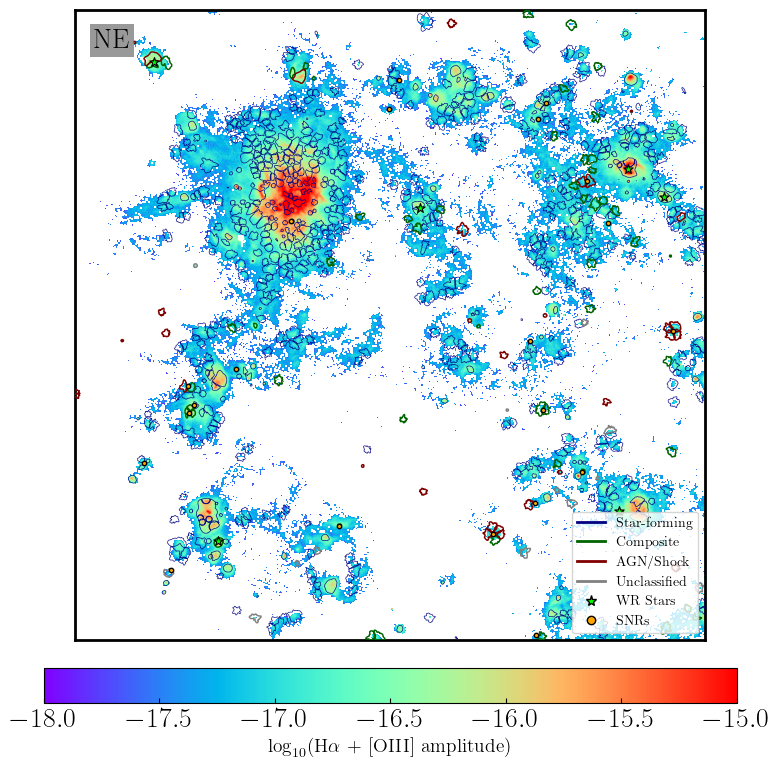

Plotting NW...


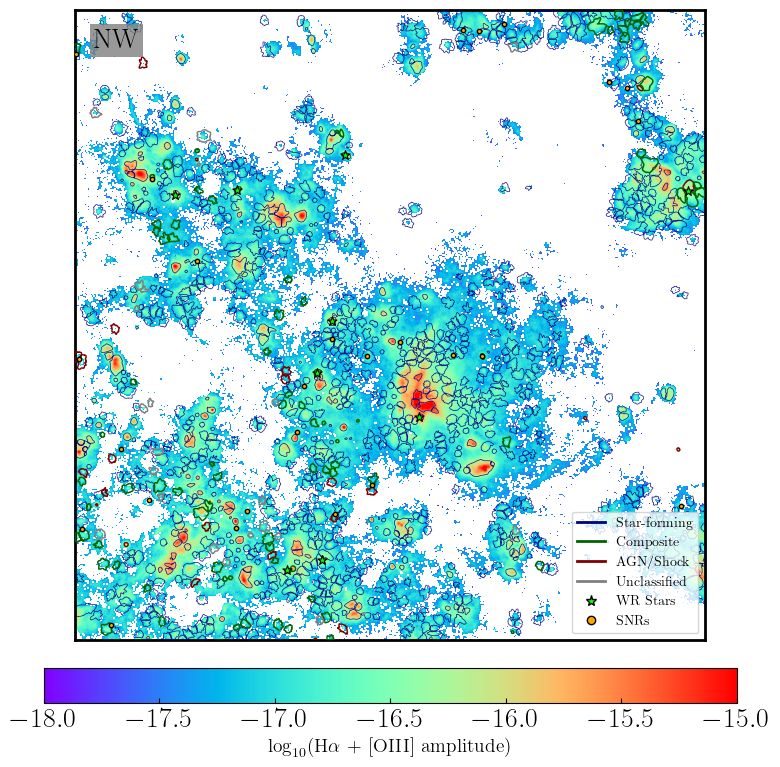

Plotting F5...


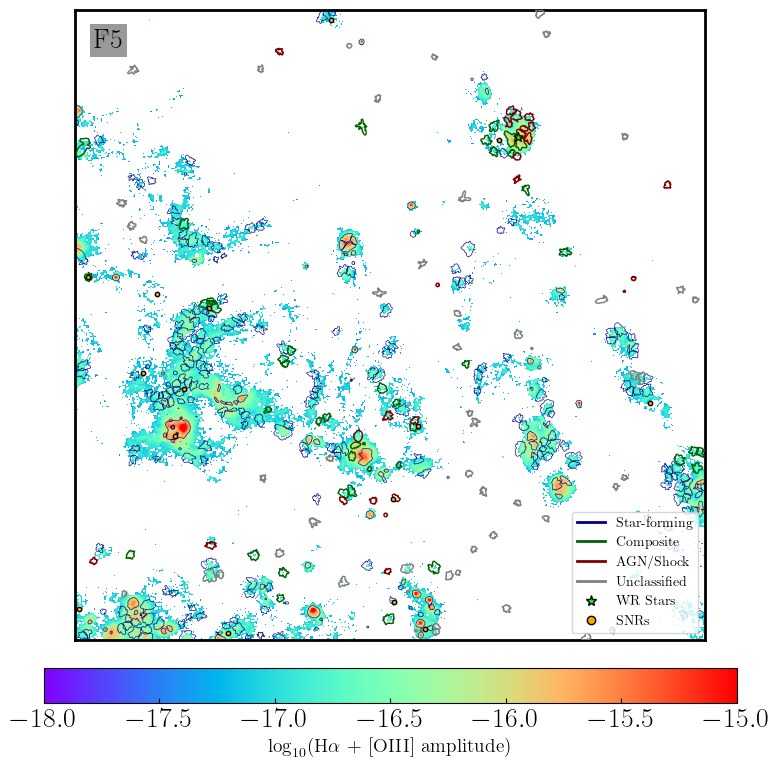

Plotting SE...


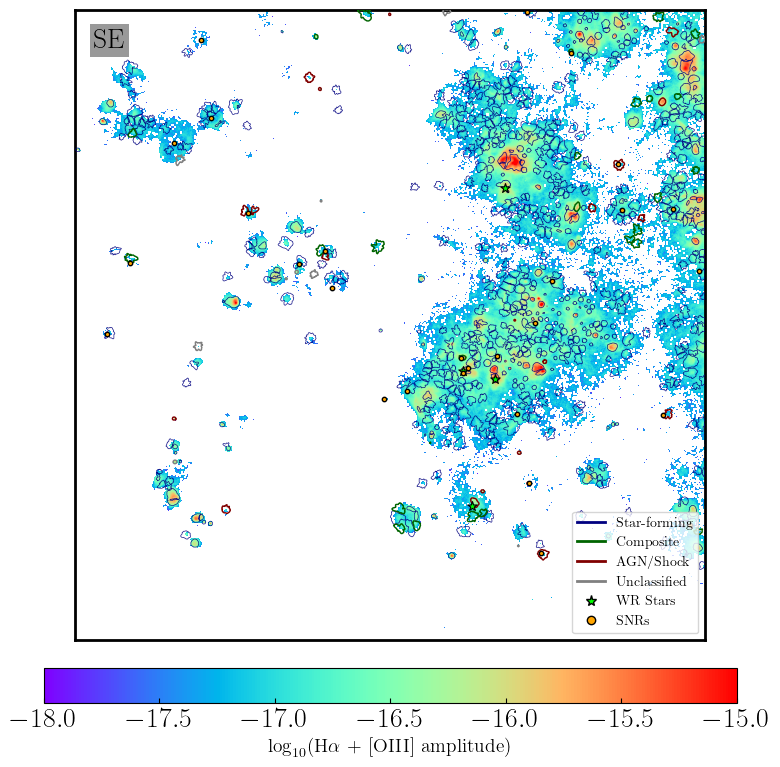

Plotting SW...


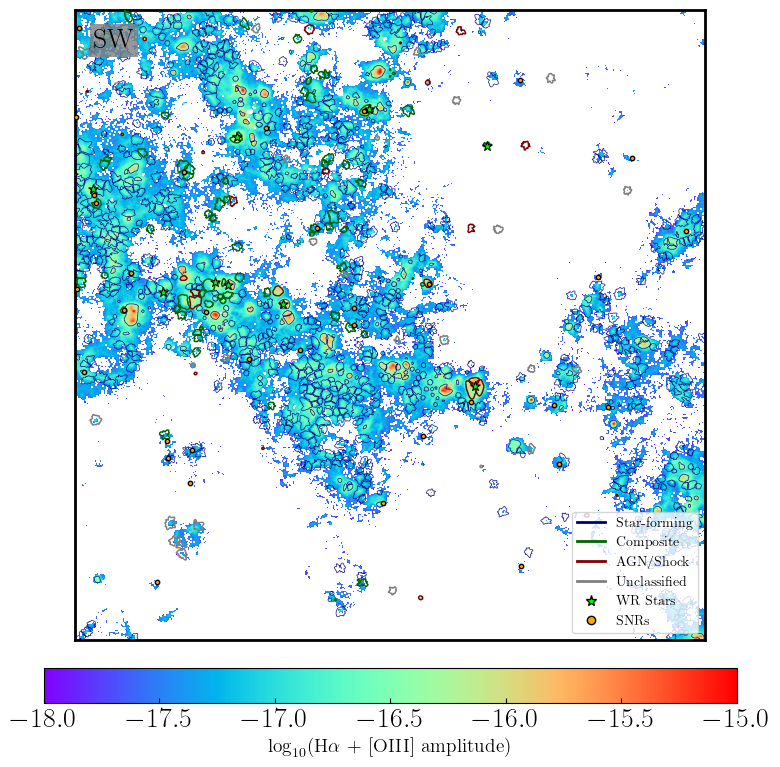

Plotting F7...


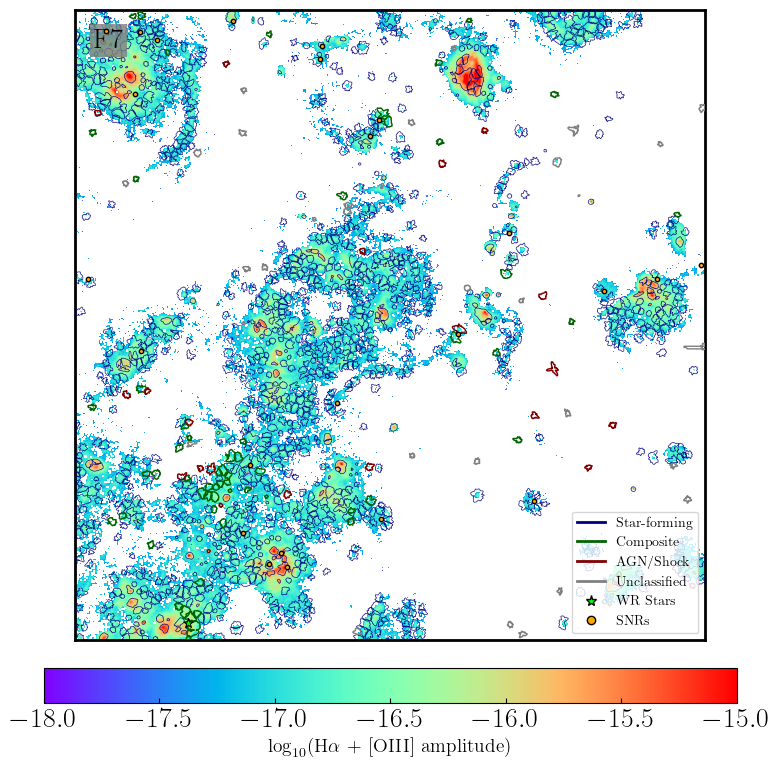

Plotting F6...


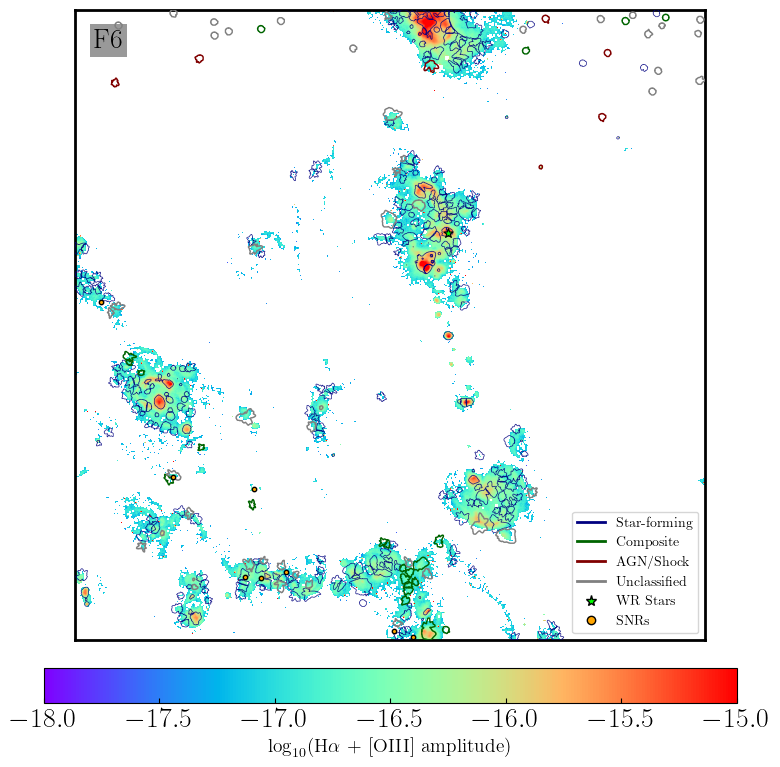

Plotting F8...


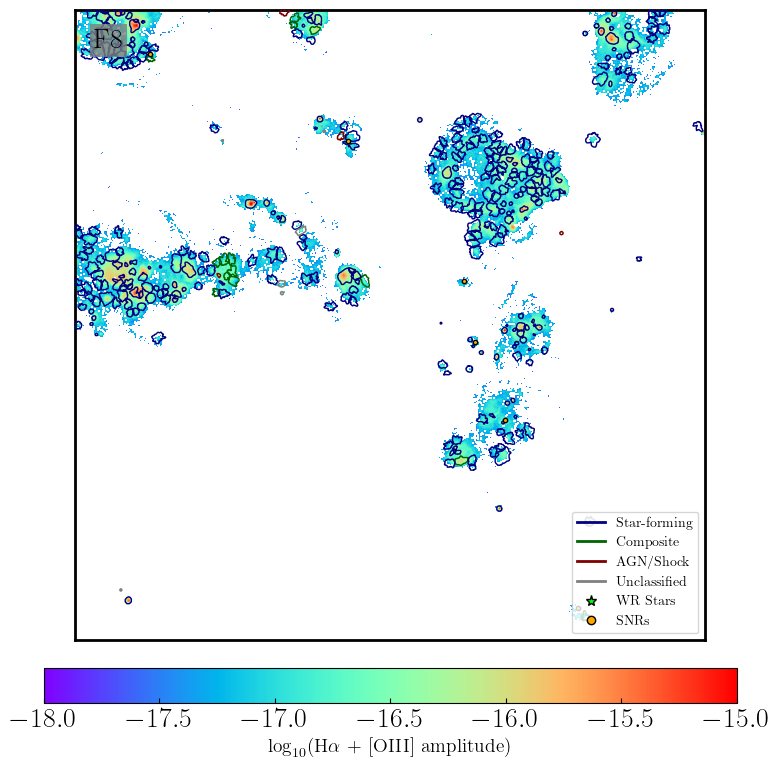

Plotting F9...


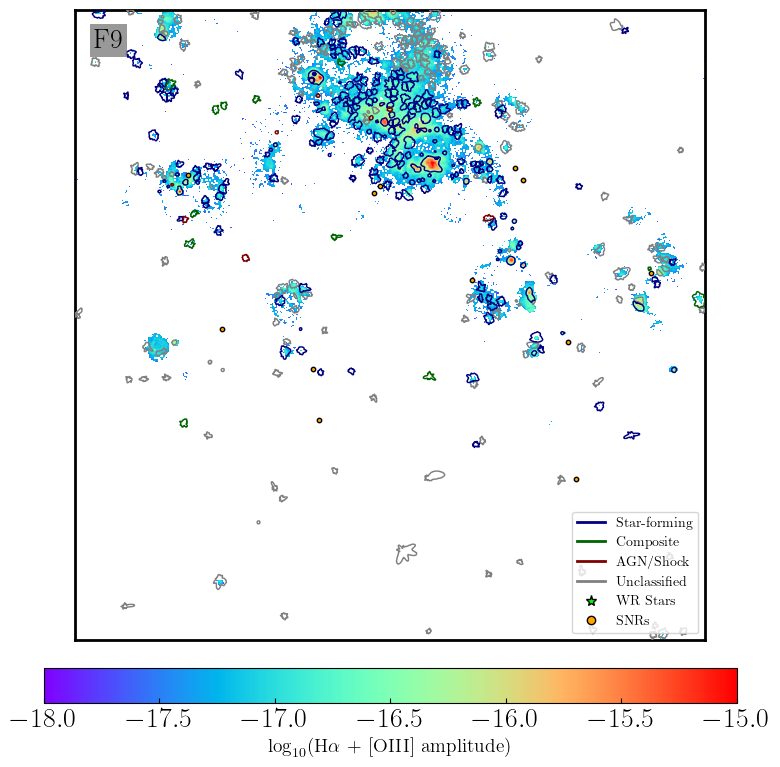

In [12]:
plot_all_m33_fields_separately(
    field_order=("NE", "NW", "F5", "SE", "SW", "F7", "F6", "F8", "F9"),
    output_dir="plots/individual_fields",
    ha_dir="../M33-Maps",
    ha_filename_pattern="M33-{FIELD}/M33-{FIELD}_SN3.LineMaps.map.Ha+OIII.1x1.amplitude.fits",
    catalog_dir="CATALOGS",
    catalog_pattern="flux_catalogs/flux_catalog_{FIELD}.csv",
    boundary_dir="Boundary_maps/Boundary_map_100pc",
    boundary_pattern="Boundary_map_{FIELD}.fits",   # use the true label map
    wcs_pattern="M33-{FIELD}/M33{FIELD}-Haflux.fits",
    xlim=(50, 2000),
    ylim=(50, 2000),
    cmap=cm.get_cmap("rainbow").copy(),
    vmin=-18,
    vmax=-15.0,
    region_id_col="region_id",
    bpt_col="BPT_class_sum_dered",
    class_colors={
        "Star-forming": "navy",
        "Composite": "darkgreen",
        "AGN/Shock": "maroon",
        "Unclassified": "gray",
    },
    boundary_lw=0.5,
    boundary_alpha=0.9,
    figsize=(9, 9),
    filetype="pdf",
    
)

In [13]:
# for path in [
#     "Boundary_maps/Boundary_map_100pc/ContDomain_map_NE.fits",
#     "Boundary_maps/Boundary_map_100pc/Boundary_map_NE.fits"
# ]:
#     data = fits.getdata(path)
#     arr = np.nan_to_num(data, nan=0)
#     print(path)
#     print("dtype:", data.dtype)
#     print("min/max:", np.nanmin(data), np.nanmax(data))
#     print("unique:", np.unique(arr)[:20])
#     print()

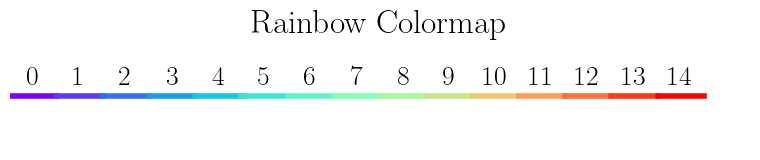

In [14]:
#draw 100 evenly spaced colours from the rainbow cmap
cmap = plt.get_cmap('rainbow')
colors = [cmap(i) for i in np.linspace(0, 1, 15)]
#show the colours
plt.figure(figsize=(8, 2))
for i, color in enumerate(colors):
    plt.plot([i, i + 1], [0, 0], color=color, lw=4)
#label each colour with its index
for i in range(len(colors)):
    plt.text(i + 0.5, 0.1, str(i), ha='center', va='bottom')
plt.xlim(0, len(colors) + 1)
plt.ylim(-1, 1)
plt.axis('off')
plt.title('Rainbow Colormap')
plt.tight_layout()

In [15]:
def plot_bpt(df,
             x_col='log_NII_Ha_sum_dered',
             x_col_err='log_NII_Ha_sum_dered_err',
             y_col='log_OIII_Hb_sum_dered',
             y_col2 = 'log_SII_Ha_sum_dered',
             class_col='BPT_class_sum_dered',
             snr_cut=3.0,
             figsize=(14, 6),
             savepath=None,
             color_col=None,                 # e.g. 'surface_brightness', 'Rgal', etc.
             marker_size=30,
             cmap='viridis',                 # colormap name or Colormap
             vmin=None, vmax=None,           # color scaling; None => inferred from data
             colorbar=True,
             colorbar_label=None,
             colorbar_log=False,             # True => log-normalize color scale
             missing_color='lightgray'        # used if some points have NaN color_col
            ):
    """
    Plot BPT diagrams:
      LEFT:  [NII]/Ha vs [OIII]/Hb
      RIGHT: [SII]/Ha vs [OIII]/Hb

    Classification is shown via marker shape (and legend).
    If color_col is provided, point facecolor is mapped to that column (with optional colorbar).
    """

    df = df.copy()

    # ---------------------------------------------------
    # Apply SNR cut
    # ---------------------------------------------------
    snr_cols = [f'SNR_{line}_sum' for line in ['Halpha', 'Hbeta', '[NII]6583', '[OIII]5007', '[SII]6731']]
    if all(col in df.columns for col in snr_cols):
        mask = np.ones(len(df), dtype=bool)
        for col in snr_cols:
            mask &= df[col] >= snr_cut
        df = df[mask]
    else:
        print("Warning: SNR columns not found; skipping SNR cut.")

    default_cmap = plt.cm.magma
    class_colors = {
        'Star-forming': colors[2],
        'Composite': colors[10],
        'AGN/Shock': colors[14],
        # 'Unclassified': 'grey',
    }

    shapes = {
        'Star-forming': 'o',
        'Composite': '^',
        'AGN/Shock': 's',
        # 'Unclassified': 'x',
    }

    # ---------------------------------------------------
    # Color mapping setup (if requested)
    # ---------------------------------------------------
    use_third_color = (color_col is not None) and (color_col in df.columns)
    print(f"Using third color: {use_third_color}" )
    norm = None
    sm = None
    if use_third_color:
        cvals_all = df[color_col].to_numpy()
        finite = np.isfinite(cvals_all)

        if vmin is None:
            vmin = np.nanmin(cvals_all[finite]) if np.any(finite) else 0.0
        if vmax is None:
            vmax = np.nanmax(cvals_all[finite]) if np.any(finite) else 1.0

        if colorbar_log:
            # avoid <=0 for LogNorm
            good = cvals_all[finite]
            good = good[good > 0]
            if good.size == 0:
                raise ValueError(f"colorbar_log=True but {color_col} has no positive finite values.")
            if vmin <= 0:
                vmin = np.nanmin(good)
            norm = mpl.colors.LogNorm(vmin=vmin, vmax=vmax)
        else:
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

        cmap_obj = mpl.colormaps.get_cmap(cmap) if isinstance(cmap, str) else cmap
        sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap_obj)

    # ---------------------------------------------------
    # Figure setup
    # ---------------------------------------------------
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # ---------------------------------------------------
    # LEFT: [NII]/Ha BPT
    # ---------------------------------------------------
    x_vals = np.linspace(-2, 1.0, 400)
    kewley_y = 0.61 / (x_vals - 0.47) + 1.19
    kauff_y  = 0.61 / (x_vals - 0.05) + 1.3

    for cls in shapes.keys():
        subset = df[df[class_col] == cls]
        if len(subset) == 0:
            continue

        # errorbars in gray (no markers)
        ax1.errorbar(subset['log_NII_Ha_sum_dered'], subset['log_OIII_Hb_sum_dered'],
                     xerr=subset['log_NII_Ha_err_sum_dered'],
                     yerr=subset['log_OIII_Hb_err_sum_dered'],
                     fmt='none', ecolor='lightgray',
                     elinewidth=0.8, capsize=1.5, zorder=1)

        # markers: either class color OR third-parameter color
        if use_third_color:
            cvals = subset[color_col].to_numpy()
            ok = np.isfinite(cvals)
            # valid colored points
            ax1.scatter(subset.loc[ok, 'log_NII_Ha_sum_dered'], subset.loc[ok, 'log_OIII_Hb_sum_dered'],
                        c=cvals[ok], cmap=sm.cmap, norm=sm.norm,
                        marker=shapes[cls], s=marker_size,
                        edgecolors='none', zorder=2)
            # missing colored points
            if np.any(~ok):
                ax1.scatter(subset.loc[~ok, 'log_NII_Ha_sum_dered'], subset.loc[~ok, 'log_OIII_Hb_sum_dered'],
                            c=missing_color, marker=shapes[cls], s=marker_size,
                            edgecolors='none', zorder=2, label=None)
        else:
            ax1.scatter(subset['log_NII_Ha_sum_dered'], subset['log_OIII_Hb_sum_dered'],
                        c=class_colors.get(cls, 'k'),
                        marker=shapes[cls], s=marker_size,
                        edgecolors='none', zorder=2)

    ax1.plot(x_vals, kauff_y, 'k--', lw=1.5, label='Kauffmann+03')
    ax1.plot(x_vals, kewley_y, 'k-',  lw=1.5, label='Kewley+01')

    ax1.set_xlim(-1.75, 0)
    ax1.set_ylim(-1.5, 1.5)
    ax1.set_xlabel(r'$\log([\mathrm{N\,II}]/\mathrm{H}\alpha)$')
    ax1.set_ylabel(r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$')
    ax1.legend(frameon=False, loc='lower left', fontsize=15)

    # ---------------------------------------------------
    # RIGHT: [SII]/Ha BPT
    # ---------------------------------------------------
    x_vals_sii = np.linspace(-2, 0.5, 400)
    kewley_sii = 0.72 / (x_vals_sii - 0.32) + 1.30

    for cls in shapes.keys():
        subset = df[df[class_col] == cls]
        if len(subset) == 0:
            continue

        ax2.errorbar(subset['log_SII_Ha_sum_dered'], subset['log_OIII_Hb_sum_dered'],
                     xerr=subset['log_SII_Ha_err_sum_dered'],
                     yerr=subset['log_OIII_Hb_err_sum_dered'],
                     fmt='none', ecolor='lightgray',
                     elinewidth=0.8, capsize=1.5, zorder=1)

        if use_third_color:
            cvals = subset[color_col].to_numpy()
            ok = np.isfinite(cvals)
            ax2.scatter(subset.loc[ok, 'log_SII_Ha_sum_dered'], subset.loc[ok, 'log_OIII_Hb_sum_dered'],
                        c=cvals[ok], cmap=sm.cmap, norm=sm.norm,
                        marker=shapes[cls], s=marker_size, 
                        edgecolors='none', zorder=2)
            if np.any(~ok):
                ax2.scatter(subset.loc[~ok, 'log_SII_Ha_sum_dered'], subset.loc[~ok, 'log_OIII_Hb_sum_dered'],
                            c=missing_color, marker=shapes[cls], s=marker_size,
                            edgecolors='none', zorder=2)
        else:
            ax2.scatter(subset['log_SII_Ha_sum_dered'], subset['log_OIII_Hb_sum_dered'],
                        c=class_colors.get(cls, 'k'),
                        marker=shapes[cls], s=marker_size,
                        edgecolors='none', zorder=2)

    ax2.plot(x_vals_sii, kewley_sii, 'k-', lw=1.5, label='Kewley+01')

    ax2.set_xlim(-1.75, 0.3)
    ax2.set_ylim(-1.5, 1.5)
    ax2.set_xlabel(r'$\log([\mathrm{S\,II}]/\mathrm{H}\alpha)$')
    ax2.set_ylabel(r'$\log([\mathrm{O\,III}]/\mathrm{H}\beta)$')

    # ticks/spines styling
    ax1.minorticks_on()
    ax2.minorticks_on()
    ax2.tick_params(direction='in', which='both')
    ax1.tick_params(direction='in', which='both')

    for spine in ax1.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2.0)
        spine.set_edgecolor("black")
    for spine in ax2.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2.0)
        spine.set_edgecolor("black")

    # ---------------------------------------------------
    # Shared colorbar (if requested)
    # ---------------------------------------------------
    if use_third_color and colorbar and sm is not None:
        cax = fig.add_axes([1, 0.16, 0.02, 0.78]) # [left, bottom, width, height]
        cbar = fig.colorbar(sm, cax=cax)

        if colorbar_label is None:
            colorbar_label = color_col
        cbar.set_label(colorbar_label)

    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    plt.show()
    return fig, (ax1, ax2)


Using third color: True


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1193210986.py:208: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


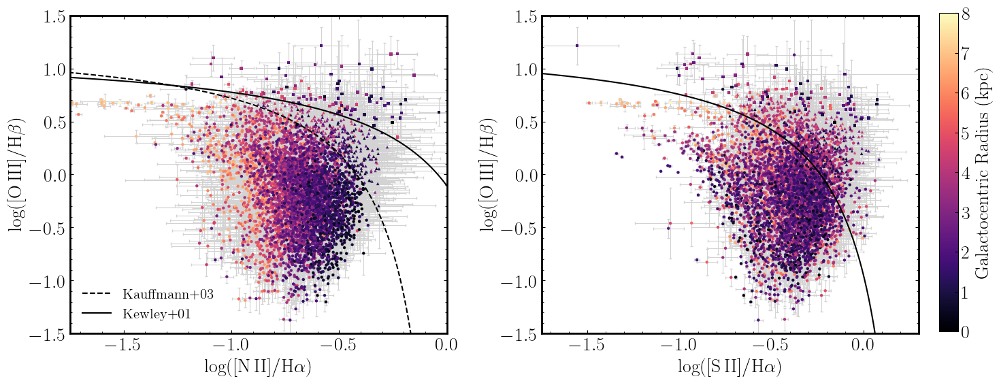

Using third color: False


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1193210986.py:127: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax1.scatter(subset['log_NII_Ha_sum_dered'], subset['log_OIII_Hb_sum_dered'],
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1193210986.py:170: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax2.scatter(subset['log_SII_Ha_sum_dered'], subset['log_OIII_Hb_sum_dered'],


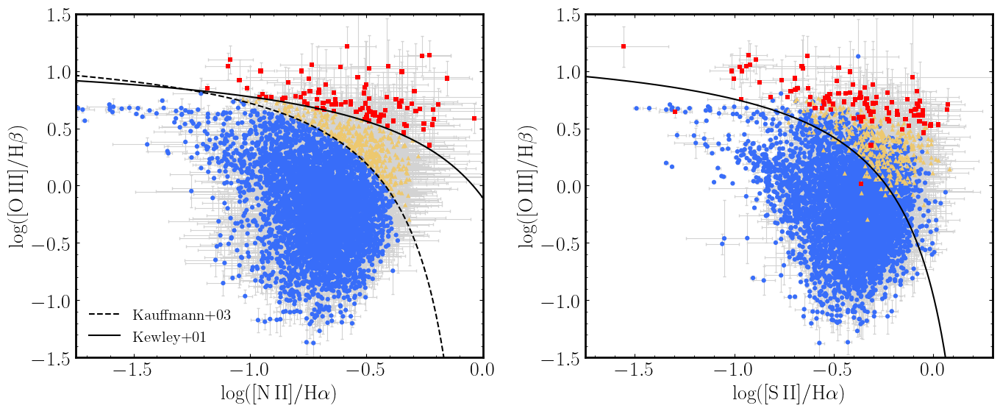

(<Figure size 1400x600 with 2 Axes>,
 (<Axes: xlabel='$\\log([\\mathrm{N\\,II}]/\\mathrm{H}\\alpha)$', ylabel='$\\log([\\mathrm{O\\,III}]/\\mathrm{H}\\beta)$'>,
  <Axes: xlabel='$\\log([\\mathrm{S\\,II}]/\\mathrm{H}\\alpha)$', ylabel='$\\log([\\mathrm{O\\,III}]/\\mathrm{H}\\beta)$'>))

In [16]:
snr_cut=3
plot_bpt(cat, snr_cut=snr_cut, marker_size = 10, color_col = 'R_gal_kpc', cmap='magma', vmin=0, vmax=8, colorbar_label='Galactocentric Radius (kpc)',
         savepath = f'plots/M33_allfields_BPT_SNR{snr_cut}_colored_by_radius.png')


plot_bpt(cat, snr_cut=snr_cut, marker_size = 20, 
         savepath = f'plots/M33_allfields_BPT_SNR{snr_cut}.png')

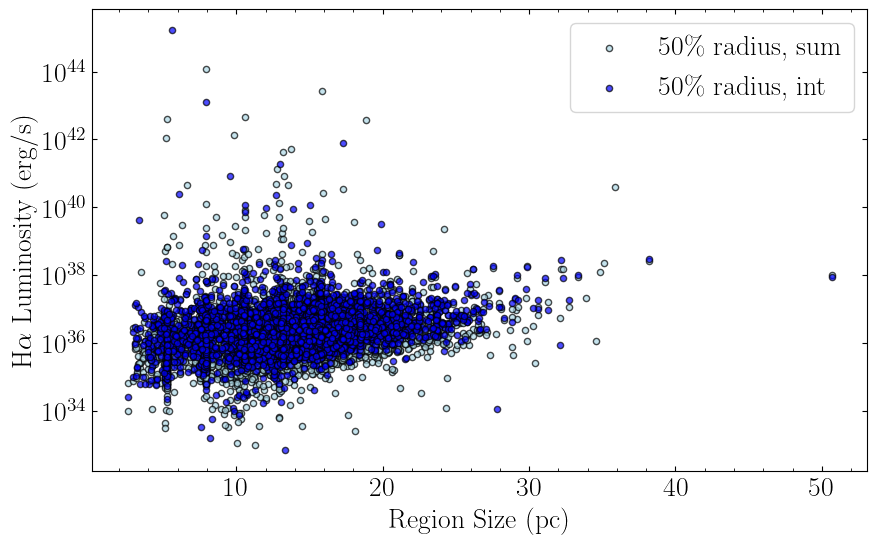

In [17]:
# plot radius vs luminosity
#don't include regions with tiny radius
mask = (cat['radius_p16_pc'] > 1) & (cat['radius_p50_pc'] > 1) & (cat['radius_p84_pc'] > 1)

plt.figure(figsize=(10, 6))
# plt.scatter(cat['radius_p84_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'hotpink', label = r'84\% radius')
plt.scatter(cat['radius_p50_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'lightblue', label = r'50\% radius, sum')
plt.scatter(cat['radius_p50_pc'][mask], cat['L_Ha_int_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'blue', label = r'50\% radius, int')

# plt.scatter(cat['radius_p16_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'lightgreen', label = r'16\% radius')
plt.yscale('log')
plt.xlabel('Region Size (pc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.legend()
plt.savefig('plots/M33_HII_luminosity_vs_radius.png', dpi=300, bbox_inches='tight')
plt.show()

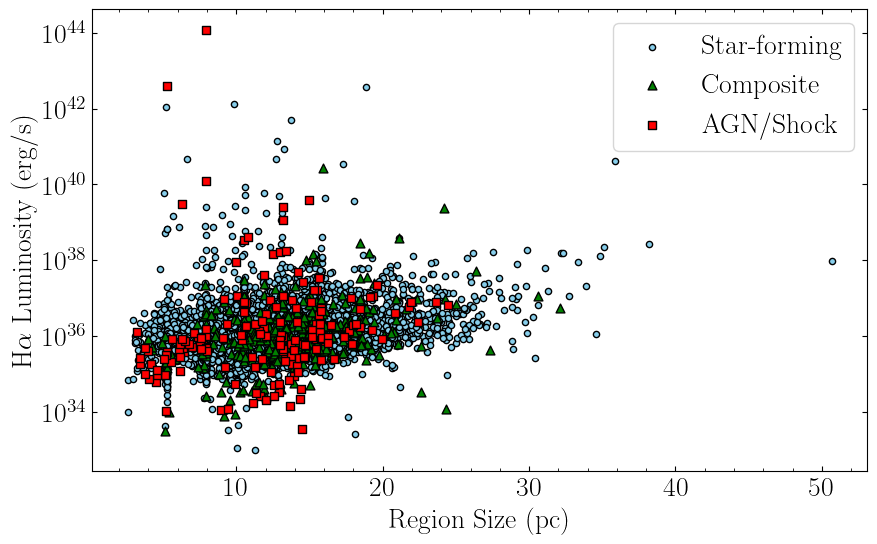

In [18]:
# plot radius vs luminosity
#don't include regions with tiny radius
mask = (cat['radius_p16_pc'] > 1) & (cat['radius_p50_pc'] > 1) & (cat['radius_p84_pc'] > 1)

plt.figure(figsize=(10, 6))
# plt.scatter(cat['radius_p84_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'purple', label = r'84\% radius')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'Star-forming')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'Star-forming')], 
            s=20, alpha=1, edgecolor='k', color = 'skyblue', marker='o', label='Star-forming')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'Composite')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'Composite')], 
            s=40, alpha=1, edgecolor='k', color = 'green', marker='^', label='Composite')

plt.scatter(cat['radius_p50_pc'][mask & (cat['BPT_class_sum_dered'] == 'AGN/Shock')], 
            cat['L_Ha_sum_dered'][mask & (cat['BPT_class_sum_dered'] == 'AGN/Shock')], 
            s=40, alpha=1, edgecolor='k', color = 'red', marker='s', label='AGN/Shock')

# plt.scatter(cat['radius_p16_pc'][mask], cat['L_Ha_sum_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'hotpink', label = r'16\% radius')
plt.yscale('log')
plt.xlabel('Region Size (pc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.legend()
plt.savefig('plots/M33_HII_luminosity_vs_radius_BPT.png', dpi=300, bbox_inches='tight')
plt.show()

In [19]:
def classify_symmetry(row, threshold=0.2):
    
    R16 = row['radius_p16_pc']
    R50 = row['radius_p50_pc']
    R84 = row['radius_p84_pc']

    if not np.isfinite(R16) or not np.isfinite(R50) or not np.isfinite(R84):
        return 'unknown'

    # Compute asymmetry metric
    if R84 != R16:
        asymmetry = abs(R84 - R16) / (R84 + R16)
    else:
        asymmetry = 0.0  # perfectly symmetric if R84 == R16

    if asymmetry < threshold:
        return 'symmetric'
    else:
        return 'asymmetric'
    
cat['symmetry_class'] = cat.apply(classify_symmetry, axis=1)

asymmetric: L = 3.30e+35 * R^0.52
symmetric: L = 2.32e+35 * R^0.69


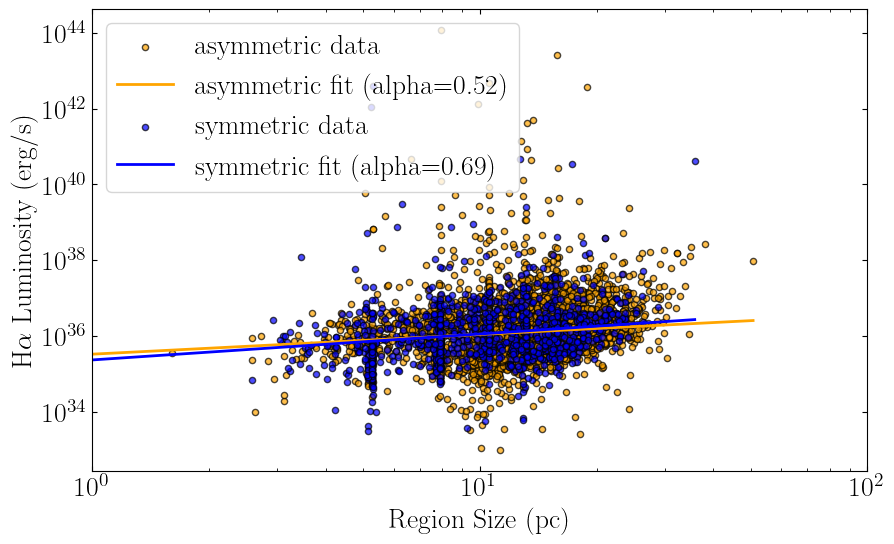

In [20]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

symmetry_colors = {
    'asymmetric': 'orange',
    'symmetric': 'blue'
}

for sym_class, color in symmetry_colors.items():
    subset = cat[cat['symmetry_class'] == sym_class]

    R = subset['radius_p50_pc'].values
    L = subset['L_Ha_sum_dered'].values

    # scatter
    plt.scatter(R, L, s=20, alpha=0.7, edgecolor='k',
                color=color, label=f"{sym_class} data")

    # remove non-positive values for log fitting
    mask = (R > 0) & (L > 0)
    R = R[mask]
    L = L[mask]

    # fit log(L) = alpha log(R) + log(A)
    logR = np.log10(R)
    logL = np.log10(L)

    alpha, logA = np.polyfit(logR, logL, 1)
    A = 10**logA

    print(f"{sym_class}: L = {A:.2e} * R^{alpha:.2f}")

    # generate fit line
    R_fit = np.linspace(R.min(), R.max(), 200)
    L_fit = A * R_fit**alpha

    plt.plot(R_fit, L_fit, color=color, lw=2,
             label=f"{sym_class} fit (alpha={alpha:.2f})")

plt.yscale('log')
plt.xscale('log')

plt.xlabel('Region Size (pc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.legend()
plt.xlim(1, 100)
plt.savefig('plots/M33_HII_luminosity_vs_radius_symmetry.png',
            dpi=300, bbox_inches='tight')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


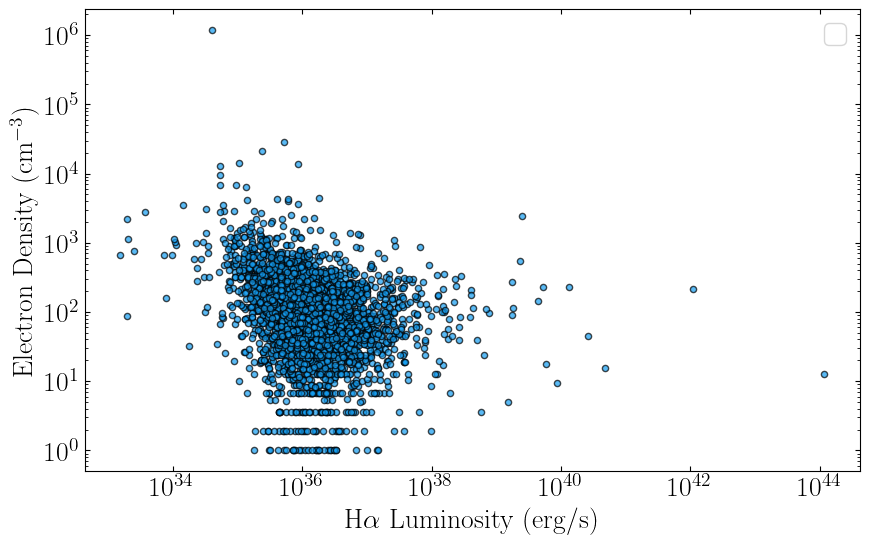

In [21]:
# plot density vs Ha Luminosity
plt.figure(figsize=(10, 6))
plt.scatter(cat['L_Ha_sum_dered'], cat['ne_SII_cm3'], s=20, alpha=0.7, edgecolor='k', color = colors[3])
plt.xscale('log')
plt.yscale('log')
plt.ylabel(r'Electron Density (cm$^{-3}$)')
plt.xlabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.legend()
plt.savefig('plots/M33_HII_luminosity_vs_density.png', dpi=300, bbox_inches='tight')
plt.show()  

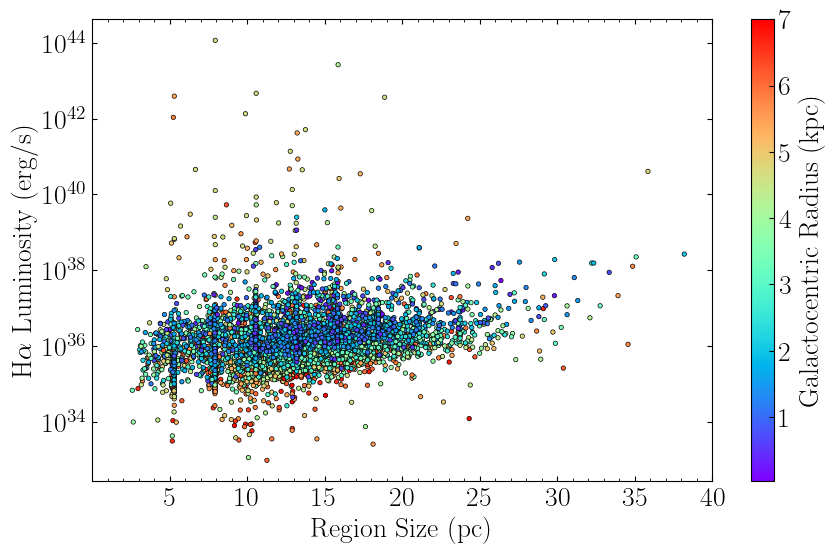

In [22]:
mask = (cat['radius_p16_pc'] > 1) & (cat['radius_p50_pc'] > 1) & (cat['radius_p84_pc'] > 1)

plt.figure(figsize=(10, 6))
plt.scatter(cat['radius_p50_pc'][mask], 
            cat['L_Ha_sum_dered'][mask], 
            s=10, alpha=1, c = cat['R_gal_kpc'][mask], vmax = 7, cmap = 'rainbow', edgecolor='k', linewidths=0.5,
            marker='o')
plt.yscale('log')
# plt.xscale('log')

#add x ticks at 10, 100, 1000
plt.xticks([5, 10, 15, 20, 25, 30, 35, 40, 45, 50], ['5', '10', '15', '20', '25', '30', '35', '40', '45', '50'])

plt.xlabel('Region Size (pc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.xlim(0,40)
# plt.legend()
plt.colorbar(label='Galactocentric Radius (kpc)')
plt.savefig('plots/M33_HII_luminosity_vs_radius_Rgal.png', dpi=300, bbox_inches='tight')
plt.show()

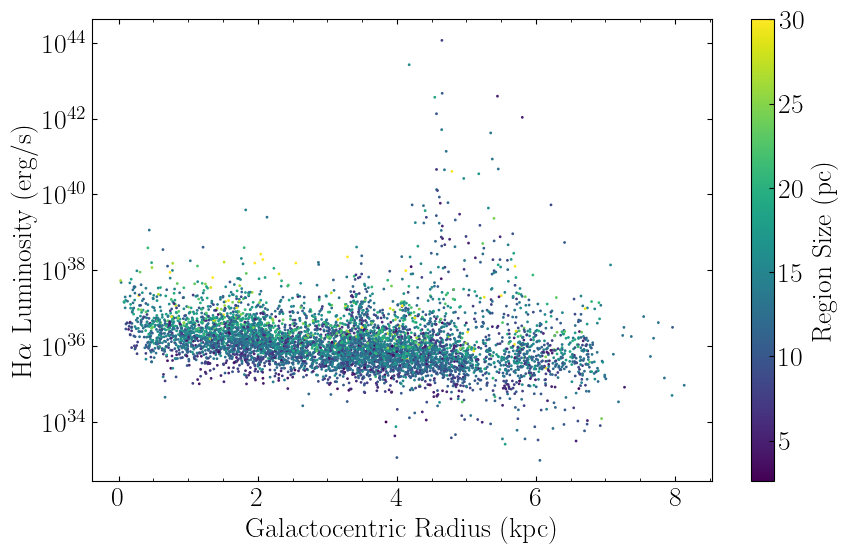

In [23]:
#plot luminosity vs galactocentric radius
plt.figure(figsize=(10, 6))
plt.scatter(cat['R_gal_kpc'][mask], 
            cat['L_Ha_sum_dered'][mask], 
            s=1, alpha=1, c = cat['radius_p50_pc'][mask], vmax = 30, marker='o')
plt.yscale('log')
plt.xlabel('Galactocentric Radius (kpc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.colorbar(label='Region Size (pc)')
plt.savefig('plots/M33_HII_luminosity_vs_Rgal.png', dpi=300, bbox_inches='tight')
plt.show()

In [24]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_int
F_Hbeta_e_int
SNR_Hbeta_int
F_[OIII]4959_int
F_[OIII]4959_e_int
SNR_[OIII]4959_int
F_[OI

In [25]:
# #plot Av vs galactocentric radius
# mask = np.isfinite(cat['sum_A_V']) & np.isfinite(cat['R_gal_kpc']) & (cat['sum_A_V'] > 0)  & (cat['sum_A_V'] < 3)

# plt.figure(figsize=(10, 6))
# plt.scatter(cat['R_gal_kpc'][mask], 
#             cat['sum_A_V'][mask],
#             s=10, alpha=0.1, c = colors[0], vmax = 30, marker='o',
#             )

# #bin the points and plot the median and +16/84 percentiles in each bin
# bins = np.arange(0, 20, 0.5)
# bin_centers = 0.5 * (bins[:-1] + bins[1:])
# medians = []
# upper_errs = []
# lower_errs = []
# stds = []  
# for i in range(len(bins) - 1):
#     in_bin = (cat['R_gal_kpc'] >= bins[i]) & (cat['R_gal_kpc'] < bins[i+1]) & mask
#     if np.sum(in_bin) > 0:
#         medians.append(np.median(cat['sum_A_V'][in_bin]))
#         lower_errs.append(np.percentile(cat['sum_A_V'][in_bin], 16))
#         upper_errs.append(np.percentile(cat['sum_A_V'][in_bin], 84))
#     else:
#         medians.append(np.nan)
#         lower_errs.append(np.nan)
#         upper_errs.append(np.nan)
        
# #convert to numpy arrays
# medians = np.array(medians)
# lower_errs = np.array(lower_errs)
# upper_errs = np.array(upper_errs)


# plt.errorbar(bin_centers, medians, yerr=[medians - lower_errs, upper_errs - medians], fmt='o', color='k', ecolor='k', 
#              elinewidth=1.5, capsize=3, label=r'Median $\pm1\sigma$ in bins')
# plt.xlabel('Galactocentric Radius (kpc)')
# plt.ylabel(r'Av (mag)')
# plt.minorticks_on()
# # plt.ylim(0, 3)
# plt.legend()
# plt.savefig('plots/M33_HII_Av_vs_Rgal.png', dpi=300, bbox_inches='tight')
# plt.show()


In [26]:
def plot_radial_gradient(
    cat,
    xcol,
    ycol,
    mask=None,
    bins=None,
    color='C0',
    xlabel='Galactocentric Radius (kpc)',
    ylabel='Value',
    title=None,
    scatter_label=None,
    summary_label=r'Median $\pm 1\sigma$ in bins',
    xlim=None,
    ylim=None,
    yscale='linear',
    savepath=None,
    show=True,
    figsize=(10, 6),
    scatter_kwargs=None,
    errorbar_kwargs=None,
    alpha=0.5,
):
    """
    Plot a radial gradient for ycol vs xcol, including scatter points and
    binned median with 16th/84th percentile error bars.

    Parameters
    ----------
    cat : dict-like, pandas DataFrame, astropy Table, or structured array
        Catalog containing xcol and ycol.
    xcol : str
        Name of the radius column (x-axis).
    ycol : str
        Name of the quantity column (y-axis).
    mask : array-like of bool, optional
        Boolean mask selecting rows to plot. If None, uses finite values only.
    bins : array-like, optional
        Bin edges. Default is np.arange(0, 20, 0.5).
    color : str, optional
        Scatter color.
    xlabel, ylabel : str, optional
        Axis labels.
    title : str, optional
        Plot title.
    scatter_label : str, optional
        Label for scatter points.
    summary_label : str, optional
        Label for binned median/error bars.
    xlim, ylim : tuple, optional
        Axis limits.
    savepath : str, optional
        If given, save figure to this path.
    show : bool, optional
        Whether to display the plot.
    figsize : tuple, optional
        Figure size.
    scatter_kwargs : dict, optional
        Extra keyword args passed to plt.scatter.
    errorbar_kwargs : dict, optional
        Extra keyword args passed to plt.errorbar.

    Returns
    -------
    results : dict
        Dictionary with bin_centers, medians, lower_errs, upper_errs.
    """
    x = np.asarray(cat[xcol])
    y = np.asarray(cat[ycol])

    if mask is None:
        mask = np.isfinite(x) & np.isfinite(y)
    else:
        mask = np.asarray(mask) & np.isfinite(x) & np.isfinite(y)

    if bins is None:
        bins = np.arange(0, 20, 0.5)

    scatter_defaults = dict(s=10, alpha=alpha, c=color, marker='o')
    if scatter_kwargs is not None:
        scatter_defaults.update(scatter_kwargs)

    errorbar_defaults = dict(
        fmt='o',
        color='k',
        ecolor='k',
        elinewidth=1.5,
        capsize=3,
        label=summary_label,
    )
    if errorbar_kwargs is not None:
        errorbar_defaults.update(errorbar_kwargs)

    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    medians = []
    lower_errs = []
    upper_errs = []
    counts = []

    for i in range(len(bins) - 1):
        in_bin = (x >= bins[i]) & (x < bins[i + 1]) & mask
        counts.append(np.sum(in_bin))

        if np.sum(in_bin) > 0:
            y_bin = y[in_bin]
            medians.append(np.median(y_bin))
            lower_errs.append(np.percentile(y_bin, 16))
            upper_errs.append(np.percentile(y_bin, 84))
        else:
            medians.append(np.nan)
            lower_errs.append(np.nan)
            upper_errs.append(np.nan)

    medians = np.array(medians)
    lower_errs = np.array(lower_errs)
    upper_errs = np.array(upper_errs)
    counts = np.array(counts)

    plt.figure(figsize=figsize)

    plt.scatter(x[mask], y[mask], label=scatter_label, **scatter_defaults)
    
    valid = np.isfinite(medians)
    plt.errorbar(
        bin_centers[valid],
        medians[valid],
        yerr=[
            medians[valid] - lower_errs[valid],
            upper_errs[valid] - medians[valid]
        ],
        **errorbar_defaults
    )

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.minorticks_on()
    plt.yscale(yscale)
    if title is not None:
        plt.title(title)
    if xlim is not None:
        plt.xlim(*xlim)
    if ylim is not None:
        plt.ylim(*ylim)

    if scatter_label is not None or summary_label is not None:
        plt.legend()

    if savepath is not None:
        plt.savefig(savepath, dpi=300, bbox_inches='tight')

    if show:
        plt.show()
    else:
        plt.close()

    return {
        'bin_centers': bin_centers,
        'medians': medians,
        'lower_errs': lower_errs,
        'upper_errs': upper_errs,
        'counts': counts,
    }

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1859541007.py:120: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(x[mask], y[mask], label=scatter_label, **scatter_defaults)


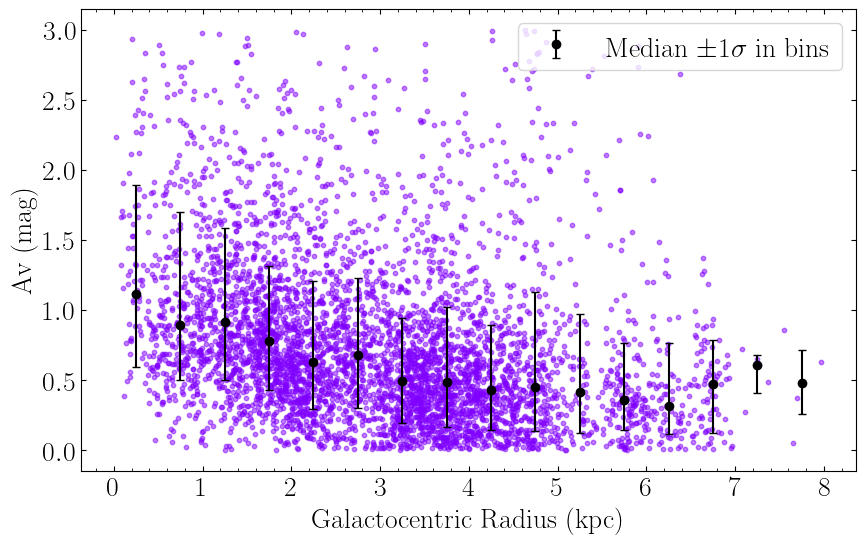

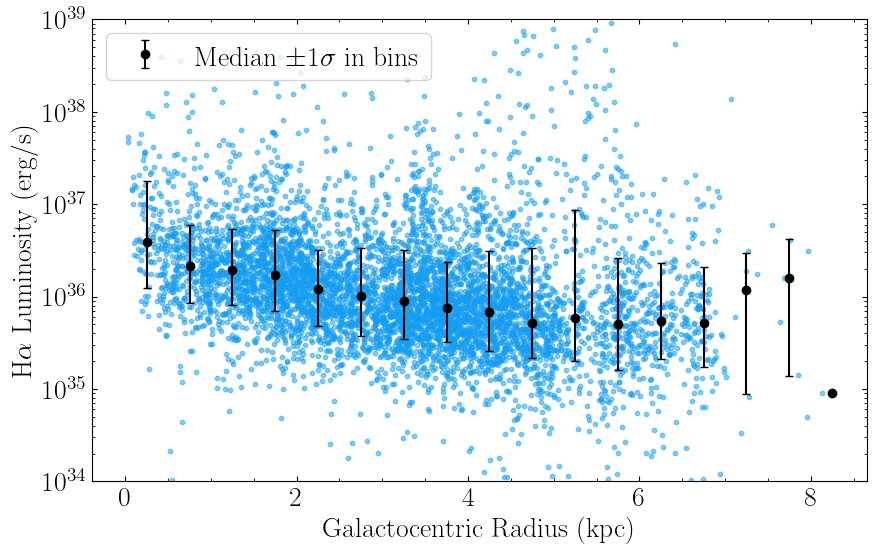

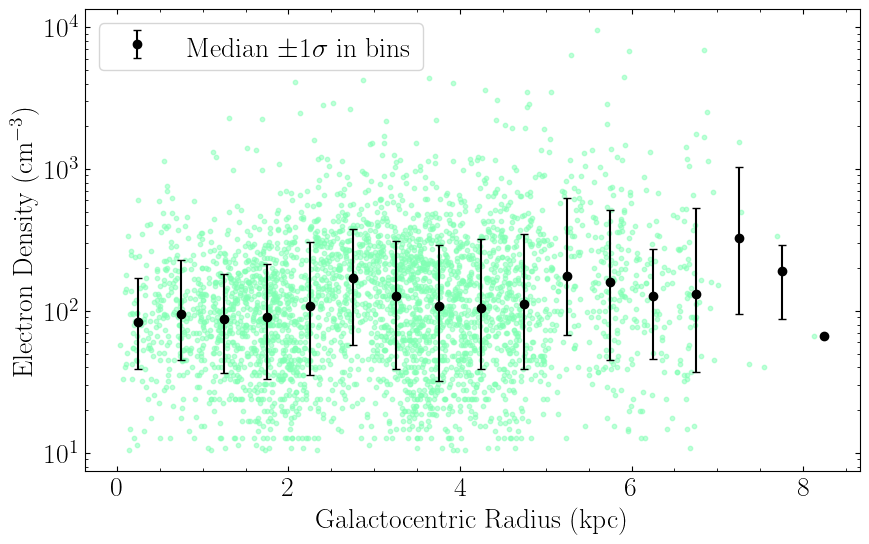

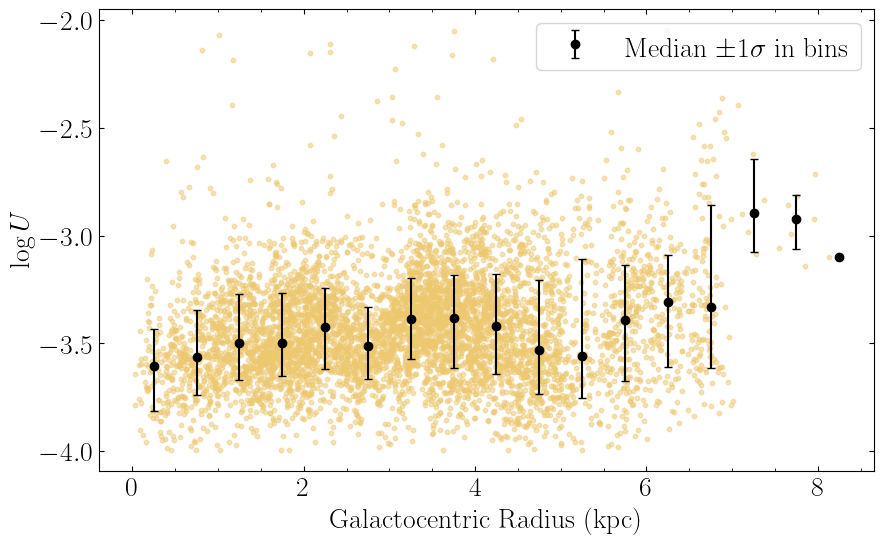

In [27]:
"""
AV
"""
mask = (
    np.isfinite(cat['sum_A_V']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['sum_A_V'] > 0) &
    (cat['sum_A_V'] < 3)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='sum_A_V',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=colors[0],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Av (mag)',
    savepath='plots/M33_HII_Av_vs_Rgal.png'
)

"""
Ha Luminosity
"""
mask = (
    np.isfinite(cat['L_Ha_sum_dered']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['L_Ha_sum_dered'] < 1e40) &
    (cat['L_Ha_sum_dered'] > 1e34)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='L_Ha_sum_dered',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=colors[3],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'H$\alpha$ Luminosity (erg/s)',
    ylim=(1e34, 1e39),
    yscale='log',
    savepath='plots/M33_HII_L_Ha_sum_dered_vs_Rgal.png'
)
"""
ne
"""
mask = (
    np.isfinite(cat['ne_SII_cm3']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['ne_SII_cm3'] < 10000) &
    (cat['ne_SII_cm3'] > 10)
)

results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='ne_SII_cm3',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=colors[7],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'Electron Density (cm$^{-3}$)',
    # ylim=(0, 1000),
    yscale='log',
    alpha=0.5,
    savepath='plots/M33_HII_ne_SII_cm3_vs_Rgal.png'
)

"""
Ionization parameter
"""

mask = (
    np.isfinite(cat['logU_KK04']) &
    np.isfinite(cat['R_gal_kpc']) &
    (cat['logU_KK04'] < -2) &
    (cat['logU_KK04'] > -4)
)
results = plot_radial_gradient(
    cat=cat,
    xcol='R_gal_kpc',
    ycol='logU_KK04',
    mask=mask,
    bins=np.arange(0, 20, 0.5),
    color=colors[10],
    xlabel='Galactocentric Radius (kpc)',
    ylabel=r'$\log U$',
    # ylim=(-4, -2),
    yscale='linear',
    alpha=0.5,
    savepath='plots/M33_HII_log_U_KK04_vs_Rgal.png'
)

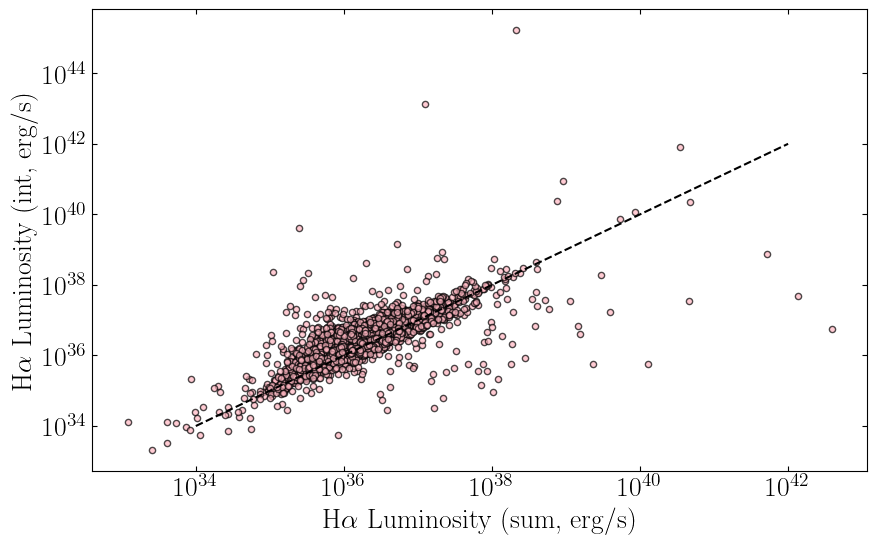

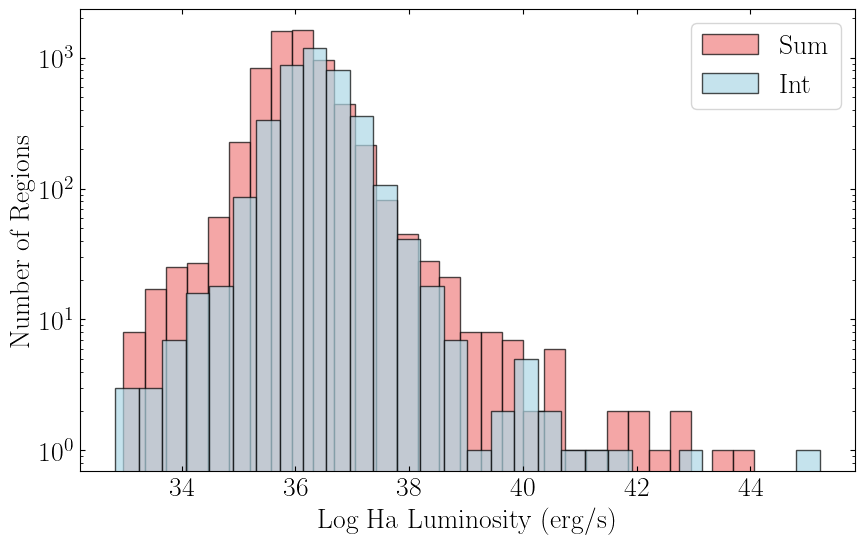

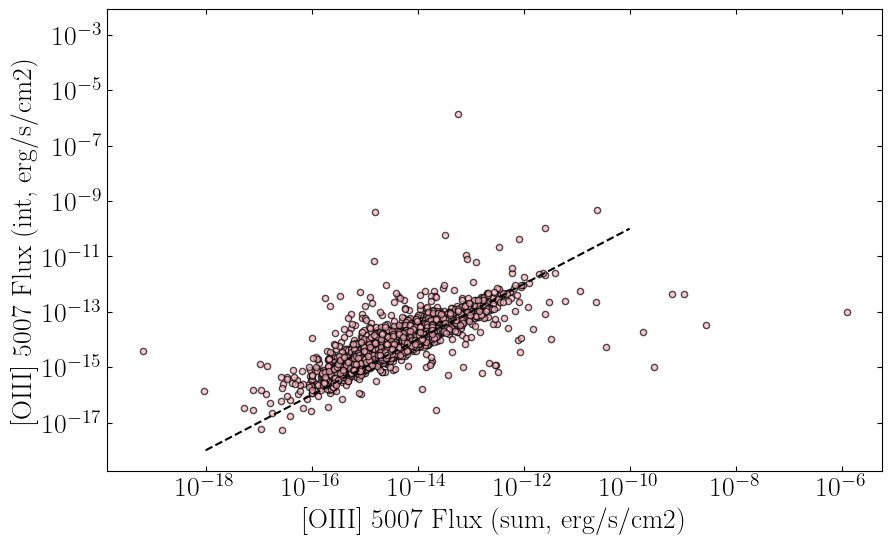

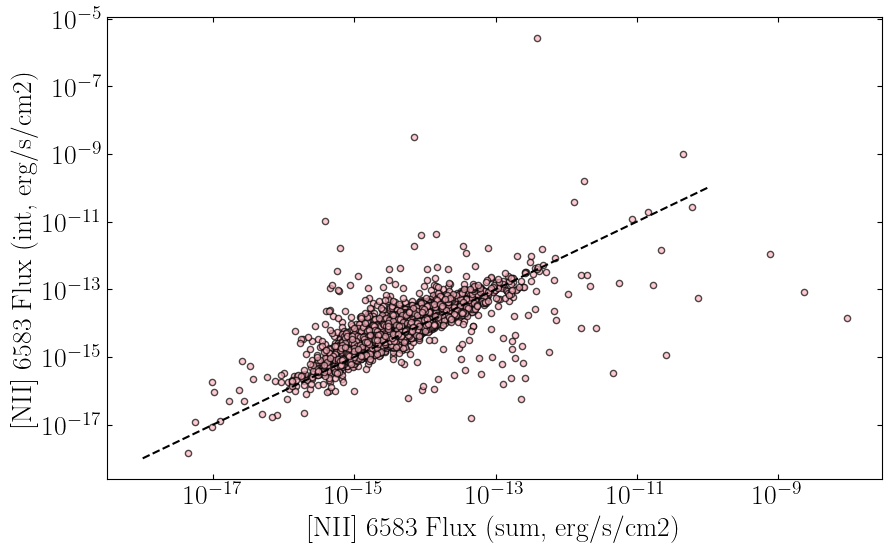

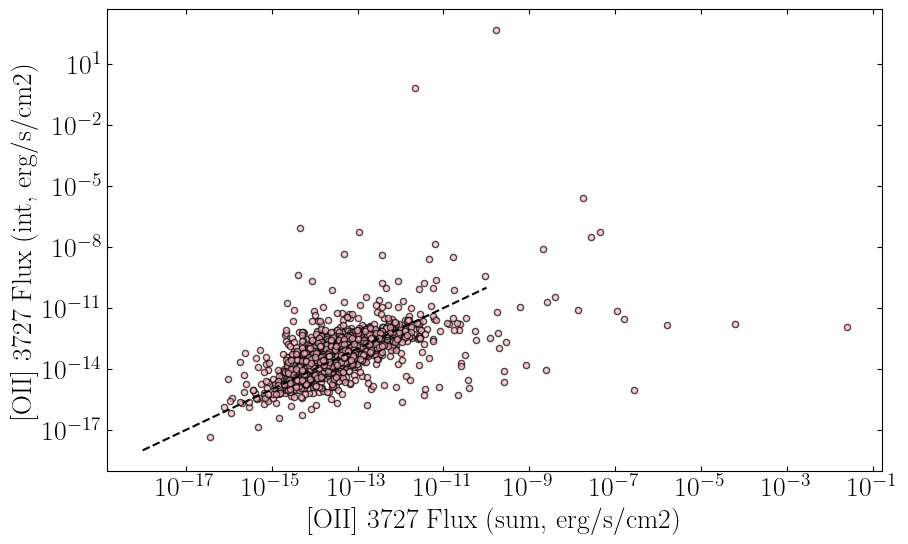

In [28]:
plt.figure(figsize=(10, 6))
plt.scatter(cat['L_Ha_sum_dered'], cat['L_Ha_int_dered'], s=20, alpha=0.7, edgecolor='k', color = 'lightpink')
plt.plot([1e34, 1e42], [1e34, 1e42], 'k--')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'H$\alpha$ Luminosity (sum, erg/s)')
plt.ylabel(r'H$\alpha$ Luminosity (int, erg/s)')
plt.minorticks_on()
plt.show()

#also make a histogram of the luminosities
plt.figure(figsize=(10, 6))
plt.hist(np.log10(cat['L_Ha_sum_dered']), bins=30, color='lightcoral', edgecolor='k', alpha=0.7, label='Sum')
plt.hist(np.log10(cat['L_Ha_int_dered']), bins=30, color='lightblue', edgecolor='k', alpha=0.7, label='Int')
# plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'Log Ha Luminosity (erg/s)')
plt.ylabel('Number of Regions')
plt.legend()
# plt.savefig('plots/M33_HII_luminosity_ratio_histogram.png', dpi=300, bbox_inches='tight')
plt.show()

#compare fluxes too

#OIII
plt.figure(figsize=(10, 6))
plt.scatter(cat['F_[OIII]5007_sum_dered'], cat['F_[OIII]5007_int_dered'], s=20, alpha=0.7, edgecolor='k', color = 'lightpink')
plt.plot([1e-18, 1e-10], [1e-18, 1e-10], 'k--')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'[OIII] 5007 Flux (sum, erg/s/cm2)')
plt.ylabel(r'[OIII] 5007 Flux (int, erg/s/cm2)')
plt.minorticks_on()
plt.show()

#NII
plt.figure(figsize=(10, 6))
plt.scatter(cat['F_[NII]6583_sum_dered'], cat['F_[NII]6583_int_dered'], s=20, alpha=0.7, edgecolor='k', color = 'lightpink')
plt.plot([1e-18, 1e-10], [1e-18, 1e-10], 'k--')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'[NII] 6583 Flux (sum, erg/s/cm2)')
plt.ylabel(r'[NII] 6583 Flux (int, erg/s/cm2)')
plt.minorticks_on()
plt.show()

#OII
plt.figure(figsize=(10, 6))
plt.scatter(cat['F_[OII]3727_sum_dered'], cat['F_[OII]3727_int_dered'], s=20, alpha=0.7, edgecolor='k', color = 'lightpink')
plt.plot([1e-18, 1e-10], [1e-18, 1e-10], 'k--') 
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'[OII] 3727 Flux (sum, erg/s/cm2)')
plt.ylabel(r'[OII] 3727 Flux (int, erg/s/cm2)')
plt.minorticks_on()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 50.0)

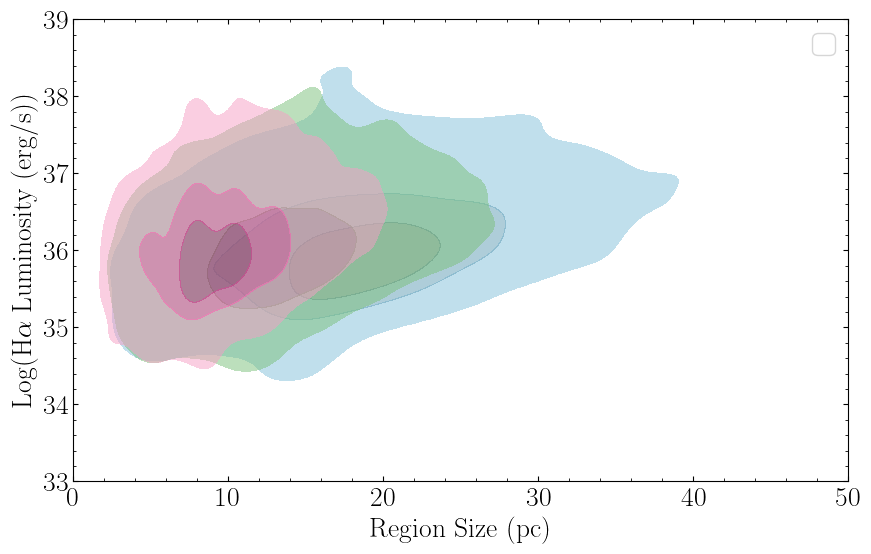

In [29]:

#remove nans and infs, and also filter out tiny radii
mask = (cat['radius_p16_pc'] > 1) & (cat['radius_p50_pc'] > 1) & (cat['radius_p84_pc'] > 1)

plt.figure(figsize=(10,6))
# plt.scatter(cat['radius_p84_pc'][mask], np.log10(cat['L_Ha_sum_dered'][mask]), s=20, alpha=1,  color = 'hotpink', label = r'84\% radius')
# plt.scatter(cat['radius_p50_pc'][mask], np.log10(cat['L_Ha_sum_dered'][mask]), s=20, alpha=1, color = 'lightblue', label = r'50\% radius')
# plt.scatter(cat['radius_p16_pc'][mask], np.log10(cat['L_Ha_sum_dered'][mask]), s=20, alpha=1, color = 'lightgreen', label = r'16\% radius')

sns.kdeplot(
    x=cat['radius_p84_pc'][mask],
    y=np.log10(cat['L_Ha_sum_dered'][mask]),
    levels=4,
    color='skyblue',
    # linewidths=2,
    label=r'84% radius',
    fill=True,
    alpha=0.5,
    thresh=0.05,
)

sns.kdeplot(
    x=cat['radius_p50_pc'][mask],
    y=np.log10(cat['L_Ha_sum_dered'][mask]),
    levels=3,
    color='lightgreen',
    # linewidths=2,
    label=r'50% radius',
    fill=True,
    alpha=0.5,
    thresh=0.05,
)

sns.kdeplot(
    x=cat['radius_p16_pc'][mask],
    y=np.log10(cat['L_Ha_sum_dered'][mask]),
    levels=4,
    color='hotpink',
    # linewidths=0,
    label=r'16% radius',
    fill=True,
    alpha=0.5,
    thresh=0.05,
    
)

# plt.yscale('log')
plt.xlabel('Region Size (pc)')
plt.ylabel(r'Log(H$\alpha$ Luminosity (erg/s))')
plt.minorticks_on()
#add legend for sns plot
plt.legend()
plt.ylim(33,39)
plt.xlim(0, 50)

# plt.savefig('plots/M33_HII_luminosity_vs_radius_contour.png',
#             dpi=300, bbox_inches='tight')
# plt.show()

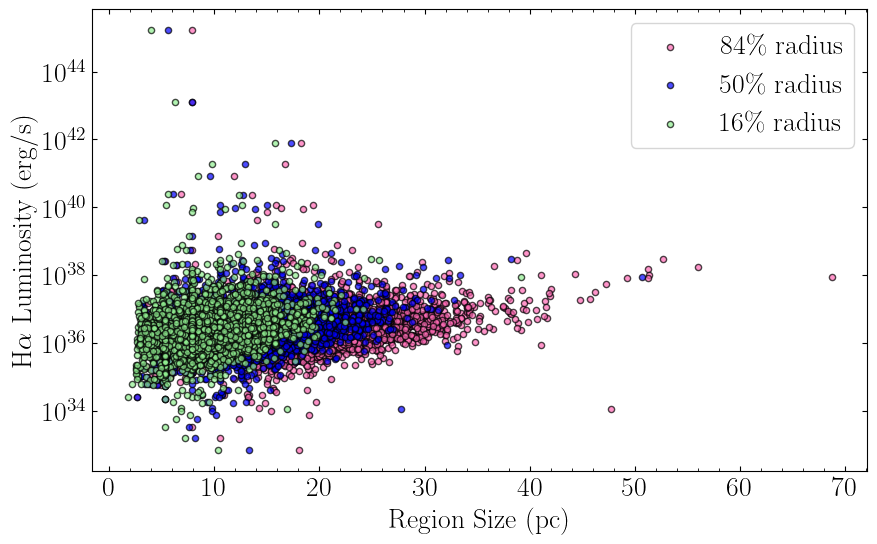

In [30]:
# plot radius vs luminosity
#don't include regions with tiny radius
mask = (cat['radius_p16_pc'] > 1) & (cat['radius_p50_pc'] > 1) & (cat['radius_p84_pc'] > 1)

plt.figure(figsize=(10, 6))
plt.scatter(cat['radius_p84_pc'][mask], cat['L_Ha_int_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'hotpink', label = r'84\% radius')
plt.scatter(cat['radius_p50_pc'][mask], cat['L_Ha_int_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'blue', label = r'50\% radius')
plt.scatter(cat['radius_p16_pc'][mask], cat['L_Ha_int_dered'][mask], s=20, alpha=0.7, edgecolor='k', color = 'lightgreen', label = r'16\% radius')
plt.yscale('log')
plt.xlabel('Region Size (pc)')
plt.ylabel(r'H$\alpha$ Luminosity (erg/s)')
plt.minorticks_on()
plt.legend()
plt.savefig('plots/M33_HII_luminosity_vs_radius.png', dpi=300, bbox_inches='tight')
plt.show()

In [31]:
# Print the range in value of each radius metric, exclusing values <= 1 pc
print(f"Radius p16 range: {cat['radius_p16_pc'][cat['radius_p16_pc'] > 1].min():.2f} - {cat['radius_p16_pc'][cat['radius_p16_pc'] > 1].max():.2f} pc")
print(f"Radius p50 range: {cat['radius_p50_pc'][cat['radius_p50_pc'] > 1].min():.2f} - {cat['radius_p50_pc'][cat['radius_p50_pc'] > 1].max():.2f} pc")
print(f"Radius p84 range: {cat['radius_p84_pc'][cat['radius_p84_pc'] > 1].min():.2f} - {cat['radius_p84_pc'][cat['radius_p84_pc'] > 1].max():.2f} pc")

Radius p16 range: 1.25 - 39.14 pc
Radius p50 range: 1.60 - 50.70 pc
Radius p84 range: 2.58 - 68.77 pc


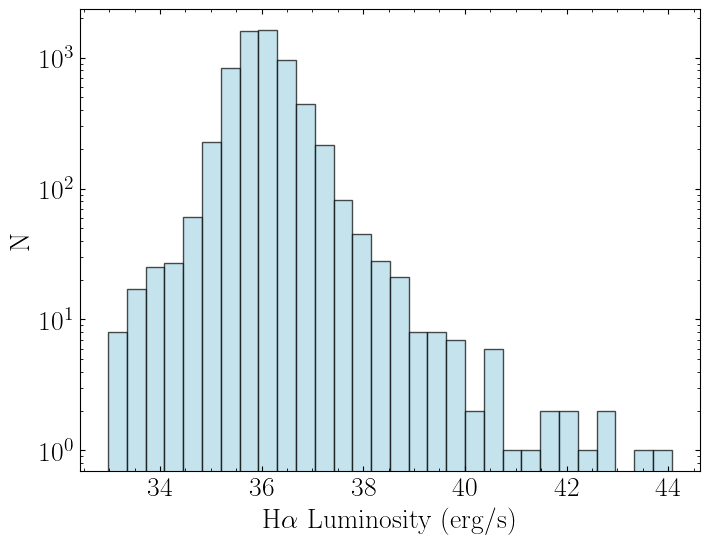

In [32]:
# plot the luminosity function
plt.figure(figsize=(8, 6))
plt.hist(np.log10(cat['L_Ha_sum_dered']), bins=30, color='lightblue', edgecolor='k', alpha = 0.7)
plt.xlabel(r'H$\alpha$ Luminosity (erg/s)')
plt.ylabel('N')
plt.yscale('log')
plt.minorticks_on()
# plt.grid(True, which='both', ls='--', lw=0.5)
plt.savefig('plots/M33_HII_luminosity_function.png', dpi=300, bbox_inches='tight')
plt.show()

Fit range: 36.00 <= log10(L) <= 40.00
Minimum bin count included: 0

Single power-law fit:
  log10(N) = a + b log10(L)
  a = 30.649
  b = -0.774
  RSS = 1.385, AIC = -113.269, BIC = -110.102

Broken power-law fit:
  a1      = 31.870
  b1      = -0.807
  b2      = -0.380
  x_break = 38.468
  RSS = 0.575, AIC = -140.940, BIC = -134.606

Preferred model:
  AIC prefers broken power law
  BIC prefers broken power law


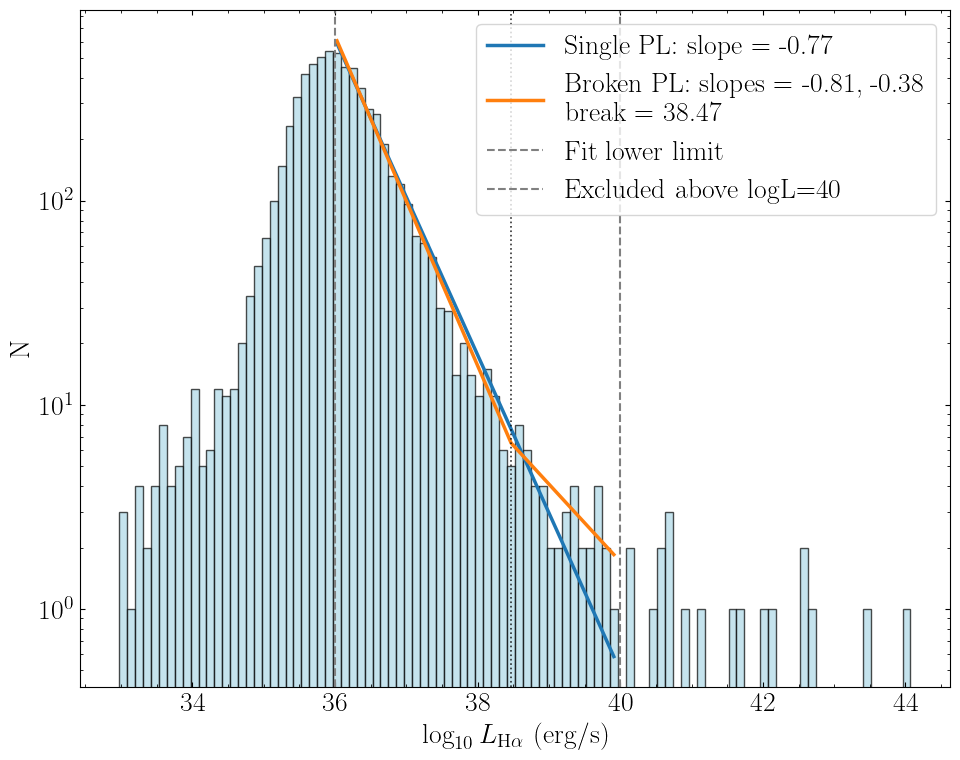

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --------------------------------------------------
# models: fit in log-log space, plot in count space
# x = log10(L), y = log10(N_bin)
# --------------------------------------------------
def single_powerlaw_log(x, a, b):
    return a + b * x

def broken_powerlaw_log(x, a1, b1, b2, x_break):
    y = np.empty_like(x)
    left = x < x_break
    y[left] = a1 + b1 * x[left]

    y_break = a1 + b1 * x_break
    y[~left] = y_break + b2 * (x[~left] - x_break)
    return y

def fit_stats(y_true, y_pred, k):
    n = len(y_true)
    rss = np.sum((y_true - y_pred)**2)
    rss = max(rss, 1e-12)
    aic = n * np.log(rss / n) + 2 * k
    bic = n * np.log(rss / n) + k * np.log(n)
    return rss, aic, bic

# --------------------------------------------------
# data
# --------------------------------------------------
logL = np.log10(cat['L_Ha_sum_dered'])
logL = logL[np.isfinite(logL)]

# histogram setup
bins = 100
counts, edges = np.histogram(logL, bins=bins)
centers = 0.5 * (edges[:-1] + edges[1:])

# --------------------------------------------------
# fitting mask
# --------------------------------------------------
# choose lower limit for the tail fit
x_min_fit = np.percentile(logL, 50)   # or set manually, e.g. 37.2

# exclude very bright bins from fit
x_max_fit = 40

# also exclude sparse bins
min_bin_count = 0

fit_mask = (
    (centers >= x_min_fit) &
    (centers <= x_max_fit) &
    (counts >= min_bin_count)
)

x_fit = centers[fit_mask]
y_fit = np.log10(counts[fit_mask])

# Poisson uncertainty in log10(N)
sigma_fit = 1.0 / (np.log(10) * np.sqrt(counts[fit_mask]))

if len(x_fit) < 5:
    raise ValueError(
        "Not enough bins for fitting after masking. "
        "Try lowering x_min_fit, lowering min_bin_count, or increasing number of bins."
    )

# --------------------------------------------------
# single power-law fit
# --------------------------------------------------
p0_single = [np.max(y_fit), -1.0]
popt_single, pcov_single = curve_fit(
    single_powerlaw_log,
    x_fit, y_fit,
    p0=p0_single,
    sigma=sigma_fit,
    absolute_sigma=True,
    maxfev=20000
)

y_single_fit = single_powerlaw_log(x_fit, *popt_single)
rss1, aic1, bic1 = fit_stats(y_fit, y_single_fit, k=2)

# --------------------------------------------------
# broken power-law fit
# --------------------------------------------------
x_break0 = np.median(x_fit)
p0_broken = [np.max(y_fit), -0.5, -2.0, x_break0]

bounds = (
    [-np.inf, -10, -10, np.min(x_fit)],
    [ np.inf,  10,  10, np.max(x_fit)]
)

popt_broken, pcov_broken = curve_fit(
    broken_powerlaw_log,
    x_fit, y_fit,
    p0=p0_broken,
    bounds=bounds,
    sigma=sigma_fit,
    absolute_sigma=True,
    maxfev=50000
)

y_broken_fit = broken_powerlaw_log(x_fit, *popt_broken)
rss2, aic2, bic2 = fit_stats(y_fit, y_broken_fit, k=4)

# --------------------------------------------------
# report
# --------------------------------------------------
print(f"Fit range: {x_min_fit:.2f} <= log10(L) <= {x_max_fit:.2f}")
print(f"Minimum bin count included: {min_bin_count}")

print("\nSingle power-law fit:")
print(f"  log10(N) = a + b log10(L)")
print(f"  a = {popt_single[0]:.3f}")
print(f"  b = {popt_single[1]:.3f}")
print(f"  RSS = {rss1:.3f}, AIC = {aic1:.3f}, BIC = {bic1:.3f}")

print("\nBroken power-law fit:")
print(f"  a1      = {popt_broken[0]:.3f}")
print(f"  b1      = {popt_broken[1]:.3f}")
print(f"  b2      = {popt_broken[2]:.3f}")
print(f"  x_break = {popt_broken[3]:.3f}")
print(f"  RSS = {rss2:.3f}, AIC = {aic2:.3f}, BIC = {bic2:.3f}")

print("\nPreferred model:")
print("  AIC prefers broken power law" if aic2 < aic1 else "  AIC prefers single power law")
print("  BIC prefers broken power law" if bic2 < bic1 else "  BIC prefers single power law")

# --------------------------------------------------
# plot histogram with overplotted fits
# --------------------------------------------------
plt.figure(figsize=(10, 8))

# histogram
plt.hist(logL, bins=bins, color='lightblue', edgecolor='k', alpha=0.7)

# show fitted bins
# plt.scatter(
#     x_fit, counts[fit_mask],
#     color='k', s=35, zorder=5,
#     label='Bins used in fit'
# )

# smooth x grid over fit range only
x_line = np.linspace(np.min(x_fit), np.max(x_fit), 400)

# convert fitted log10(N) back to N for plotting on histogram
y_line_single = 10**single_powerlaw_log(x_line, *popt_single)
y_line_broken = 10**broken_powerlaw_log(x_line, *popt_broken)

plt.plot(
    x_line, y_line_single,
    lw=2.5,
    label=f'Single PL: slope = {popt_single[1]:.2f}'
)

plt.plot(
    x_line, y_line_broken,
    lw=2.5,
    label=(f'Broken PL: slopes = {popt_broken[1]:.2f}, {popt_broken[2]:.2f}\n'
           f'break = {popt_broken[3]:.2f}')
)

# mark fit limits
plt.axvline(x_min_fit, color='gray', ls='--', lw=1.5, label='Fit lower limit')
plt.axvline(x_max_fit, color='gray', ls='--', lw=1.5, label='Excluded above logL=40')
plt.axvline(popt_broken[3], color='k', ls=':', lw=1.2, alpha=0.8)

plt.xlabel(r'$\log_{10} L_{\mathrm{H}\alpha}$ (erg/s)')
plt.ylabel('N')
plt.yscale('log')
plt.minorticks_on()
plt.legend()
plt.tight_layout()
plt.savefig('plots/M33_HII_luminosity_function_with_overplotted_fits.png',
            dpi=300, bbox_inches='tight')
plt.show()

In [34]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.optimize import curve_fit
# from scipy.special import logsumexp

# # ============================================================
# # Santoro / Clauset-style continuous power-law fit
# # ============================================================

# def empirical_cdf(sorted_x):
#     """Empirical CDF evaluated at sorted data."""
#     n = len(sorted_x)
#     return np.arange(1, n + 1) / n

# def model_cdf_continuous_powerlaw(x, xmin, alpha):
#     """
#     Continuous power-law CDF for x >= xmin:
#         p(x) = (alpha - 1) * xmin^(alpha - 1) * x^(-alpha)
#     so
#         F(x) = 1 - (x/xmin)^(1-alpha)
#     """
#     return 1.0 - (x / xmin) ** (1.0 - alpha)

# def loglik_continuous_powerlaw(x, xmin, alpha):
#     """
#     Log-likelihood for continuous power law for data x >= xmin.
#     """
#     n = len(x)
#     if n == 0 or alpha <= 1 or xmin <= 0 or np.any(x < xmin):
#         return -np.inf
#     return n * np.log(alpha - 1.0) + n * (alpha - 1.0) * np.log(xmin) - alpha * np.sum(np.log(x))

# def ks_statistic_continuous_powerlaw(x, xmin, alpha):
#     """
#     KS statistic between empirical CDF and model CDF for x >= xmin.
#     """
#     x = np.sort(x)
#     F_emp = empirical_cdf(x)
#     F_model = model_cdf_continuous_powerlaw(x, xmin, alpha)
#     return np.max(np.abs(F_emp - F_model))

# def gaussian(x, A, mu, sigma):
#     return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# def fit_alpha_uncertainty_from_likelihood(x_tail, xmin, alpha_best, alpha_min=1.01, alpha_max=3.0, n_alpha_grid=1000):
#     """
#     Estimate alpha uncertainty by fitting a Gaussian to the relative likelihood
#     curve as a function of alpha, following the description you quoted.
#     """
#     alpha_grid = np.linspace(alpha_min, alpha_max, n_alpha_grid)
#     logL = np.array([loglik_continuous_powerlaw(x_tail, xmin, a) for a in alpha_grid])

#     # normalize likelihood safely
#     rel_like = np.exp(logL - np.max(logL))

#     # focus on region near the peak for stability
#     peak_mask = rel_like > 0.05
#     x_fit = alpha_grid[peak_mask]
#     y_fit = rel_like[peak_mask]

#     # fallback if peak region too small
#     if len(x_fit) < 10:
#         x_fit = alpha_grid
#         y_fit = rel_like

#     p0 = [1.0, alpha_best, 0.1]
#     bounds = ([0.0, alpha_min, 1e-4], [np.inf, alpha_max, 10.0])

#     try:
#         popt, pcov = curve_fit(gaussian, x_fit, y_fit, p0=p0, bounds=bounds, maxfev=20000)
#         _, mu, sigma = popt
#         return sigma, alpha_grid, rel_like, popt
#     except Exception:
#         # robust fallback: weighted std of the likelihood curve
#         w = rel_like / np.sum(rel_like)
#         mu = np.sum(w * alpha_grid)
#         sigma = np.sqrt(np.sum(w * (alpha_grid - mu)**2))
#         return sigma, alpha_grid, rel_like, None

# def santoro_powerlaw_fit(
#     L,
#     alpha_range=(1.01, 3.0),
#     n_alpha_grid=2000,
#     n_bootstrap=1000,
#     random_seed=42,
#     verbose=True
# ):
#     """
#     Fit luminosities with the Santoro / Clauset method described by the user.

#     Parameters
#     ----------
#     L : array-like
#         Luminosities in linear space (NOT log10).
#     alpha_range : tuple
#         Allowed alpha interval, default (1.01, 3.0).
#     n_alpha_grid : int
#         Number of alpha grid points for the likelihood search.
#     n_bootstrap : int
#         Number of bootstrap realizations for xmin uncertainty.
#     random_seed : int
#         RNG seed.
#     verbose : bool
#         Print summary.

#     Returns
#     -------
#     results : dict
#     """
#     rng = np.random.default_rng(random_seed)

#     # clean data
#     L = np.asarray(L, dtype=float)
#     L = L[np.isfinite(L)]
#     L = L[L > 0]
#     L = np.sort(L)

#     if len(L) < 20:
#         raise ValueError("Need at least ~20 positive luminosities for a meaningful power-law fit.")

#     # Santoro-style xmin search range: median ± 1 sigma
#     med = np.median(L)
#     sig = np.std(L, ddof=1)
#     xmin_lo = med - sig
#     xmin_hi = med + sig

#     # keep only empirical data points in that range as xmin candidates
#     xmin_candidates = L[(L >= xmin_lo) & (L <= xmin_hi)]
#     xmin_candidates = np.unique(xmin_candidates)

#     if len(xmin_candidates) == 0:
#         raise ValueError("No empirical Lmin candidates found within median ± 1σ.")

#     alpha_min, alpha_max = alpha_range
#     alpha_grid = np.linspace(alpha_min, alpha_max, n_alpha_grid)

#     fit_rows = []

#     # ------------------------------------------------------------
#     # For each candidate xmin:
#     #   1) keep tail x >= xmin
#     #   2) compute likelihood over alpha grid
#     #   3) choose alpha maximizing likelihood
#     #   4) compute KS
#     # ------------------------------------------------------------
#     print(f"Testing {len(xmin_candidates)} candidate Lmin values...")
#     for xmin in xmin_candidates:
#         x_tail = L[L >= xmin]
#         n_tail = len(x_tail)

#         # Need enough points above xmin
#         if n_tail < 10:
#             continue

#         logL_grid = np.array([loglik_continuous_powerlaw(x_tail, xmin, a) for a in alpha_grid])
#         i_best = np.argmax(logL_grid)
#         alpha_best_here = alpha_grid[i_best]
#         logL_best_here = logL_grid[i_best]
#         ks_here = ks_statistic_continuous_powerlaw(x_tail, xmin, alpha_best_here)

#         fit_rows.append({
#             "xmin": xmin,
#             "n_tail": n_tail,
#             "alpha": alpha_best_here,
#             "logL": logL_best_here,
#             "ks": ks_here,
#         })

#     if len(fit_rows) == 0:
#         raise ValueError("No valid fits found. Try checking the luminosity array or relaxing constraints.")

#     # choose model minimizing KS
#     fit_rows = sorted(fit_rows, key=lambda r: r["ks"])
#     best = fit_rows[0]

#     xmin_best = best["xmin"]
#     alpha_best = best["alpha"]
#     ks_best = best["ks"]
#     n_tail_best = best["n_tail"]

#     x_tail_best = L[L >= xmin_best]

#     # ------------------------------------------------------------
#     # Bootstrap uncertainty on xmin
#     # ------------------------------------------------------------
#     print(f"Computing bootstrap uncertainties with {n_bootstrap} realizations...")
#     bootstrap_xmins = []
#     bootstrap_alphas = []

#     for _ in range(n_bootstrap):
#         L_boot = rng.choice(L, size=len(L), replace=True)
#         L_boot = np.sort(L_boot)

#         med_b = np.median(L_boot)
#         sig_b = np.std(L_boot, ddof=1)
#         xmin_lo_b = med_b - sig_b
#         xmin_hi_b = med_b + sig_b

#         xmin_candidates_b = np.unique(L_boot[(L_boot >= xmin_lo_b) & (L_boot <= xmin_hi_b)])

#         best_b = None
#         for xmin_b in xmin_candidates_b:
#             x_tail_b = L_boot[L_boot >= xmin_b]
#             if len(x_tail_b) < 10:
#                 continue

#             logL_grid_b = np.array([loglik_continuous_powerlaw(x_tail_b, xmin_b, a) for a in alpha_grid])
#             i_best_b = np.argmax(logL_grid_b)
#             alpha_b = alpha_grid[i_best_b]
#             ks_b = ks_statistic_continuous_powerlaw(x_tail_b, xmin_b, alpha_b)

#             row_b = {"xmin": xmin_b, "alpha": alpha_b, "ks": ks_b}
#             if (best_b is None) or (ks_b < best_b["ks"]):
#                 best_b = row_b

#         if best_b is not None:
#             bootstrap_xmins.append(best_b["xmin"])
#             bootstrap_alphas.append(best_b["alpha"])

#     bootstrap_xmins = np.array(bootstrap_xmins)
#     bootstrap_alphas = np.array(bootstrap_alphas)

#     xmin_err = np.std(bootstrap_xmins, ddof=1) if len(bootstrap_xmins) > 1 else np.nan

#     # ------------------------------------------------------------
#     # Alpha uncertainty from Gaussian fit to likelihood curve
#     # at the best xmin
#     # ------------------------------------------------------------
#     alpha_err, alpha_likelihood_grid, rel_like, gaussian_fit = fit_alpha_uncertainty_from_likelihood(
#         x_tail_best, xmin_best, alpha_best,
#         alpha_min=alpha_min, alpha_max=alpha_max,
#         n_alpha_grid=1000
#     )

#     if verbose:
#         print("================================================")
#         print("Santoro / Clauset power-law fit")
#         print("================================================")
#         print(f"N total                = {len(L)}")
#         print(f"N used above Lmin      = {n_tail_best}")
#         print(f"Lmin search range      = [{xmin_lo:.3e}, {xmin_hi:.3e}]")
#         print(f"Best Lmin              = {xmin_best:.3e}")
#         print(f"Best alpha             = {alpha_best:.4f}")
#         print(f"KS statistic           = {ks_best:.4f}")
#         print(f"sigma(Lmin) bootstrap  = {xmin_err:.3e}")
#         print(f"sigma(alpha) likelihood= {alpha_err:.4f}")
#         print("================================================")

#     return {
#         "L": L,
#         "xmin_best": xmin_best,
#         "alpha_best": alpha_best,
#         "ks_best": ks_best,
#         "n_tail_best": n_tail_best,
#         "xmin_err": xmin_err,
#         "alpha_err": alpha_err,
#         "bootstrap_xmins": bootstrap_xmins,
#         "bootstrap_alphas": bootstrap_alphas,
#         "fit_rows": fit_rows,
#         "alpha_likelihood_grid": alpha_likelihood_grid,
#         "alpha_relative_likelihood": rel_like,
#         "alpha_gaussian_fit": gaussian_fit,
#         "xmin_search_range": (xmin_lo, xmin_hi),
#     }

# # ============================================================
# # Plotting helpers
# # ============================================================

# def plot_santoro_ccdf(results, outfile=None):
#     """
#     Plot empirical CCDF and best-fit model.
#     """
#     L = results["L"]
#     xmin = results["xmin_best"]
#     alpha = results["alpha_best"]

#     # empirical CCDF
#     x = np.sort(L)
#     ccdf_emp = 1.0 - (np.arange(1, len(x)+1) / len(x)) + 1/len(x)

#     # tail only
#     x_tail = x[x >= xmin]
#     n_tail = len(x_tail)
#     ccdf_tail_emp = 1.0 - (np.arange(1, n_tail+1) / n_tail) + 1/n_tail

#     # model CCDF for x >= xmin
#     x_model = np.logspace(np.log10(xmin), np.log10(np.max(x_tail)), 300)
#     ccdf_model = (x_model / xmin) ** (1.0 - alpha)

#     plt.figure(figsize=(7, 6))
#     plt.loglog(x, ccdf_emp, 'o', ms=4, alpha=0.5, label='Empirical CCDF (all data)')
#     plt.loglog(x_tail, ccdf_tail_emp, 'o', ms=4, label='Empirical CCDF (L ≥ Lmin)')
#     plt.loglog(x_model, ccdf_model, lw=2.5, label=fr'Best fit: $\alpha={alpha:.2f}$')

#     plt.axvline(xmin, color='k', ls='--', lw=1.5, label=fr'$L_{{\min}}={xmin:.2e}$')
#     plt.xlabel(r'$L_{\mathrm{H}\alpha}$ (erg s$^{-1}$)')
#     plt.ylabel(r'$P(L^\prime \geq L)$')
#     plt.legend()
#     plt.minorticks_on()
#     plt.tight_layout()

#     if outfile is not None:
#         plt.savefig(outfile, dpi=300, bbox_inches='tight')
#     plt.show()

# def plot_santoro_histogram_with_tail_model(results, bins=30, outfile=None):
#     """
#     Plot histogram in logL, and overplot the implied model tail.
#     This is for visualization only; the fit itself is unbinned.
#     """
#     L = results["L"]
#     xmin = results["xmin_best"]
#     alpha = results["alpha_best"]

#     logL = np.log10(L)
#     counts, edges = np.histogram(logL, bins=bins)
#     centers = 0.5 * (edges[:-1] + edges[1:])
#     dlogL = np.diff(edges)

#     # Build expected differential counts from the best-fit model.
#     # Use the observed number of points above xmin to normalize.
#     n_tail = np.sum(L >= xmin)

#     # convert histogram bin edges from logL to L
#     L_edges = 10**edges

#     model_counts = np.zeros_like(counts, dtype=float)

#     for i in range(len(counts)):
#         L1 = L_edges[i]
#         L2 = L_edges[i+1]

#         if L2 <= xmin:
#             model_counts[i] = np.nan
#             continue

#         # clip lower edge to xmin for the power-law tail
#         L1_eff = max(L1, xmin)

#         # Integral of normalized PDF over [L1_eff, L2]
#         # p(L) = (alpha-1) xmin^(alpha-1) L^(-alpha)
#         prob = (xmin**(alpha - 1.0)) * (L1_eff**(1.0 - alpha) - L2**(1.0 - alpha))
#         model_counts[i] = n_tail * prob

#     plt.figure(figsize=(8, 6))
#     plt.hist(logL, bins=bins, color='lightblue', edgecolor='k', alpha=0.7, label='Data')
#     plt.plot(centers, model_counts, lw=2.5, label=fr'Unbinned PL fit: $\alpha={alpha:.2f}$')
#     plt.axvline(np.log10(xmin), color='k', ls='--', lw=1.5, label=fr'$\log L_{{\min}}={np.log10(xmin):.2f}$')

#     plt.xlabel(r'$\log_{10} L_{\mathrm{H}\alpha}$ (erg/s)')
#     plt.ylabel('Number of Regions')
#     plt.yscale('log')
#     plt.minorticks_on()
#     plt.legend()
#     plt.tight_layout()

#     if outfile is not None:
#         plt.savefig(outfile, dpi=300, bbox_inches='tight')
#     plt.show()

# def plot_alpha_likelihood(results, outfile=None):
#     """
#     Plot relative likelihood vs alpha and the Gaussian fit used for sigma(alpha).
#     """
#     alpha_grid = results["alpha_likelihood_grid"]
#     rel_like = results["alpha_relative_likelihood"]
#     gfit = results["alpha_gaussian_fit"]

#     plt.figure(figsize=(7, 5))
#     plt.plot(alpha_grid, rel_like, lw=2, label='Relative likelihood')

#     if gfit is not None:
#         plt.plot(alpha_grid, gaussian(alpha_grid, *gfit), '--', lw=2,
#                  label=fr'Gaussian fit ($\sigma_\alpha={gfit[2]:.3f}$)')

#     plt.axvline(results["alpha_best"], color='k', ls=':', label=fr'Best $\alpha={results["alpha_best"]:.3f}$')
#     plt.xlabel(r'$\alpha$')
#     plt.ylabel('Relative likelihood')
#     plt.legend()
#     plt.tight_layout()

#     if outfile is not None:
#         plt.savefig(outfile, dpi=300, bbox_inches='tight')
#     plt.show()

# # ============================================================
# # Example usage on your catalog
# # ============================================================

# # Use linear luminosities, not log10 luminosities
# L = np.asarray(cat['L_Ha_sum_dered'], dtype=float)

# results = santoro_powerlaw_fit(
#     L,
#     alpha_range=(1.01, 3.0),
#     n_alpha_grid=2000,
#     n_bootstrap=10,
#     random_seed=42,
#     verbose=True
# )

# print(f"\nFinal result:")
# print(f"Lmin  = {results['xmin_best']:.3e} +/- {results['xmin_err']:.3e}")
# print(f"alpha = {results['alpha_best']:.3f} +/- {results['alpha_err']:.3f}")
# print(f"KS    = {results['ks_best']:.4f}")

# # plots
# plot_santoro_ccdf(results, outfile='plots/M33_HII_powerlaw_CCDF_fit.png')
# plot_santoro_histogram_with_tail_model(results, bins=30,
#                                        outfile='plots/M33_HII_hist_with_unbinned_powerlaw_fit.png')
# plot_alpha_likelihood(results, outfile='plots/M33_HII_alpha_likelihood.png')

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def empirical_cdf(sorted_x):
    n = len(sorted_x)
    return np.arange(1, n + 1) / n

def model_cdf_continuous_powerlaw(x, xmin, alpha):
    # valid for x >= xmin, alpha > 1
    return 1.0 - (x / xmin) ** (1.0 - alpha)

def ks_statistic_continuous_powerlaw(sorted_x, xmin, alpha):
    F_emp = empirical_cdf(sorted_x)
    F_model = model_cdf_continuous_powerlaw(sorted_x, xmin, alpha)
    return np.max(np.abs(F_emp - F_model))

def mle_alpha_continuous_powerlaw(x_tail, xmin):
    """
    Closed-form MLE for continuous power law:
        p(x) = (alpha-1) xmin^(alpha-1) x^(-alpha), x >= xmin
    """
    n = len(x_tail)
    s = np.sum(np.log(x_tail / xmin))
    if s <= 0:
        return np.nan
    return 1.0 + n / s

def gaussian(x, A, mu, sigma):
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2)

# ------------------------------------------------------------
# Fast Santoro / Clauset fit
# ------------------------------------------------------------
def santoro_powerlaw_fit_fast(
    L,
    alpha_range=(1.0, 3.0),
    xmin_stride=5,
    min_tail_n=30,
    n_bootstrap=0,
    random_seed=42,
    verbose=True
):
    """
    Fast unbinned power-law fit:
    - candidate xmin from empirical points within median ± 1 sigma
    - alpha from closed-form MLE (no alpha grid search)
    - choose best model by minimum KS
    - optional bootstrap for xmin uncertainty

    Parameters
    ----------
    L : array-like
        Linear luminosities.
    alpha_range : tuple
        Allowed range of alpha, e.g. (1.0, 3.0)
    xmin_stride : int
        Only test every xmin_stride-th candidate xmin for speed.
    min_tail_n : int
        Minimum number of points above xmin.
    n_bootstrap : int
        Number of bootstrap runs. Set 0 for speed while testing.
    """
    rng = np.random.default_rng(random_seed)

    L = np.asarray(L, dtype=float)
    L = L[np.isfinite(L)]
    L = L[L > 0]
    L = np.sort(L)

    if len(L) < min_tail_n:
        raise ValueError("Not enough positive luminosities.")

    alpha_min, alpha_max = alpha_range

    # search window for xmin
    med = np.median(L)
    sig = np.std(L, ddof=1)
    xmin_lo = med - sig
    xmin_hi = med + sig

    xmin_candidates = np.unique(L[(L >= xmin_lo) & (L <= xmin_hi)])
    if len(xmin_candidates) == 0:
        raise ValueError("No xmin candidates found in median ± 1 sigma range.")

    # stride for speed
    xmin_candidates = xmin_candidates[::xmin_stride]

    best = None
    fit_rows = []

    # Because L is sorted, we can use searchsorted instead of repeated masking
    for xmin in xmin_candidates:
        i0 = np.searchsorted(L, xmin, side='left')
        x_tail = L[i0:]
        n_tail = len(x_tail)

        if n_tail < min_tail_n:
            continue

        alpha = mle_alpha_continuous_powerlaw(x_tail, xmin)
        if not np.isfinite(alpha):
            continue
        if not (alpha_min <= alpha <= alpha_max):
            continue

        ks = ks_statistic_continuous_powerlaw(x_tail, xmin, alpha)

        row = {
            "xmin": xmin,
            "alpha": alpha,
            "ks": ks,
            "n_tail": n_tail
        }
        fit_rows.append(row)

        if (best is None) or (ks < best["ks"]):
            best = row

    if best is None:
        raise ValueError("No valid fit found. Try decreasing xmin_stride or min_tail_n.")

    # --------------------------------------------------------
    # bootstrap xmin uncertainty
    # --------------------------------------------------------
    bootstrap_xmins = []
    bootstrap_alphas = []

    if n_bootstrap > 0:
        for _ in range(n_bootstrap):
            Lb = rng.choice(L, size=len(L), replace=True)
            Lb.sort()

            med_b = np.median(Lb)
            sig_b = np.std(Lb, ddof=1)
            xmin_lo_b = med_b - sig_b
            xmin_hi_b = med_b + sig_b

            xmin_candidates_b = np.unique(Lb[(Lb >= xmin_lo_b) & (Lb <= xmin_hi_b)])
            xmin_candidates_b = xmin_candidates_b[::xmin_stride]

            best_b = None
            for xmin_b in xmin_candidates_b:
                i0_b = np.searchsorted(Lb, xmin_b, side='left')
                x_tail_b = Lb[i0_b:]
                n_tail_b = len(x_tail_b)

                if n_tail_b < min_tail_n:
                    continue

                alpha_b = mle_alpha_continuous_powerlaw(x_tail_b, xmin_b)
                if not np.isfinite(alpha_b):
                    continue
                if not (alpha_min <= alpha_b <= alpha_max):
                    continue

                ks_b = ks_statistic_continuous_powerlaw(x_tail_b, xmin_b, alpha_b)

                if (best_b is None) or (ks_b < best_b["ks"]):
                    best_b = {"xmin": xmin_b, "alpha": alpha_b, "ks": ks_b}

            if best_b is not None:
                bootstrap_xmins.append(best_b["xmin"])
                bootstrap_alphas.append(best_b["alpha"])

    bootstrap_xmins = np.array(bootstrap_xmins)
    bootstrap_alphas = np.array(bootstrap_alphas)

    xmin_err = np.std(bootstrap_xmins, ddof=1) if len(bootstrap_xmins) > 1 else np.nan

    if verbose:
        print("Fast Santoro/Clauset fit")
        print(f"N total           = {len(L)}")
        print(f"Best xmin         = {best['xmin']:.3e}")
        print(f"Best alpha        = {best['alpha']:.4f}")
        print(f"Best KS           = {best['ks']:.4f}")
        print(f"N above xmin      = {best['n_tail']}")
        print(f"xmin uncertainty  = {xmin_err:.3e}")
        print(f"Candidates tested = {len(fit_rows)}")

    return {
        "L": L,
        "xmin_best": best["xmin"],
        "alpha_best": best["alpha"],
        "ks_best": best["ks"],
        "n_tail_best": best["n_tail"],
        "xmin_err": xmin_err,
        "bootstrap_xmins": bootstrap_xmins,
        "bootstrap_alphas": bootstrap_alphas,
        "fit_rows": fit_rows,
        "xmin_search_range": (xmin_lo, xmin_hi),
    }

# ------------------------------------------------------------
# Optional alpha uncertainty from likelihood curve at best xmin
# This part is cheap because it's only done once.
# ------------------------------------------------------------
def alpha_uncertainty_from_likelihood(
    L, xmin, alpha_best, alpha_range=(1.0, 3.0), n_alpha_grid=400
):
    x_tail = np.sort(L[L >= xmin])
    alpha_grid = np.linspace(alpha_range[0], alpha_range[1], n_alpha_grid)

    n = len(x_tail)
    sum_logx = np.sum(np.log(x_tail))
    log_xmin = np.log(xmin)

    # vectorized log-likelihood
    # logL = n*log(alpha-1) + n*(alpha-1)*log(xmin) - alpha*sum(log x)
    valid = alpha_grid > 1
    logL = np.full_like(alpha_grid, -np.inf, dtype=float)
    a = alpha_grid[valid]
    logL[valid] = n * np.log(a - 1.0) + n * (a - 1.0) * log_xmin - a * sum_logx

    rel_like = np.exp(logL - np.nanmax(logL))

    peak_mask = rel_like > 0.05
    x_fit = alpha_grid[peak_mask]
    y_fit = rel_like[peak_mask]

    if len(x_fit) < 5:
        x_fit = alpha_grid[valid]
        y_fit = rel_like[valid]

    p0 = [1.0, alpha_best, 0.1]
    bounds = ([0.0, alpha_range[0], 1e-4], [np.inf, alpha_range[1], 10.0])

    try:
        popt, _ = curve_fit(gaussian, x_fit, y_fit, p0=p0, bounds=bounds, maxfev=10000)
        sigma_alpha = popt[2]
    except Exception:
        w = rel_like[valid] / np.sum(rel_like[valid])
        mu = np.sum(w * alpha_grid[valid])
        sigma_alpha = np.sqrt(np.sum(w * (alpha_grid[valid] - mu)**2))
        popt = None

    return sigma_alpha, alpha_grid, rel_like, popt

# ------------------------------------------------------------
# Visualization: overplot unbinned fit on histogram
# ------------------------------------------------------------
def plot_histogram_with_unbinned_powerlaw_fit(results, bins=30, outfile=None):
    L = results["L"]
    xmin = results["xmin_best"]
    alpha = results["alpha_best"]

    logL = np.log10(L)
    counts, edges = np.histogram(logL, bins=bins)
    centers = 0.5 * (edges[:-1] + edges[1:])

    n_tail = np.sum(L >= xmin)
    L_edges = 10**edges

    model_counts = np.full_like(counts, np.nan, dtype=float)

    for i in range(len(counts)):
        L1 = L_edges[i]
        L2 = L_edges[i + 1]

        if L2 <= xmin:
            continue

        L1_eff = max(L1, xmin)
        prob = (xmin ** (alpha - 1.0)) * (L1_eff ** (1.0 - alpha) - L2 ** (1.0 - alpha))
        model_counts[i] = n_tail * prob

    plt.figure(figsize=(8, 6))
    plt.hist(logL, bins=bins, color=colors[0], edgecolor='k', alpha=0.7)
    plt.plot(centers, model_counts, lw=2.5, color= 'k',
             label=fr'Unbinned PL fit: $\alpha={alpha:.2f}$')
    plt.axvline(np.log10(xmin), color='k', ls='--', lw=1.5,
                label=fr'$\log L_{{\min}}={np.log10(xmin):.2f}$')

    plt.xlabel(r'$\log_{10} L_{\mathrm{H}\alpha}$ (erg/s)')
    plt.ylabel('Number of Regions')
    plt.yscale('log')
    plt.minorticks_on()
    plt.legend()
    plt.ylim(0.8,)
    plt.tight_layout()

    if outfile is not None:
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    plt.show()

Fast Santoro/Clauset fit
N total           = 6266
Best xmin         = 7.504e+35
Best alpha        = 1.7341
Best KS           = 0.0302
N above xmin      = 3766
xmin uncertainty  = 1.347e+35
Candidates tested = 624
alpha uncertainty ~ 0.012


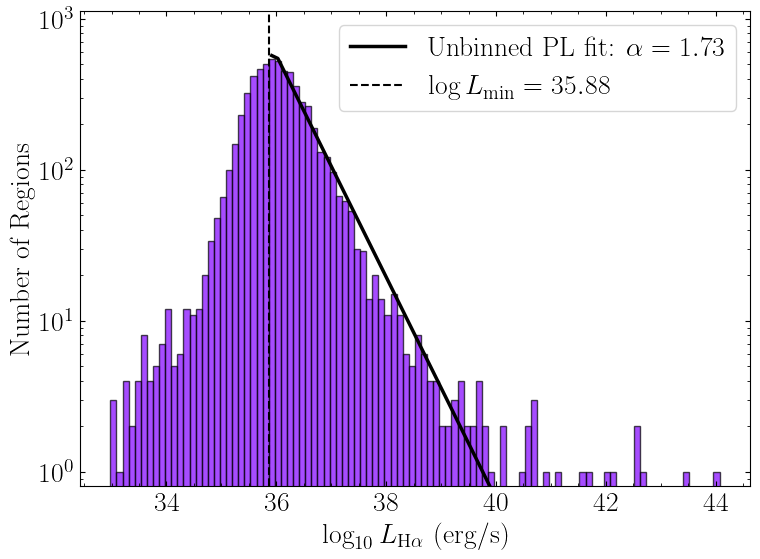

In [36]:
L = np.asarray(cat['L_Ha_sum_dered'], dtype=float)

results = santoro_powerlaw_fit_fast(
    L,
    alpha_range=(0.0, 3.0),
    xmin_stride=10,   # bigger = faster
    min_tail_n=30,
    n_bootstrap=10,    # keep at 0 while testing
    verbose=True
)

sigma_alpha, alpha_grid, rel_like, gfit = alpha_uncertainty_from_likelihood(
    results["L"],
    results["xmin_best"],
    results["alpha_best"],
    alpha_range=(1.0, 3.0),
    n_alpha_grid=400
)

print(f"alpha uncertainty ~ {sigma_alpha:.3f}")

plot_histogram_with_unbinned_powerlaw_fit(
    results,
    bins=100,
    outfile='plots/M33_HII_hist_with_fast_unbinned_powerlaw_fit.png'
)

In [37]:
import re
# --- helper: parse "Paper (Year)" out of your existing label strings ---
_paper_re = re.compile(r"\(([^()]+?\d{4})\)\s*$")  # grabs content in last "(...)" that ends with a year

def extract_paper_id(label: str) -> str:
    """
    Returns something stable like:
      'Kobulnicky & Kewley 2004'
      'Dopita et al. 2016'
    Falls back to full label if it can't parse.
    """
    m = _paper_re.search(label)
    return m.group(1).strip() if m else label.strip()

def fit_line_and_plot(x, y, label, *, do_plot=True, alpha=0.05, s=10, color = None, marker = 'o'):
    """
    Fits y = m x + b (ordinary least squares) ignoring non-finite points.
    Returns (m, b). Optionally plots scatter and best-fit line.
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)

    msk = np.isfinite(x) & np.isfinite(y)
    if msk.sum() < 2:
        # not enough points to fit
        if do_plot:
            plt.scatter(x, y, alpha=alpha, s=s, label=f"{label} (slope: n/a)", color=color)
        return np.nan, np.nan

    xf = x[msk]
    yf = y[msk]

    # Fit line
    m, b = np.polyfit(xf, yf, 1)

    if do_plot:
        # scatter
        plt.scatter(xf, yf, alpha=alpha, s=s, color = color, marker = marker)

        # line over the x-range of data
        xline = np.linspace(xf.min(), xf.max(), 200)
        yline = m * xline + b
        plt.plot(xline, yline, linewidth=3, label=f"{label}, m={m:.3f} dex/kpc", color =color)

    return m, b

# --- unified calibration registry ---
# Each entry: (data_array, label, line_group)
calibrations = [
    # (O_H_KK2004, "R23 Calibration (Kobulnicky \& Kewley 2004)", "R23"),
    (cat['Z_R23_Maiolino2008'], "Maiolino et al. 2008", "R23"),
    (cat['Z_R23_Curti2017'], "Curti et al. 2017", "R23"),

    (cat['Z_O3N2_Brazzini2024'], "Brazzini et al. 2024", "O3N2"),
    (cat['Z_O3N2_M2013'], "Marino et al. 2013", "O3N2"),
    (cat['Z_O3N2_PP2004'], "Pettini \& Pagel 2004", "O3N2"),
    (cat['Z_O3N2_Brown2016'], "Brown et al. 2016", "O3N2"),
    (cat['Z_O3N2_Curti2017'], "Curti et al. 2017", "O3N2"),

    (cat['Z_D2016'], "Dopita et al. (2016)", "N2S2Halpha"),
    (cat['Z_N2S2Halpha_Brazzini2024'], "Brazzini et al. 2024", "N2S2Halpha"),

    # (Z_N2, "N2 Calibration (Brazzini et al. 2024)", "N2"),
    (cat['Z_N2_M2013'], "Marino et al. 2013", "N2"),
    (cat['Z_N2_Brown2016'], "Brown et al. 2016", "N2"),
    # (Z_N2_Curti2017, "N2 Calibration (Curti et al. 2017)", "N2"),

    (cat['Z_R3_Brazzini2024'], "Brazzini et al. 2024", "R3"),
    (cat['Z_R3_Curti2017'], "Curti et al. 2017", "R3"),
    
    (cat["Z_N2O2_Brown2016"], "Brown et al. 2016", "N2O2"),
    # (cat["Z_N2O2_KD2002"], "Kewley \& Dopita 2002", "N2O2"),
]


<>:56: SyntaxWarning: invalid escape sequence '\&'
<>:56: SyntaxWarning: invalid escape sequence '\&'
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/794285981.py:56: SyntaxWarning: invalid escape sequence '\&'
  (cat['Z_O3N2_PP2004'], "Pettini \& Pagel 2004", "O3N2"),


In [38]:
#print all the column names that start with "Z_"
for col in cat.columns:
    if col.startswith("Z_"):
        print(col)

Z_12logOH
Z_12logOH_e
Z_N2_Brazzini2024
Z_O3N2_Brazzini2024
Z_N2S2Halpha_Brazzini2024
Z_R3_Brazzini2024
Z_R23_Maiolino2008
Z_N2_Maiolino2008
Z_R23_Curti2017
Z_R3_Curti2017
Z_N2_Curti2017
Z_O3N2_Curti2017
Z_R_Pilyugin2016_highN2
Z_R_Pilyugin2016_lowN2
Z_S_Pilyugin2016_highN2
Z_S_Pilyugin2016_lowN2
Z_R23_KK2004
Z_NII_KD2002
Z_D2016
Z_O3N2_M2013
Z_N2_M2013
Z_C2001
Z_N2_PP2004
Z_O3N2_PP2004
Z_N2_Brown2016
Z_O3N2_Brown2016
Z_N2O2_Brown2016
Z_N2O2_KD2002


In [39]:
from itertools import cycle

def build_style_map(calibrations):
    paper_ids = []
    for _, label, _ in calibrations:
        pid = extract_paper_id(label)
        if pid not in paper_ids:
            paper_ids.append(pid)
    print(len(paper_ids), "unique papers found.")
    # Use matplotlib default color cycle; assign unique marker per paper too
    cmap = plt.get_cmap('rainbow')
    colors = cmap(np.linspace(0, 1, 8))
    marker_cycle = cycle(['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', '8'])

    style_map = {}
    for i, pid in enumerate(paper_ids):
        style_map[pid] = {
            "color": colors[i % len(colors)],
            "marker": next(marker_cycle),
        }
    return style_map

style_map = build_style_map(calibrations)


7 unique papers found.


In [ ]:
def plot_calibration_panel(line_group, calibrations, style_map, R_gal):
    plt.figure(figsize=(8, 6))

    for arr, label, grp in calibrations:
        if grp != line_group:
            continue

        pid = extract_paper_id(label)
        st = style_map[pid]
        fit_line_and_plot(R_gal, arr, label, color=st["color"], marker=st["marker"])

    # comparison gradients (unchanged)
    xvals = np.linspace(0, 8, 1000)
    plt.plot(xvals, 8.36 - 0.027*xvals, 'k-',  lw=2, label='Rosolowsky+2008, m=-0.027 dex/kpc')
    plt.plot(xvals, -0.044*xvals + 8.447, 'k--', lw=2, label='Magrini+2010, m=-0.044 dex/kpc')
    plt.plot(xvals, 8.59 - 0.037*xvals, 'k-.', lw=2, label='Rogers+2022, m=-0.037 dex/kpc')

    plt.xlabel('Galactocentric Radius (kpc)')
    plt.ylabel('12 + log(O/H)')
    plt.ylim(8.1, 9)
    plt.title(f'{line_group} Calibrations')
    plt.legend(fontsize=8, frameon=False)
    plt.savefig(f'plots/{line_group}_calibrations.png', dpi=300, bbox_inches='tight')
    plt.show()


In [ ]:
for grp in ["R23", "O3N2", "N2S2Halpha", "N2", "R3", "N2O2"]:
    plot_calibration_panel(grp, calibrations, style_map, cat['R_gal_kpc'])


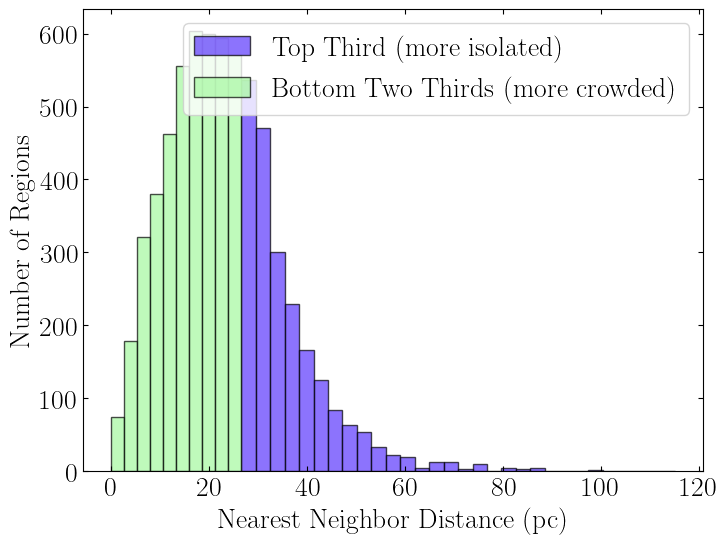

In [42]:
#separate plot based on top third and bottom two thirds of the nearest neighbor distance
cat_sorted = cat.sort_values('nearest_neighbor_pc_deproj')
n = len(cat_sorted)
top_third = cat_sorted.iloc[int(2*n/3):]
bottom_two_thirds = cat_sorted.iloc[:int(2*n/3)]
plt.figure(figsize=(8, 6))
plt.hist(top_third['nearest_neighbor_pc_deproj'], bins=30, color=colors[1], edgecolor='k', alpha=0.7, label='Top Third (more isolated)')
plt.hist(bottom_two_thirds['nearest_neighbor_pc_deproj'], bins=10, color=colors[8], edgecolor='k', alpha=0.7, label='Bottom Two Thirds (more crowded)')
plt.xlabel('Nearest Neighbor Distance (pc)')
plt.ylabel('Number of Regions')
plt.legend()
plt.show()

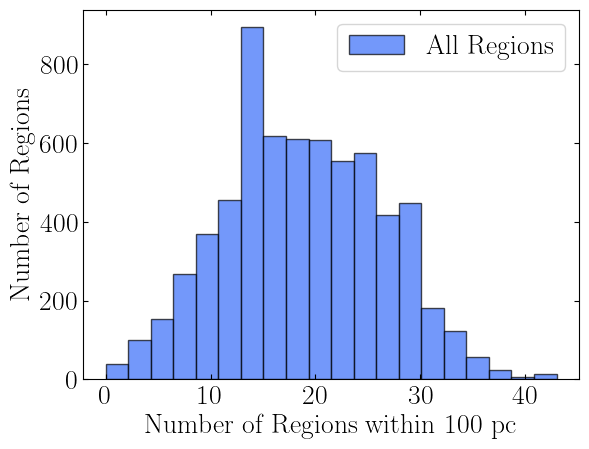

In [43]:
plt.hist(cat['n_regions_within_100pc_deproj'], bins=20, color=colors[2], edgecolor='k', alpha=0.7, label='All Regions')
plt.xlabel('Number of Regions within 100 pc')
plt.ylabel('Number of Regions')
plt.legend()
plt.show()

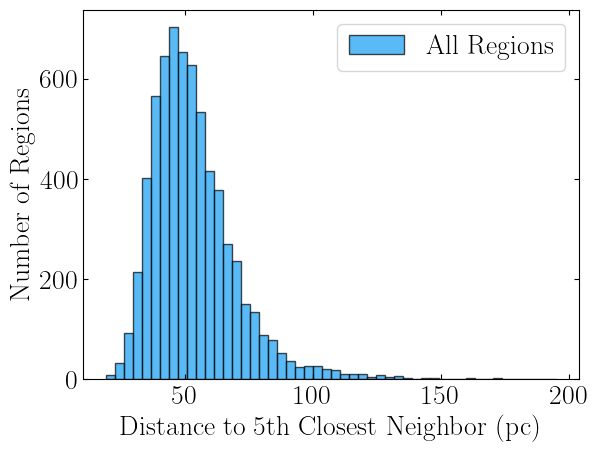

In [44]:
plt.hist(cat['distance_5th_closest_pc_deproj'], bins=50, color=colors[3], edgecolor='k', alpha=0.7, label='All Regions')
plt.xlabel('Distance to 5th Closest Neighbor (pc)')
plt.ylabel('Number of Regions')
plt.legend()
plt.show()

In [45]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_int
F_Hbeta_e_int
SNR_Hbeta_int
F_[OIII]4959_int
F_[OIII]4959_e_int
SNR_[OIII]4959_int
F_[OI

In [48]:
#plot each of these properties: ne, logU, O/H from N2S2alpa, size, luminoisty against nearest neighbor distance, distance to 5th closest neighbor, and number of neighbors within 100 pc
properties_y = [
    ("ne_SII_cm3", "Electron Density (cm$^{-3}$)"),
    ("logU_KK04", "Ionization Parameter (Kobulnicky \& Kewley 2004)"),
    ("Z_N2S2Halpha_Brazzini2024", "O/H (Brazzini+2024 N2S2Halpha)"),
    ("radius_p50_pc", "Size (pc)"),
    ("L_Ha_sum_dered", r"$L_{\mathrm{H}\alpha}$ (erg/s)"),
]

properties_x = [
    ("nearest_neighbor_pc_deproj", "Nearest Neighbor Distance (pc)"),
    ("distance_5th_closest_pc_deproj", "Distance to 5th Closest Neighbor (pc)"),
    ("n_regions_within_100pc_deproj", "Number of Regions within 100 pc"),
]

for prop_y, label_y in properties_y:
    for prop_x, label_x in properties_x:
        plt.figure(figsize=(8, 6))
        plt.scatter(cat[prop_x], cat[prop_y], alpha=0.5, s=10, color=colors[4])
        plt.xlabel(label_x)
        plt.ylabel(label_y)
        # plt.title(f'{label_y} vs {label_x}')
        # plt.xscale('log')
        if prop_y == "L_Ha_sum_dered" or prop_y == "ne_SII_cm3":
            plt.yscale('log')
            
        #overplot a fitted line
        m, b = fit_line_and_plot(cat[prop_x], cat[prop_y], label=f"{label_y} vs {label_x}", do_plot=False)
        xline = np.linspace(np.nanmin(cat[prop_x]), np.nanmax(cat[prop_x]), 100)
        yline = m * xline + b
        plt.plot(xline, yline, color='k', lw=2, label=f"Best fit line, m={m:.3f} dex/kpc")
        plt.legend()
        plt.tight_layout()
        plt.savefig(f'plots/{prop_y}_vs_{prop_x}.png', dpi=300, bbox_inches='tight')
        plt.close()


<>:4: SyntaxWarning: invalid escape sequence '\&'
<>:4: SyntaxWarning: invalid escape sequence '\&'
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1801579105.py:4: SyntaxWarning: invalid escape sequence '\&'
  ("logU_KK04", "Ionization Parameter (Kobulnicky \& Kewley 2004)"),


<>:28: SyntaxWarning: invalid escape sequence '\&'
<>:28: SyntaxWarning: invalid escape sequence '\&'
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1265406618.py:28: SyntaxWarning: invalid escape sequence '\&'
  ("logU_KK04", "Ionization Parameter (Kobulnicky \& Kewley 2004)"),


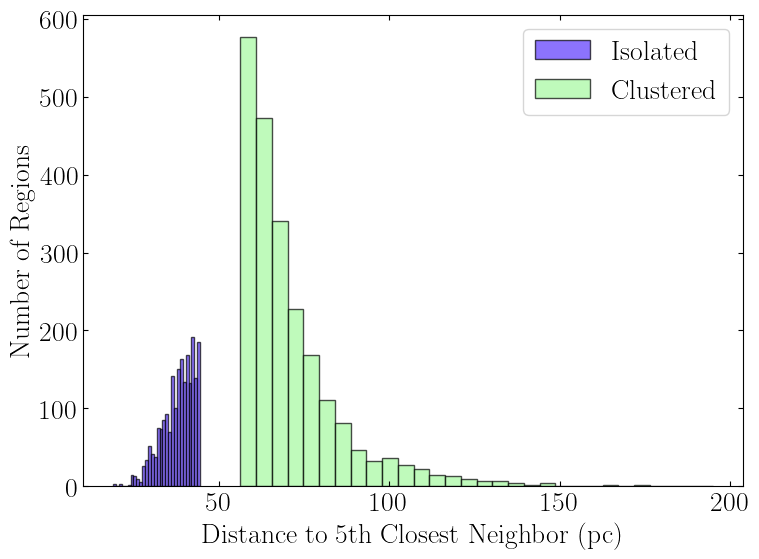

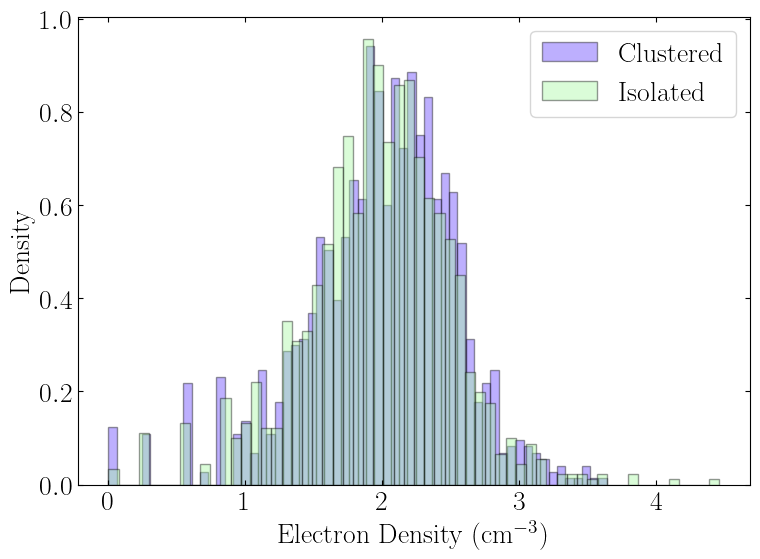

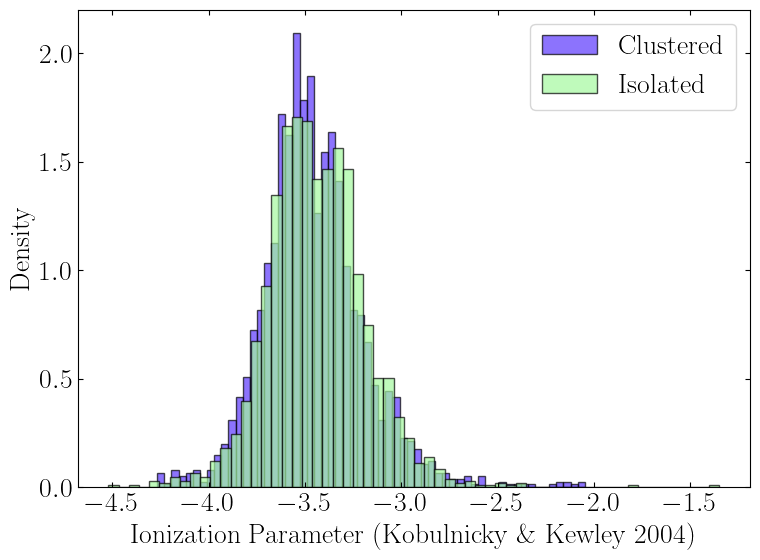

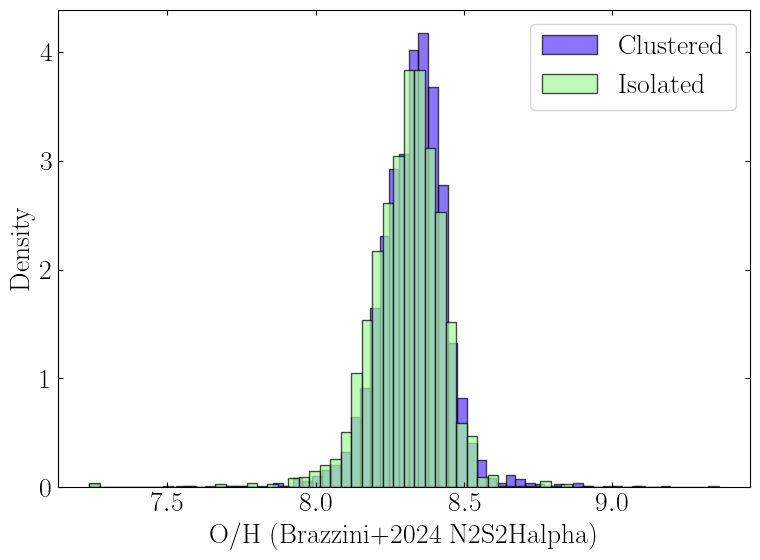

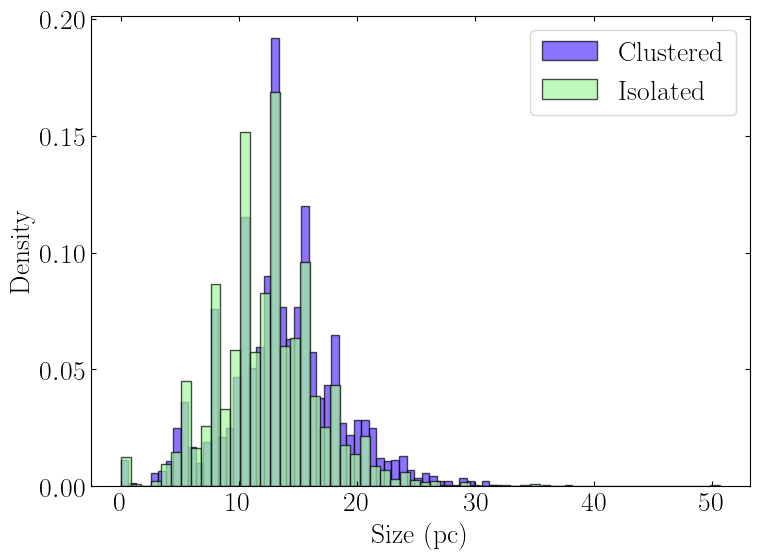

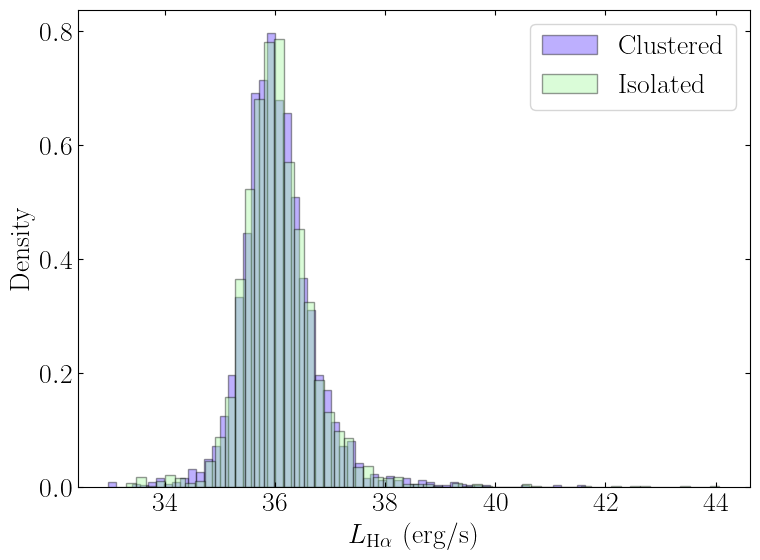

In [71]:
# define isoloated vs clustered based on nearest neighbor distance

#use sigma_5 to define thresholds for isolated vs clustered. top third is "isolated", bottom third is "clustered"
thresh_col = 'distance_5th_closest_pc_deproj'
threshold = cat[thresh_col].quantile(0.66)  # top third is "isolated"
threshold2 = cat[thresh_col].quantile(0.33)  # bottom third is "clustered"

cat['environment'] = 'Intermediate'
cat.loc[cat[thresh_col] >= threshold, 'environment'] = 'Clustered'
cat.loc[cat[thresh_col] <= threshold2, 'environment'] = 'Isolated'


# plot histogram of nearest neighbor distance colored by environment
plt.figure(figsize=(8, 6))
for env, color in zip(['Isolated', 'Clustered'], [colors[1], colors[8]]):
    subset = cat[cat['environment'] == env]
    plt.hist(subset[thresh_col], bins=30, color=color, edgecolor='k', alpha=0.7, label=f'{env}')
plt.xlabel('Distance to 5th Closest Neighbor (pc)')
plt.ylabel('Number of Regions')
plt.legend()
plt.tight_layout()
plt.savefig('plots/nearest_neighbor_distance_histogram_by_environment.png', dpi=300, bbox_inches='tight')
plt.show()

#compare properties between isolated and clustered environments
properties = [
    ("ne_SII_cm3", "Electron Density (cm$^{-3}$)"),
    ("logU_KK04", "Ionization Parameter (Kobulnicky \& Kewley 2004)"),
    ("Z_N2S2Halpha_Brazzini2024", "O/H (Brazzini+2024 N2S2Halpha)"),
    ("radius_p50_pc", "Size (pc)"),
    ("L_Ha_sum_dered", r"$L_{\mathrm{H}\alpha}$ (erg/s)"),
]

for prop, label in properties:
    plt.figure(figsize=(8, 6))
    for env, color in zip(['Clustered', 'Isolated',], [colors[1], colors[8]]):
        subset = cat[cat['environment'] == env]
        if prop == "L_Ha_sum_dered" or prop == "ne_SII_cm3":
            plt.hist(np.log10(subset[prop]), bins=60, color=color, edgecolor='k', alpha=0.4, label=f'{env}', density=True)
            plt.xlabel('log'+label)
        else:
            plt.hist(subset[prop], bins=60, color=color, edgecolor='k', alpha=0.7, label=f'{env}', density=True)
        plt.xlabel(label)
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'plots/{prop}_histogram_by_environment.png', dpi=300, bbox_inches='tight')
    plt.show()

In [72]:
#compare median and std of properties between isolated and clustered environments
for prop, label in properties:
    median_isolated = cat[cat['environment'] == 'Isolated'][prop].median()
    median_clustered = cat[cat['environment'] == 'Clustered'][prop].median()
    std_isolated = cat[cat['environment'] == 'Isolated'][prop].std()
    std_clustered = cat[cat['environment'] == 'Clustered'][prop].std()
    print(f"{label}:")
    print(f"  Isolated: median={median_isolated:.3f}, std={std_isolated:.3f}")
    print(f"  Clustered: median={median_clustered:.3f}, std={std_clustered:.3f}")

Electron Density (cm$^{-3}$):
  Isolated: median=95.191, std=1004.187
  Clustered: median=108.560, std=325.541
Ionization Parameter (Kobulnicky \& Kewley 2004):
  Isolated: median=-3.455, std=0.255
  Clustered: median=-3.479, std=0.267
O/H (Brazzini+2024 N2S2Halpha):
  Isolated: median=8.318, std=0.135
  Clustered: median=8.336, std=0.128
Size (pc):
  Isolated: median=12.590, std=4.556
  Clustered: median=13.179, std=4.851
$L_{\mathrm{H}\alpha}$ (erg/s):
  Isolated: median=987716264160480370453279482954383360.000, std=2649568521881667759557336113541024682344448.000
  Clustered: median=964155805290328602530708769812250624.000, std=9690544223898459626395202784368768581632.000


In [73]:
from scipy.stats import ks_2samp

for prop, label in properties:
    iso = cat[cat['environment'] == 'Isolated'][prop]
    clu = cat[cat['environment'] == 'Clustered'][prop]
    ks_stat, pval = ks_2samp(iso, clu)
    print(f"{label}:")
    print("KS statistic:", ks_stat)
    print("p-value:", pval)

Electron Density (cm$^{-3}$):
KS statistic: 0.04773132522313972
p-value: 0.01331497689746187
Ionization Parameter (Kobulnicky \& Kewley 2004):
KS statistic: 0.041418114224310215
p-value: 0.04570763670151195
O/H (Brazzini+2024 N2S2Halpha):
KS statistic: 0.07979511621272975
p-value: 1.7192971649760137e-06
Size (pc):
KS statistic: 0.11958559586529909
p-value: 4.831151583338595e-14
$L_{\mathrm{H}\alpha}$ (erg/s):
KS statistic: 0.015028850175154264
p-value: 0.9618971130530896


Electron Density (cm$^{-3}$)
KS test: stat = 0.0594, p = 2.574e-02
Anderson-Darling: stat = 2.6652, p ≈ 2.637e-02
Mann-Whitney U: stat = 704099.0000, p = 3.564e-02
Cohen's d = 0.033
Isolated median (16,50,84): [93.34050331 95.1912234  99.45391384]
Clustered median (16,50,84): [103.90748878 108.56049609 116.02120471]


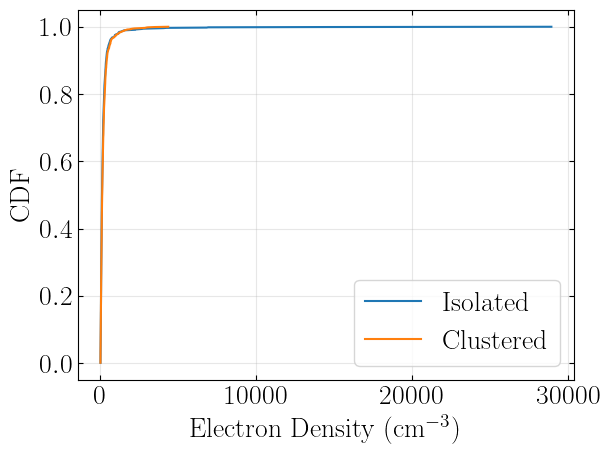

Ionization Parameter (Kobulnicky \& Kewley 2004)
KS test: stat = 0.0591, p = 1.690e-03
Anderson-Darling: stat = 5.4075, p ≈ 2.485e-03
Mann-Whitney U: stat = 2118634.0000, p = 3.646e-03
Cohen's d = 0.063
Isolated median (16,50,84): [-3.46105353 -3.45481999 -3.44477497]
Clustered median (16,50,84): [-3.48345028 -3.47886379 -3.47372193]


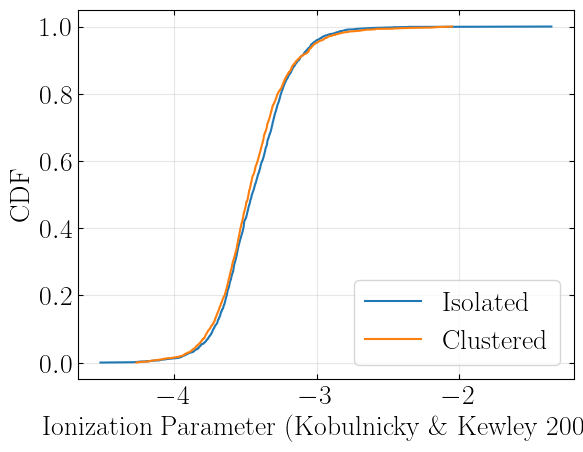

O/H (Brazzini+2024 N2S2Halpha)
KS test: stat = 0.0785, p = 5.595e-06
Anderson-Darling: stat = 19.1204, p ≈ 1.000e-03
Mann-Whitney U: stat = 1920078.0000, p = 4.910e-08
Cohen's d = -0.162
Isolated median (16,50,84): [8.31608697 8.31832956 8.32159158]
Clustered median (16,50,84): [8.33304317 8.33581433 8.33777223]


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1314732976.py:64: UserWarning: p-value floored: true value smaller than 0.001
  ad_result = anderson_ksamp([iso, clu])


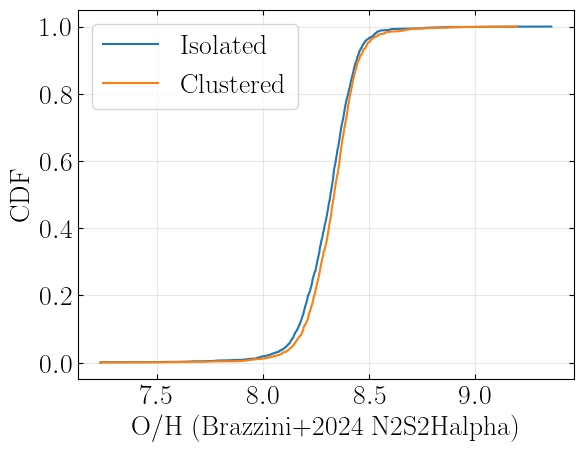

Size (pc)
KS test: stat = 0.1196, p = 4.831e-14
Anderson-Darling: stat = 48.2417, p ≈ 1.000e-03
Mann-Whitney U: stat = 2023573.0000, p = 1.951e-17
Cohen's d = -0.237
Isolated median (16,50,84): [12.42545093 12.58973323 12.73922494]
Clustered median (16,50,84): [13.17850856 13.17850856 13.24126337]


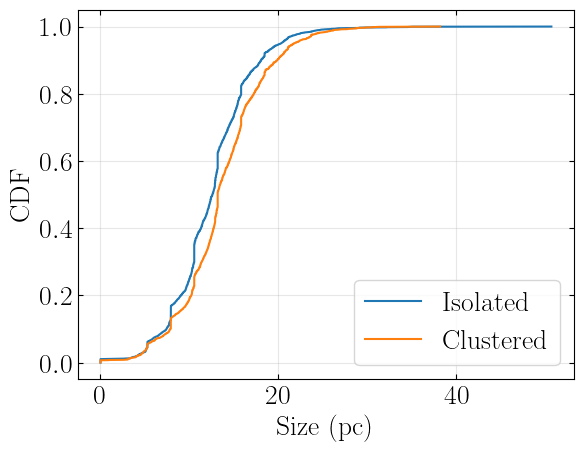

$L_{\mathrm{H}\alpha}$ (erg/s)
KS test: stat = 0.0132, p = 9.916e-01
Anderson-Darling: stat = -0.9527, p ≈ 2.500e-01
Mann-Whitney U: stat = 2200012.0000, p = 7.782e-01
Cohen's d = 0.040
Isolated median (16,50,84): [9.63666684e+35 9.87713604e+35 1.00928660e+36]
Clustered median (16,50,84): [9.46732815e+35 9.64155805e+35 1.00415070e+36]


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/1314732976.py:64: UserWarning: p-value capped: true value larger than 0.25
  ad_result = anderson_ksamp([iso, clu])


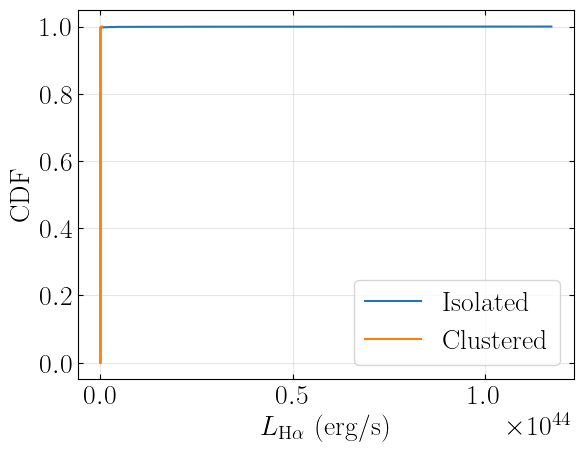

In [74]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import ks_2samp, mannwhitneyu, anderson_ksamp

# --------------------------------------------------
# Helper functions
# --------------------------------------------------

def cohens_d(a, b):
    a = np.asarray(a)
    b = np.asarray(b)
    return (np.mean(a) - np.mean(b)) / np.sqrt((np.var(a) + np.var(b)) / 2)

def bootstrap_median(data, n_boot=1000):
    data = np.asarray(data)
    meds = []
    for _ in range(n_boot):
        sample = np.random.choice(data, size=len(data), replace=True)
        meds.append(np.median(sample))
    return np.percentile(meds, [16, 50, 84])

def plot_cdf(a, b, label_a='Isolated', label_b='Clustered', xlabel=''):
    def _cdf(data):
        x = np.sort(data)
        y = np.arange(1, len(x)+1) / len(x)
        return x, y

    xa, ya = _cdf(a)
    xb, yb = _cdf(b)

    plt.figure()
    plt.plot(xa, ya, label=label_a)
    plt.plot(xb, yb, label=label_b)
    plt.xlabel(xlabel)
    plt.ylabel('CDF')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

# --------------------------------------------------
# MAIN LOOP
# --------------------------------------------------

for prop, label in properties:

    iso = cat[cat['environment'] == 'Isolated'][prop].dropna()
    clu = cat[cat['environment'] == 'Clustered'][prop].dropna()

    print("="*50)
    print(label)

    # -----------------------------
    # 1) KS test
    # -----------------------------
    ks_stat, ks_p = ks_2samp(iso, clu)
    print(f"KS test: stat = {ks_stat:.4f}, p = {ks_p:.3e}")

    # -----------------------------
    # 2) Anderson-Darling test
    # -----------------------------
    try:
        ad_result = anderson_ksamp([iso, clu])
        print(f"Anderson-Darling: stat = {ad_result.statistic:.4f}, p ≈ {ad_result.significance_level:.3e}")
    except Exception as e:
        print("Anderson-Darling failed:", e)

    # -----------------------------
    # 3) Mann-Whitney U test
    # -----------------------------
    u_stat, mw_p = mannwhitneyu(iso, clu, alternative='two-sided')
    print(f"Mann-Whitney U: stat = {u_stat:.4f}, p = {mw_p:.3e}")

    # -----------------------------
    # 4) Effect size
    # -----------------------------
    d = cohens_d(iso, clu)
    print(f"Cohen's d = {d:.3f}")

    # -----------------------------
    # 5) Bootstrap medians
    # -----------------------------
    iso_med = bootstrap_median(iso)
    clu_med = bootstrap_median(clu)

    print(f"Isolated median (16,50,84): {iso_med}")
    print(f"Clustered median (16,50,84): {clu_med}")

    # -----------------------------
    # 6) Optional: CDF plot
    # -----------------------------
    plot_cdf(iso, clu, xlabel=label)

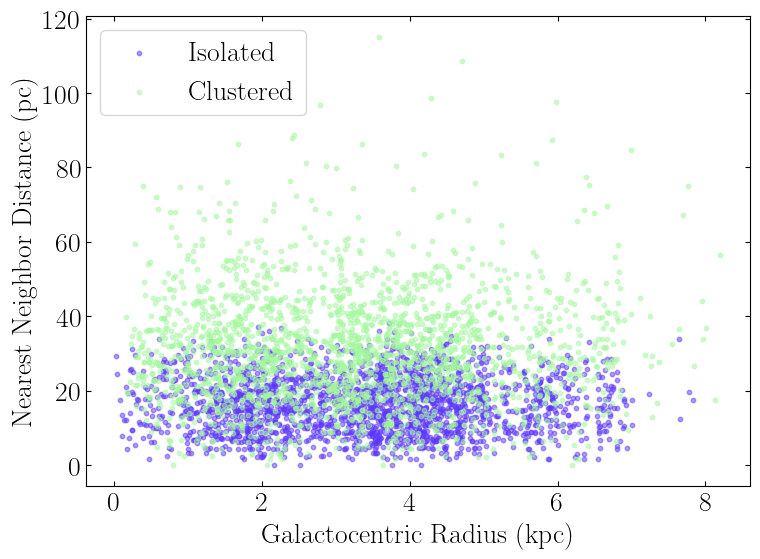

In [75]:
#plot nearest neighbour distance vs galactocentric radius colored by environment
plt.figure(figsize=(8, 6))
for env, color in zip(['Isolated', 'Clustered'], [colors[1], colors[8]]):
    subset = cat[cat['environment'] == env]
    plt.scatter(subset['R_gal_kpc'], subset['nearest_neighbor_pc_deproj'], alpha=0.5, s=10, color=color, label=f'{env}')
plt.xlabel('Galactocentric Radius (kpc)')
plt.ylabel('Nearest Neighbor Distance (pc)')
plt.legend()
plt.tight_layout()
plt.savefig('plots/nearest_neighbor_distance_vs_galactocentric_radius_by_environment.png', dpi=300, bbox_inches='tight')
plt.show()

Electron Density (cm$^{-3}$)  [after subtracting radial gradient]
KS test: stat = 0.0791, p = 9.045e-04
Anderson-Darling: stat = 6.6237, p ≈ 1.000e-03
Mann-Whitney U: stat = 683862.0000, p = 1.082e-03
Cohen's d = 0.024
Isolated residual median (16,50,84): [-35.59603626 -30.94492729 -27.47907178]
Clustered residual median (16,50,84): [-20.06156823 -17.85847382 -13.95907323]


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/2528636867.py:131: UserWarning: p-value floored: true value smaller than 0.001
  ad_result = anderson_ksamp([iso, clu])


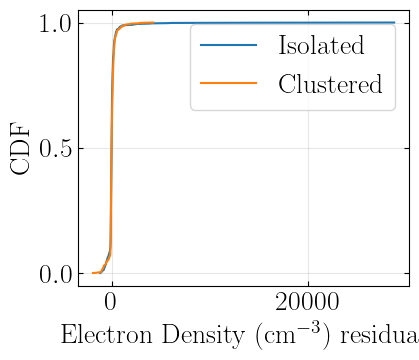

Ionization Parameter (Kobulnicky \& Kewley 2004)  [after subtracting radial gradient]
KS test: stat = 0.0510, p = 1.040e-02
Anderson-Darling: stat = 3.9191, p ≈ 8.655e-03
Mann-Whitney U: stat = 2108115.0000, p = 8.781e-03
Cohen's d = 0.051
Isolated residual median (16,50,84): [-0.00347259  0.002531    0.00929424]
Clustered residual median (16,50,84): [-0.02343798 -0.01741815 -0.01252365]


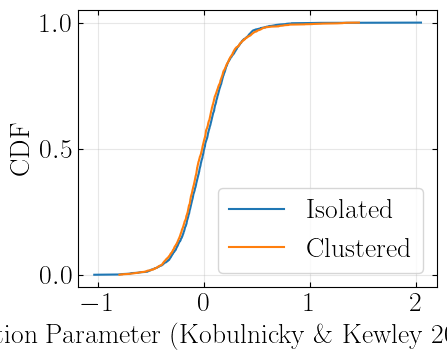

O/H (Brazzini+2024 N2S2Halpha)  [after subtracting radial gradient]
KS test: stat = 0.0523, p = 6.669e-03
Anderson-Darling: stat = 5.9663, p ≈ 1.588e-03
Mann-Whitney U: stat = 2012193.0000, p = 2.307e-03
Cohen's d = -0.108
Isolated residual median (16,50,84): [-0.00509015 -0.00357292 -0.00083067]
Clustered residual median (16,50,84): [0.00190191 0.00370077 0.00564981]


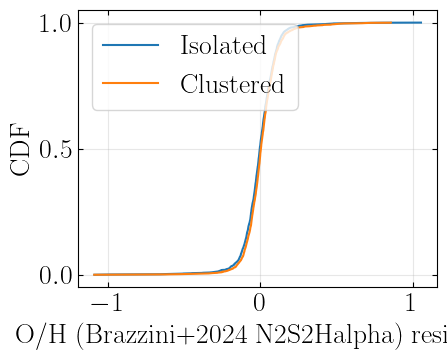

Size (pc)  [after subtracting radial gradient]
KS test: stat = 0.1177, p = 1.274e-13
Anderson-Darling: stat = 43.6498, p ≈ 1.000e-03
Mann-Whitney U: stat = 2039660.0000, p = 5.078e-16
Cohen's d = -0.226
Isolated residual median (16,50,84): [-0.38441208 -0.31194506 -0.23284511]
Clustered residual median (16,50,84): [0.39100584 0.47784575 0.54668074]


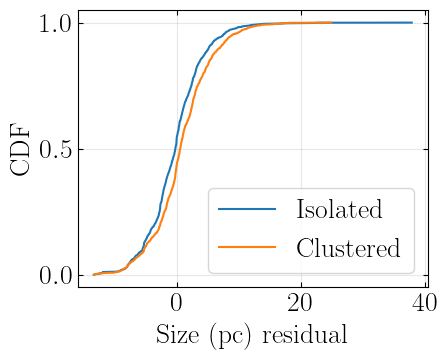

$L_{\mathrm{H}\alpha}$ (erg/s)  [after subtracting radial gradient]
KS test: stat = 0.0412, p = 5.480e-02
Anderson-Darling: stat = 1.3179, p ≈ 9.302e-02
Mann-Whitney U: stat = 2222425.0000, p = 3.916e-01
Cohen's d = 0.040
Isolated residual median (16,50,84): [-2.77032592e+35 -2.27595377e+35 -1.82558697e+35]
Clustered residual median (16,50,84): [-4.44793373e+35 -3.99730711e+35 -3.54312754e+35]


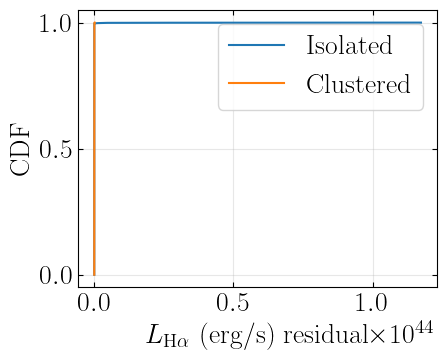


Summary table:
                    property  \
0                 ne_SII_cm3   
1                  logU_KK04   
2  Z_N2S2Halpha_Brazzini2024   
3              radius_p50_pc   
4             L_Ha_sum_dered   

                                              label  N_isolated  N_clustered  \
0                      Electron Density (cm$^{-3}$)        1224         1210   
1  Ionization Parameter (Kobulnicky \& Kewley 2004)        1998         2014   
2                    O/H (Brazzini+2024 N2S2Halpha)        2044         2083   
3                                         Size (pc)        2148         2213   
4                    $L_{\mathrm{H}\alpha}$ (erg/s)        2069         2116   

    KS_stat          KS_p    AD_stat  AD_p_approx       MW_U          MW_p  \
0  0.079134  9.044723e-04   6.623661     0.001000   683862.0  1.082151e-03   
1  0.050960  1.039648e-02   3.919144     0.008655  2108115.0  8.780626e-03   
2  0.052342  6.668743e-03   5.966268     0.001588  2012193.0  2.306912e-03  

In [76]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import ks_2samp, mannwhitneyu, anderson_ksamp
from statsmodels.nonparametric.smoothers_lowess import lowess

# --------------------------------------------------
# SETTINGS
# --------------------------------------------------
radius_col = "R_gal_kpc"

# Example:
# properties = [
#     ("n_e", "Electron Density (cm$^{-3}$)"),
#     ("logU_kk04", "Ionization Parameter (Kobulnicky \\& Kewley 2004)"),
#     ("OH_brazzini2024", "O/H (Brazzini+2024 N2S2Halpha)"),
#     ("size_pc", "Size (pc)"),
#     ("L_Halpha", "$L_{\\mathrm{H}\\alpha}$ (erg/s)")
# ]

# LOWESS smoothing strength:
# larger frac = smoother trend
lowess_frac = 0.25

# --------------------------------------------------
# HELPER FUNCTIONS
# --------------------------------------------------
def cohens_d(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return (np.mean(a) - np.mean(b)) / np.sqrt((np.var(a, ddof=1) + np.var(b, ddof=1)) / 2)

def bootstrap_median(data, n_boot=2000):
    data = np.asarray(data, dtype=float)
    meds = []
    for _ in range(n_boot):
        sample = np.random.choice(data, size=len(data), replace=True)
        meds.append(np.median(sample))
    return np.percentile(meds, [16, 50, 84])

def lowess_residuals(x, y, frac=0.25):
    """
    Fit y(x) with LOWESS and return:
      trend evaluated at original x positions,
      residuals = y - trend
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    good = np.isfinite(x) & np.isfinite(y)
    xg = x[good]
    yg = y[good]

    # LOWESS fit on valid points
    fit = lowess(yg, xg, frac=frac, return_sorted=True)

    # Interpolate fitted curve back onto original valid x positions
    x_fit = fit[:, 0]
    y_fit = fit[:, 1]
    trend_good = np.interp(xg, x_fit, y_fit)

    trend = np.full_like(y, np.nan, dtype=float)
    resid = np.full_like(y, np.nan, dtype=float)

    trend[good] = trend_good
    resid[good] = yg - trend_good

    return trend, resid

def plot_residual_cdf(iso, clu, xlabel):
    iso = np.sort(np.asarray(iso, dtype=float))
    clu = np.sort(np.asarray(clu, dtype=float))

    y_iso = np.arange(1, len(iso) + 1) / len(iso)
    y_clu = np.arange(1, len(clu) + 1) / len(clu)

    plt.figure(figsize=(5, 4))
    plt.plot(iso, y_iso, label="Isolated")
    plt.plot(clu, y_clu, label="Clustered")
    plt.xlabel(xlabel)
    plt.ylabel("CDF")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# --------------------------------------------------
# 1) SUBTRACT RADIAL GRADIENT FOR EACH PROPERTY
# --------------------------------------------------
cat_resid = cat.copy()

for prop, label in properties:
    trend_col = f"{prop}_radial_trend"
    resid_col = f"{prop}_residual"

    trend, resid = lowess_residuals(
        cat_resid[radius_col].values,
        cat_resid[prop].values,
        frac=lowess_frac
    )

    cat_resid[trend_col] = trend
    cat_resid[resid_col] = resid

# --------------------------------------------------
# 2) RE-RUN ENVIRONMENT TESTS ON RESIDUALS
# --------------------------------------------------
results = []

for prop, label in properties:
    resid_col = f"{prop}_residual"

    sub = cat_resid[
        cat_resid["environment"].isin(["Isolated", "Clustered"]) &
        np.isfinite(cat_resid[resid_col])
    ].copy()

    iso = sub.loc[sub["environment"] == "Isolated", resid_col].dropna()
    clu = sub.loc[sub["environment"] == "Clustered", resid_col].dropna()

    print("=" * 60)
    print(f"{label}  [after subtracting radial gradient]")

    # KS
    ks_stat, ks_p = ks_2samp(iso, clu)
    print(f"KS test: stat = {ks_stat:.4f}, p = {ks_p:.3e}")

    # Anderson-Darling
    try:
        ad_result = anderson_ksamp([iso, clu])
        print(f"Anderson-Darling: stat = {ad_result.statistic:.4f}, p ≈ {ad_result.significance_level:.3e}")
    except Exception as e:
        print("Anderson-Darling failed:", e)
        ad_result = None

    # Mann-Whitney
    u_stat, mw_p = mannwhitneyu(iso, clu, alternative="two-sided")
    print(f"Mann-Whitney U: stat = {u_stat:.4f}, p = {mw_p:.3e}")

    # Cohen's d
    d = cohens_d(iso, clu)
    print(f"Cohen's d = {d:.3f}")

    # Bootstrapped median residuals
    iso_med = bootstrap_median(iso)
    clu_med = bootstrap_median(clu)
    print(f"Isolated residual median (16,50,84): {iso_med}")
    print(f"Clustered residual median (16,50,84): {clu_med}")

    # Store results
    results.append({
        "property": prop,
        "label": label,
        "N_isolated": len(iso),
        "N_clustered": len(clu),
        "KS_stat": ks_stat,
        "KS_p": ks_p,
        "AD_stat": np.nan if ad_result is None else ad_result.statistic,
        "AD_p_approx": np.nan if ad_result is None else ad_result.significance_level,
        "MW_U": u_stat,
        "MW_p": mw_p,
        "Cohens_d": d,
        "Iso_med_16": iso_med[0],
        "Iso_med_50": iso_med[1],
        "Iso_med_84": iso_med[2],
        "Clu_med_16": clu_med[0],
        "Clu_med_50": clu_med[1],
        "Clu_med_84": clu_med[2],
    })

    # Optional CDF of residuals
    plot_residual_cdf(
        iso, clu,
        xlabel=f"{label} residual"
    )

results_df = pd.DataFrame(results)
print("\nSummary table:")
print(results_df)

# --------------------------------------------------
# 3) OPTIONAL: SAVE THE RESIDUAL CATALOG + RESULTS
# --------------------------------------------------
# residual_catalog_path = os.path.join(CATALOG_DIR, "catalog_with_radial_residuals.csv")
# results_path = os.path.join(CATALOG_DIR, "environment_tests_on_residuals.csv")
# cat_resid.to_csv(residual_catalog_path, index=False)
# results_df.to_csv(results_path, index=False)
# print("Saved:", residual_catalog_path)
# print("Saved:", results_path)

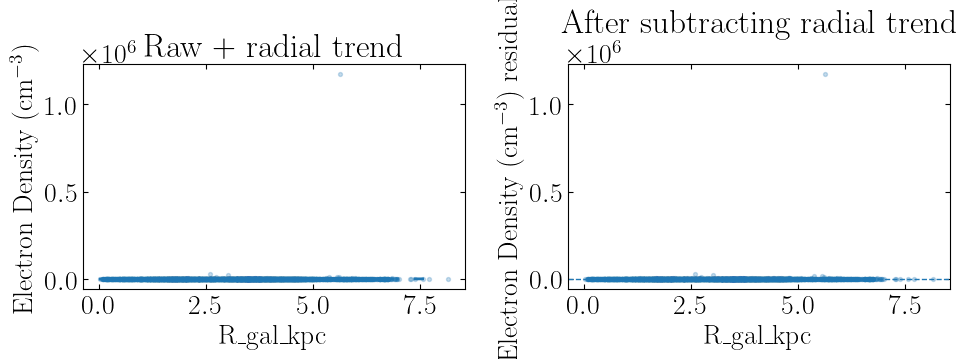

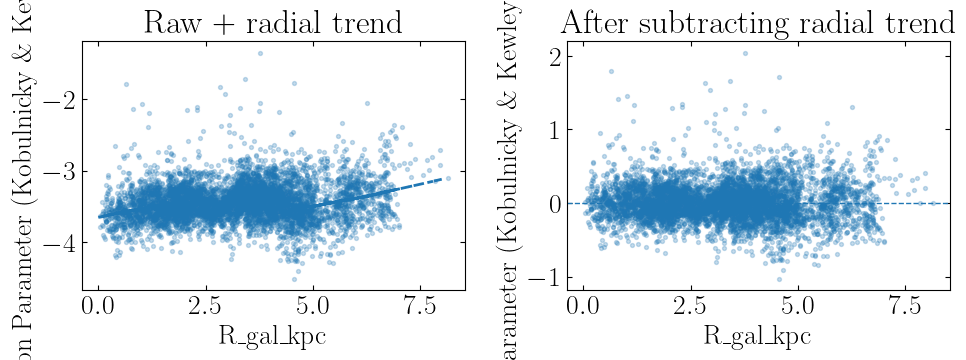

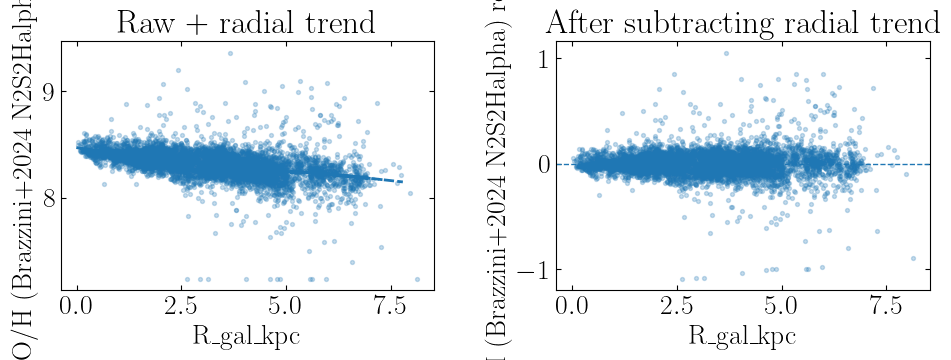

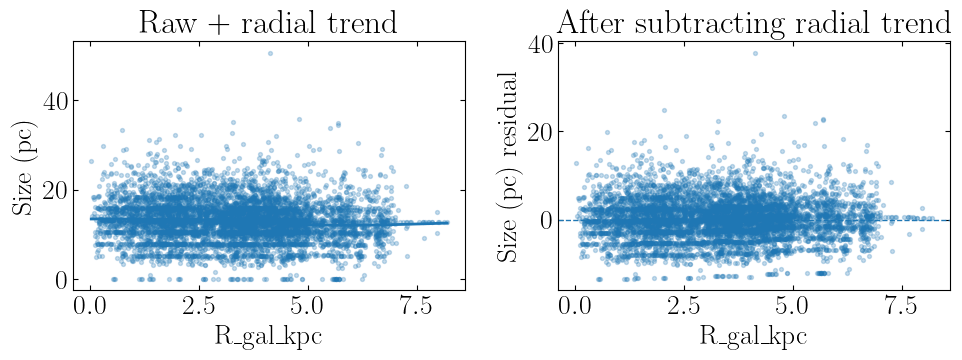

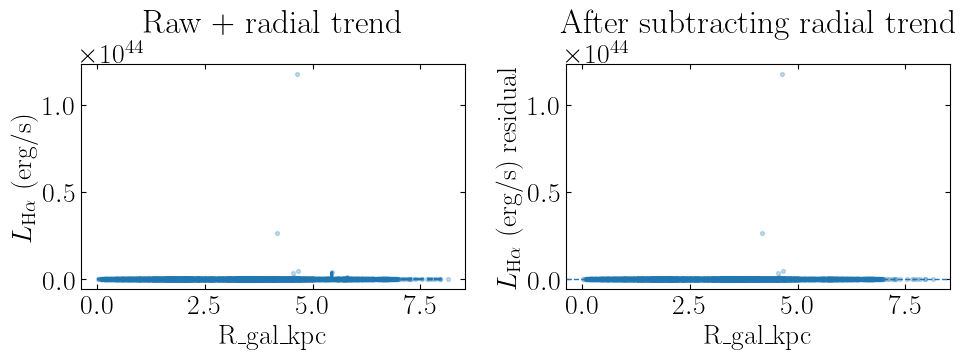

In [77]:
for prop, label in properties:
    trend_col = f"{prop}_radial_trend"
    resid_col = f"{prop}_residual"

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # Raw property + LOWESS trend
    axes[0].scatter(cat_resid[radius_col], cat_resid[prop], s=8, alpha=0.25)
    order = np.argsort(cat_resid[radius_col].values)
    axes[0].plot(
        cat_resid[radius_col].values[order],
        cat_resid[trend_col].values[order],
        lw=2
    )
    axes[0].set_xlabel("R_gal_kpc")
    axes[0].set_ylabel(label)
    axes[0].set_title("Raw + radial trend")

    # Residuals
    axes[1].scatter(cat_resid[radius_col], cat_resid[resid_col], s=8, alpha=0.25)
    axes[1].axhline(0, ls="--", lw=1)
    axes[1].set_xlabel("R_gal_kpc")
    axes[1].set_ylabel(f"{label} residual")
    axes[1].set_title("After subtracting radial trend")

    plt.tight_layout()
    plt.show()

Added columns: area_pc2, Sigma_Ha, log_Sigma_Ha

log Sigma_Ha  [surface brightness / luminosity surface density]
KS test: stat = 0.0778, p = 5.811e-06
Anderson-Darling: stat = 15.7096, p ≈ 1.000e-03
Mann-Whitney U: stat = 2382235.5000, p = 7.629e-07
Isolated median log Sigma_Ha: 33.3306
Clustered median log Sigma_Ha: 33.2411


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_87686/2834364182.py:42: UserWarning: p-value floored: true value smaller than 0.001
  ad_result = anderson_ksamp([iso, clu])


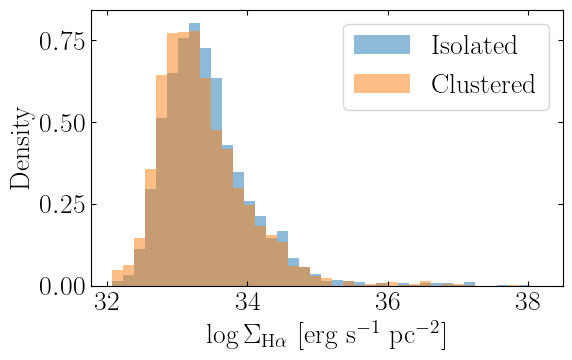

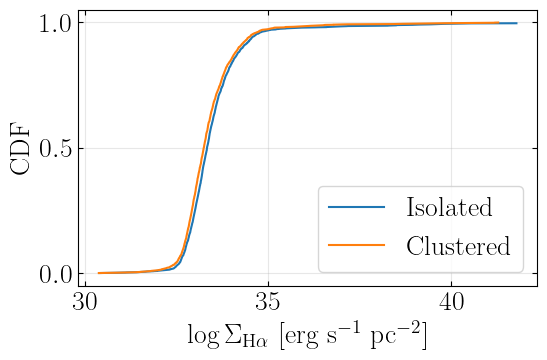


Raw size vs d5
Spearman rho = 0.1151, p = 1.246e-20


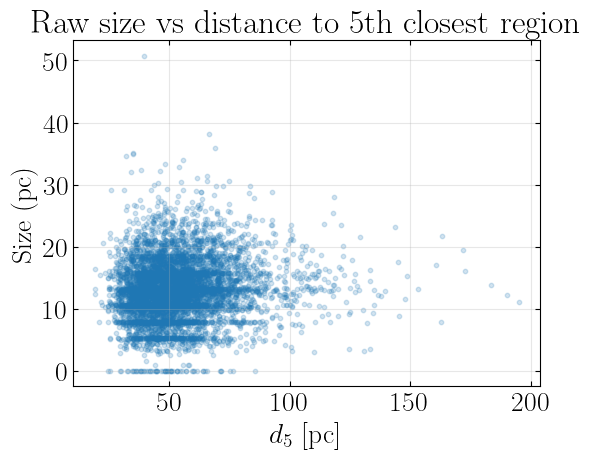

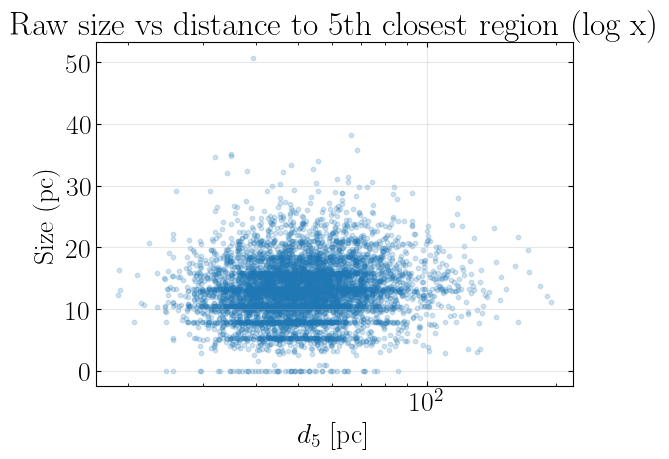


Size residual vs d5
Spearman rho = 0.1104, p = 4.274e-19


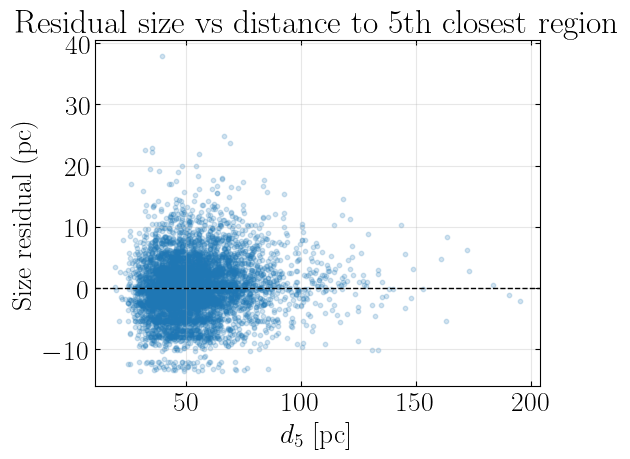

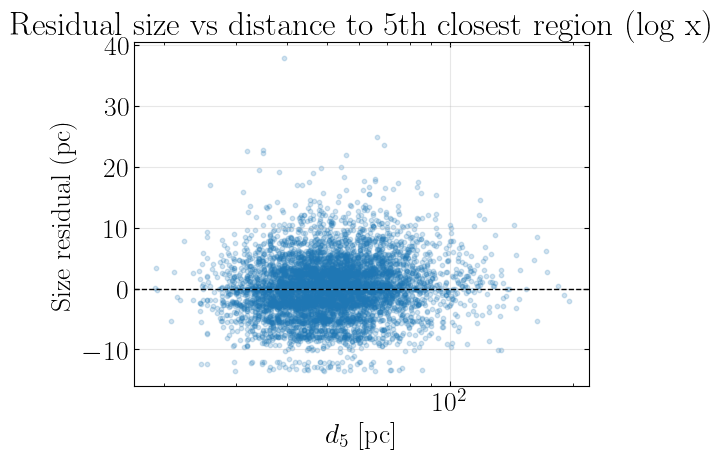

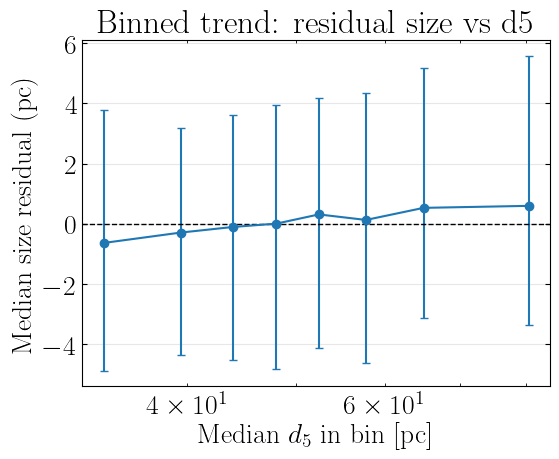


Binned trend table:
             d5_bin  d5_median  size_resid_median  size_resid_p16  \
0  (18.997, 37.119]  33.747392          -0.639569       -4.877402   
1  (37.119, 41.991]  39.523987          -0.293638       -4.350793   
2  (41.991, 45.998]  43.968142          -0.107858       -4.514696   
3  (45.998, 50.223]  48.052803           0.003289       -4.816573   
4  (50.223, 55.067]  52.410477           0.308742       -4.132305   
5  (55.067, 61.094]  57.707303           0.125499       -4.642186   
6  (61.094, 70.476]  64.918299           0.526838       -3.122000   
7  (70.476, 194.96]  80.491395           0.593728       -3.356087   

   size_resid_p84    N  
0        3.781097  815  
1        3.177693  812  
2        3.606901  814  
3        3.955542  813  
4        4.181216  813  
5        4.356410  814  
6        5.186767  813  
7        5.567929  814  


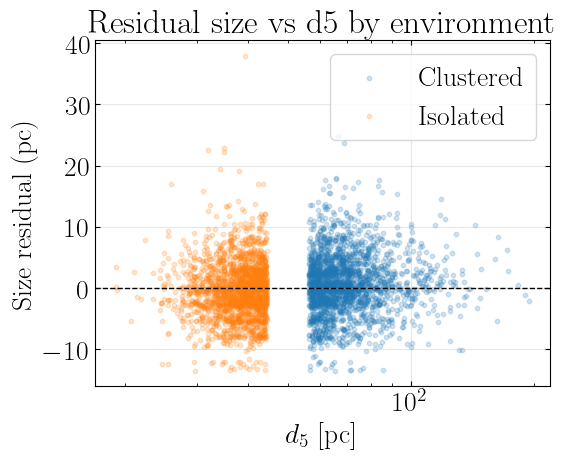

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import ks_2samp, mannwhitneyu, anderson_ksamp, spearmanr

# --------------------------------------------------
# COLUMN NAMES
# --------------------------------------------------
lha_col = "L_Ha_sum_dered"
size_col = "radius_p50_pc"
d5_col = "distance_5th_closest_pc_deproj"
size_resid_col = "radius_p50_pc_residual"   # created in your radial-gradient subtraction step

# --------------------------------------------------
# 1) ADD Halpha SURFACE BRIGHTNESS / SURFACE DENSITY
# --------------------------------------------------
# Area in pc^2 using your size measure as a radius
cat_resid["area_pc2"] = np.pi * cat_resid[size_col]**2

# Halpha luminosity surface density: erg s^-1 pc^-2
cat_resid["Sigma_Ha"] = cat_resid[lha_col] / cat_resid["area_pc2"]

# Often useful to work in log space
cat_resid["log_Sigma_Ha"] = np.log10(cat_resid["Sigma_Ha"])

print("Added columns: area_pc2, Sigma_Ha, log_Sigma_Ha")

# --------------------------------------------------
# 2) COMPARE SURFACE BRIGHTNESS BETWEEN ENVIRONMENTS
# --------------------------------------------------
iso = cat_resid.loc[cat_resid["environment"] == "Isolated", "log_Sigma_Ha"].dropna()
clu = cat_resid.loc[cat_resid["environment"] == "Clustered", "log_Sigma_Ha"].dropna()

print("\n" + "="*60)
print("log Sigma_Ha  [surface brightness / luminosity surface density]")

ks_stat, ks_p = ks_2samp(iso, clu)
print(f"KS test: stat = {ks_stat:.4f}, p = {ks_p:.3e}")

try:
    ad_result = anderson_ksamp([iso, clu])
    print(f"Anderson-Darling: stat = {ad_result.statistic:.4f}, p ≈ {ad_result.significance_level:.3e}")
except Exception as e:
    print("Anderson-Darling failed:", e)

u_stat, mw_p = mannwhitneyu(iso, clu, alternative="two-sided")
print(f"Mann-Whitney U: stat = {u_stat:.4f}, p = {mw_p:.3e}")

print(f"Isolated median log Sigma_Ha: {np.median(iso):.4f}")
print(f"Clustered median log Sigma_Ha: {np.median(clu):.4f}")

# --------------------------------------------------
# 3) HIST / CDF OF log Sigma_Ha
# --------------------------------------------------
plt.figure(figsize=(6, 4))
bins = np.linspace(
    np.nanpercentile(cat_resid["log_Sigma_Ha"], 1),
    np.nanpercentile(cat_resid["log_Sigma_Ha"], 99),
    40
)
plt.hist(iso, bins=bins, alpha=0.5, density=True, label="Isolated")
plt.hist(clu, bins=bins, alpha=0.5, density=True, label="Clustered")
plt.xlabel(r'$\log \Sigma_{\mathrm{H}\alpha}$  [erg s$^{-1}$ pc$^{-2}$]')
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

def plot_cdf(a, b, xlabel):
    a = np.sort(np.asarray(a))
    b = np.sort(np.asarray(b))
    ya = np.arange(1, len(a)+1) / len(a)
    yb = np.arange(1, len(b)+1) / len(b)

    plt.figure(figsize=(6, 4))
    plt.plot(a, ya, label="Isolated")
    plt.plot(b, yb, label="Clustered")
    plt.xlabel(xlabel)
    plt.ylabel("CDF")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_cdf(
    iso, clu,
    xlabel=r'$\log \Sigma_{\mathrm{H}\alpha}$  [erg s$^{-1}$ pc$^{-2}$]'
)

# --------------------------------------------------
# 4) SHOW SIZE VS d5 (RAW)
# --------------------------------------------------
sub = cat_resid[[d5_col, size_col, "environment"]].dropna().copy()

rho_raw, p_raw = spearmanr(sub[d5_col], sub[size_col])
print("\n" + "="*60)
print("Raw size vs d5")
print(f"Spearman rho = {rho_raw:.4f}, p = {p_raw:.3e}")

plt.figure(figsize=(6, 5))
plt.scatter(sub[d5_col], sub[size_col], s=10, alpha=0.2)
plt.xlabel(r'$d_5$ [pc]')
plt.ylabel("Size (pc)")
plt.title("Raw size vs distance to 5th closest region")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Optional: log x-axis, often clearer if d5 spans a wide range
plt.figure(figsize=(6, 5))
plt.scatter(sub[d5_col], sub[size_col], s=10, alpha=0.2)
plt.xscale("log")
plt.xlabel(r'$d_5$ [pc]')
plt.ylabel("Size (pc)")
plt.title("Raw size vs distance to 5th closest region (log x)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 5) SHOW SIZE RESIDUAL VS d5 (BETTER TEST)
# --------------------------------------------------
sub_resid = cat_resid[[d5_col, size_resid_col, "environment"]].dropna().copy()

rho_resid, p_resid = spearmanr(sub_resid[d5_col], sub_resid[size_resid_col])
print("\n" + "="*60)
print("Size residual vs d5")
print(f"Spearman rho = {rho_resid:.4f}, p = {p_resid:.3e}")

plt.figure(figsize=(6, 5))
plt.scatter(sub_resid[d5_col], sub_resid[size_resid_col], s=10, alpha=0.2)
plt.axhline(0, ls="--", lw=1, color="k")
plt.xlabel(r'$d_5$ [pc]')
plt.ylabel("Size residual (pc)")
plt.title("Residual size vs distance to 5th closest region")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 5))
plt.scatter(sub_resid[d5_col], sub_resid[size_resid_col], s=10, alpha=0.2)
plt.axhline(0, ls="--", lw=1, color="k")
plt.xscale("log")
plt.xlabel(r'$d_5$ [pc]')
plt.ylabel("Size residual (pc)")
plt.title("Residual size vs distance to 5th closest region (log x)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 6) BINNED MEDIAN TREND OF SIZE RESIDUAL VS d5
# --------------------------------------------------
# qcut makes equal-number bins, which usually works well
n_bins = 8
sub_resid["d5_bin"] = pd.qcut(sub_resid[d5_col], q=n_bins, duplicates="drop")

trend = sub_resid.groupby("d5_bin", observed=False).agg(
    d5_median=(d5_col, "median"),
    size_resid_median=(size_resid_col, "median"),
    size_resid_p16=(size_resid_col, lambda x: np.percentile(x, 16)),
    size_resid_p84=(size_resid_col, lambda x: np.percentile(x, 84)),
    N=(size_resid_col, "size")
).reset_index()

yerr_lower = trend["size_resid_median"] - trend["size_resid_p16"]
yerr_upper = trend["size_resid_p84"] - trend["size_resid_median"]

plt.figure(figsize=(6, 5))
plt.errorbar(
    trend["d5_median"],
    trend["size_resid_median"],
    yerr=[yerr_lower, yerr_upper],
    fmt="o-",
    capsize=3
)
plt.axhline(0, ls="--", lw=1, color="k")
plt.xscale("log")
plt.xlabel(r'Median $d_5$ in bin [pc]')
plt.ylabel("Median size residual (pc)")
plt.title("Binned trend: residual size vs d5")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("\nBinned trend table:")
print(trend)

# --------------------------------------------------
# 7) OPTIONAL: COLOR RAW SIZE-vs-d5 BY ENVIRONMENT
# --------------------------------------------------
plt.figure(figsize=(6, 5))

iso_sub = sub_resid[sub_resid["environment"] == "Isolated"]
clu_sub = sub_resid[sub_resid["environment"] == "Clustered"]

plt.scatter(clu_sub[d5_col], clu_sub[size_resid_col], s=10, alpha=0.2, label="Clustered")
plt.scatter(iso_sub[d5_col], iso_sub[size_resid_col], s=10, alpha=0.2, label="Isolated")

plt.axhline(0, ls="--", lw=1, color="k")
plt.xscale("log")
plt.xlabel(r'$d_5$ [pc]')
plt.ylabel("Size residual (pc)")
plt.title("Residual size vs d5 by environment")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

ENVIRONMENT DEFINITION
Clustered: distance_5th_closest_pc_deproj <= 44.551 pc
Isolated:  distance_5th_closest_pc_deproj >= 56.352 pc
environment
Isolated        2213
Clustered       2148
Intermediate    2147

1) RADIAL TRENDS
Electron Density (cm$^{-3}$): increases with radius; Spearman rho=0.120, p=2.58e-13, inner median=85.32, outer median=128.3
Ionization Parameter (Kobulnicky \& Kewley 2004): increases with radius; Spearman rho=0.131, p=1.83e-24, inner median=-3.541, outer median=-3.461
O/H (Brazzini+2024 N2S2Halpha): decreases with radius; Spearman rho=-0.553, p=0.00e+00, inner median=8.399, outer median=8.232
Size (pc): decreases with radius; Spearman rho=-0.104, p=5.11e-17, inner median=13.18, outer median=12.36
$L_{\mathrm{H}\alpha}$ (erg/s): decreases with radius; Spearman rho=-0.348, p=1.14e-177, inner median=2.179e+36, outer median=5.132e+35

2) CLUSTERING / ENVIRONMENT TESTS
Electron Density (cm$^{-3}$):
  N(Isolated)=1210, N(Clustered)=1224
  KS statistic=0.0791, p=9.045e-

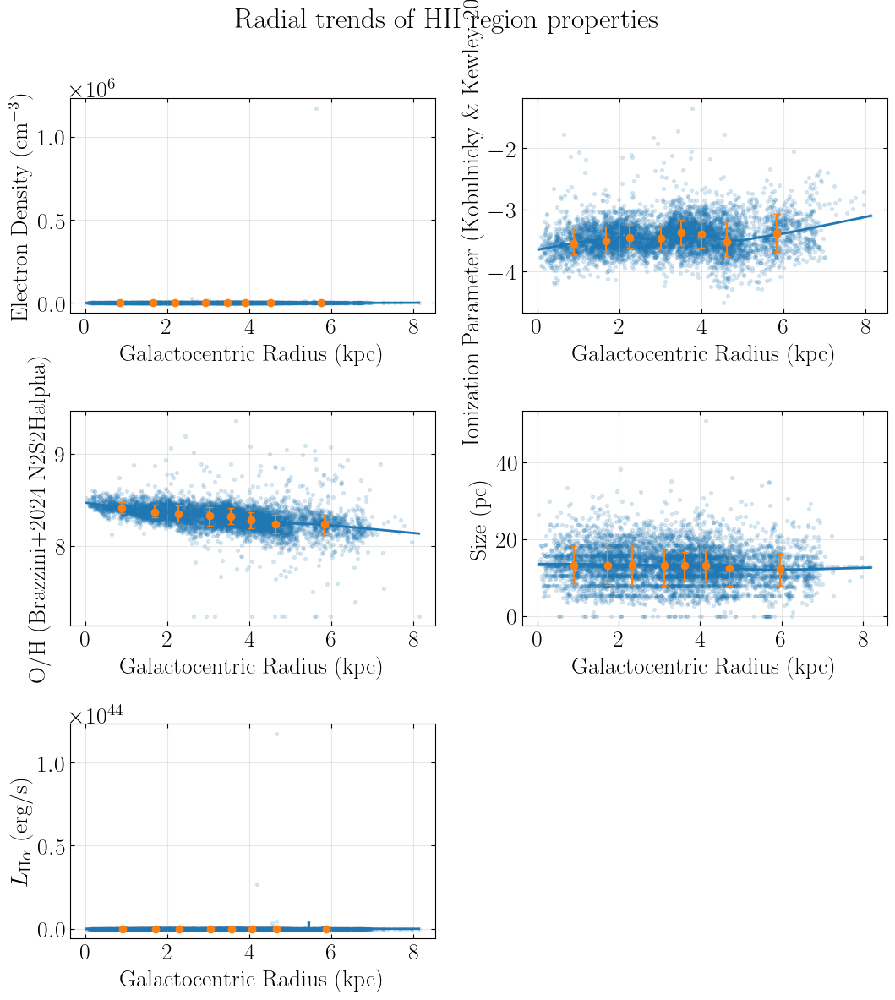

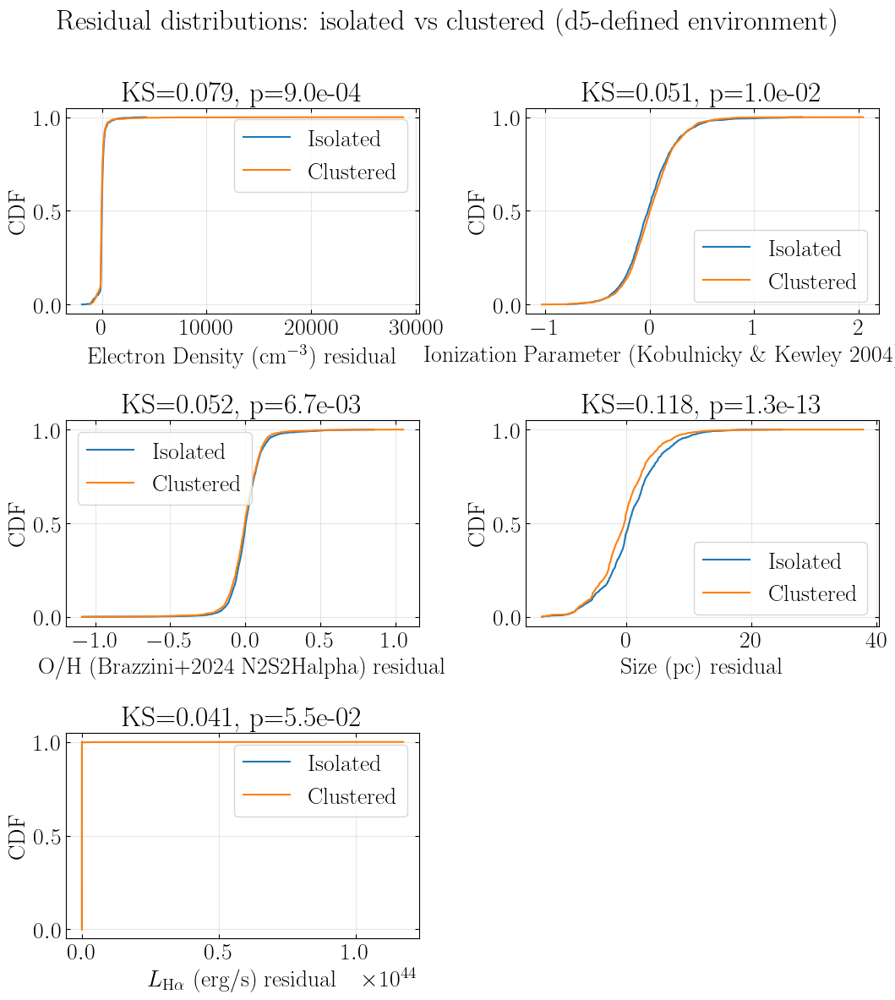

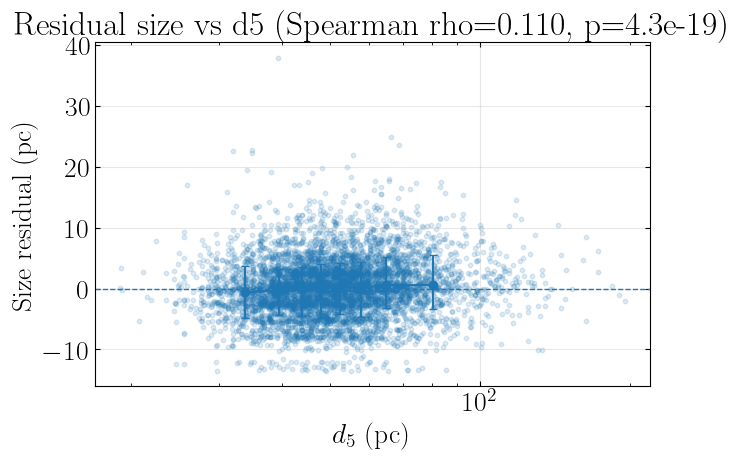

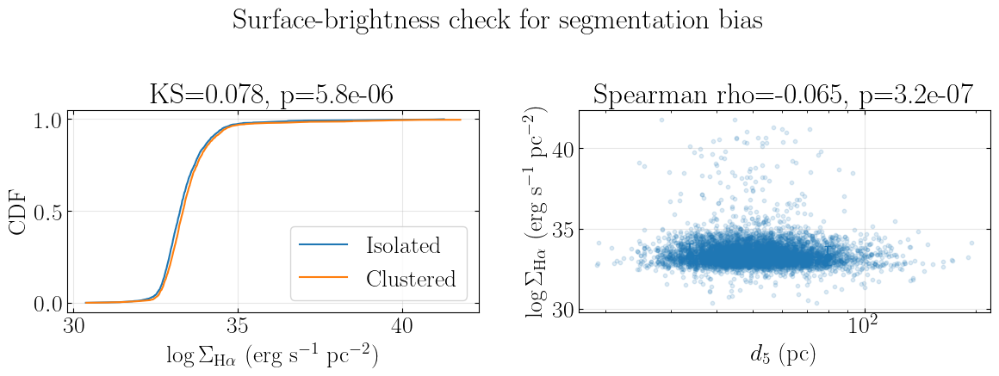


FINAL INTERPRETIVE SUMMARY
Strongest isolated-vs-clustered residual difference: Size (pc)
  KS=0.1177, p=1.274e-13
Suggested paper narrative:
1) Use Figure 1 to show the galaxy-scale radial trends in all HII-region properties.
2) Define local environment with d5, where small d5 = clustered and large d5 = isolated.
3) Use Figure 2 + the KS table to show which properties remain different after subtracting the radial trend.
4) Use Figure 3 as the main clustering result: a continuous residual-size vs d5 relation.
5) Use Figure 4 as a robustness check against pure segmentation bias via Halpha surface brightness.


In [79]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import ks_2samp, spearmanr
from statsmodels.nonparametric.smoothers_lowess import lowess

# ============================================================
# USER INPUTS
# ============================================================
# Assumes your catalog is already loaded as: cat

radius_col = "R_gal_kpc"
d5_col = "distance_5th_closest_pc_deproj"
size_col = "radius_p50_pc"
lha_col = "L_Ha_sum_dered"

# Properties to analyze: (column_name, pretty_label)
properties = [
    ("ne_SII_cm3", r"Electron Density (cm$^{-3}$)"),
    ("logU_KK04", r"Ionization Parameter (Kobulnicky \& Kewley 2004)"),
    ("Z_N2S2Halpha_Brazzini2024", r"O/H (Brazzini+2024 N2S2Halpha)"),
    ("radius_p50_pc", r"Size (pc)"),
    ("L_Ha_sum_dered", r"$L_{\mathrm{H}\alpha}$ (erg/s)")
]

# LOWESS smoothing strength for radial trends
lowess_frac = 0.25

# Number of bins for radial profiles and d5 trends
n_radial_bins = 8
n_d5_bins = 8

# If you want to save figures/results, set this to a directory path.
# Set to None to skip saving.
OUTPUT_DIR = None
# Example:
# OUTPUT_DIR = CATALOG_DIR

# ============================================================
# HELPER FUNCTIONS
# ============================================================
def ensure_dir(path):
    if path is not None:
        os.makedirs(path, exist_ok=True)

def lowess_trend_and_residuals(x, y, frac=0.25):
    """
    Fit LOWESS trend y(x) and return:
      trend at the original x positions
      residual = y - trend
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    good = np.isfinite(x) & np.isfinite(y)
    trend = np.full_like(y, np.nan, dtype=float)
    resid = np.full_like(y, np.nan, dtype=float)

    if good.sum() < 5:
        return trend, resid

    fit = lowess(y[good], x[good], frac=frac, return_sorted=True)
    x_fit = fit[:, 0]
    y_fit = fit[:, 1]

    trend_good = np.interp(x[good], x_fit, y_fit)
    trend[good] = trend_good
    resid[good] = y[good] - trend_good

    return trend, resid

def make_qbins(series, q=8):
    """
    Quantile bins with duplicate handling.
    """
    s = pd.Series(series).dropna()
    if s.empty:
        return pd.Series(index=series.index if isinstance(series, pd.Series) else range(len(series)), dtype=object)
    return pd.qcut(series, q=q, duplicates="drop")

def binned_profile(x, y, q=8):
    """
    Quantile-binned median profile with 16/84 percentile spread.
    """
    df = pd.DataFrame({"x": x, "y": y}).dropna()
    if len(df) < q:
        return pd.DataFrame(columns=["x_median", "y_median", "y_p16", "y_p84", "N"])

    df["bin"] = pd.qcut(df["x"], q=q, duplicates="drop")
    out = df.groupby("bin", observed=False).agg(
        x_median=("x", "median"),
        y_median=("y", "median"),
        y_p16=("y", lambda z: np.percentile(z, 16)),
        y_p84=("y", lambda z: np.percentile(z, 84)),
        N=("y", "size")
    ).reset_index(drop=True)
    return out

def plot_cdf(ax, a, b, label_a="Isolated", label_b="Clustered"):
    a = np.sort(np.asarray(a, dtype=float))
    b = np.sort(np.asarray(b, dtype=float))
    ya = np.arange(1, len(a) + 1) / len(a)
    yb = np.arange(1, len(b) + 1) / len(b)

    ax.plot(a, ya, label=label_a)
    ax.plot(b, yb, label=label_b)
    ax.set_ylabel("CDF")
    ax.grid(alpha=0.3)

def radial_summary_string(x, y, trend):
    """
    Simple text summary for radial behavior.
    """
    df = pd.DataFrame({"x": x, "y": y, "trend": trend}).dropna()
    if len(df) < 10:
        return "insufficient data"

    rho, p = spearmanr(df["x"], df["y"])
    q1 = df["x"].quantile(0.2)
    q2 = df["x"].quantile(0.8)

    inner = df.loc[df["x"] <= q1, "y"].median()
    outer = df.loc[df["x"] >= q2, "y"].median()

    if outer > inner:
        direction = "increases with radius"
    elif outer < inner:
        direction = "decreases with radius"
    else:
        direction = "is roughly flat with radius"

    return f"{direction}; Spearman rho={rho:.3f}, p={p:.2e}, inner median={inner:.4g}, outer median={outer:.4g}"

def ks_environment_test(df, col, env_col="environment"):
    sub = df[[col, env_col]].dropna()
    iso = sub.loc[sub[env_col] == "Isolated", col].values
    clu = sub.loc[sub[env_col] == "Clustered", col].values

    if len(iso) < 3 or len(clu) < 3:
        return {
            "N_isolated": len(iso),
            "N_clustered": len(clu),
            "KS_stat": np.nan,
            "KS_p": np.nan,
            "Iso_median": np.nan if len(iso) == 0 else np.median(iso),
            "Clu_median": np.nan if len(clu) == 0 else np.median(clu),
        }

    ks_stat, ks_p = ks_2samp(iso, clu)
    return {
        "N_isolated": len(iso),
        "N_clustered": len(clu),
        "KS_stat": ks_stat,
        "KS_p": ks_p,
        "Iso_median": np.median(iso),
        "Clu_median": np.median(clu),
    }

def interpret_ks(p):
    if not np.isfinite(p):
        return "insufficient data"
    if p < 1e-4:
        return "very strong evidence the distributions differ"
    if p < 1e-2:
        return "strong evidence the distributions differ"
    if p < 5e-2:
        return "marginal evidence the distributions differ"
    return "no strong evidence the distributions differ"

# ============================================================
# COPY CATALOG AND DEFINE ENVIRONMENT USING d5
# ============================================================
cat2 = cat.copy()

# Environment based on d5:
# small d5 = clustered
# large d5 = isolated
q_low = cat2[d5_col].quantile(0.33)
q_high = cat2[d5_col].quantile(0.66)

cat2["environment"] = "Intermediate"
cat2.loc[cat2[d5_col] <= q_low, "environment"] = "Clustered"
cat2.loc[cat2[d5_col] >= q_high, "environment"] = "Isolated"

print("=" * 80)
print("ENVIRONMENT DEFINITION")
print(f"Clustered: {d5_col} <= {q_low:.3f} pc")
print(f"Isolated:  {d5_col} >= {q_high:.3f} pc")
print(cat2["environment"].value_counts(dropna=False).to_string())

# ============================================================
# ADD Halpha SURFACE BRIGHTNESS / LUMINOSITY SURFACE DENSITY
# ============================================================
# Treat size_col as a radius in pc
cat2["area_pc2"] = np.pi * cat2[size_col]**2
cat2["Sigma_Ha"] = cat2[lha_col] / cat2["area_pc2"]
cat2["log_Sigma_Ha"] = np.log10(cat2["Sigma_Ha"].where(cat2["Sigma_Ha"] > 0))

# ============================================================
# FIT RADIAL TRENDS AND BUILD RESIDUALS
# ============================================================
radial_summaries = []
for prop, label in properties:
    trend_col = f"{prop}_radial_trend"
    resid_col = f"{prop}_residual"

    trend, resid = lowess_trend_and_residuals(
        cat2[radius_col].values,
        cat2[prop].values,
        frac=lowess_frac
    )
    cat2[trend_col] = trend
    cat2[resid_col] = resid

    summary = radial_summary_string(cat2[radius_col], cat2[prop], cat2[trend_col])
    radial_summaries.append({
        "property": prop,
        "label": label,
        "summary": summary
    })

# Also make residuals for log_Sigma_Ha if desired
trend, resid = lowess_trend_and_residuals(
    cat2[radius_col].values,
    cat2["log_Sigma_Ha"].values,
    frac=lowess_frac
)
cat2["log_Sigma_Ha_radial_trend"] = trend
cat2["log_Sigma_Ha_residual"] = resid

# ============================================================
# PRINT RADIAL TREND SUMMARIES
# ============================================================
print("\n" + "=" * 80)
print("1) RADIAL TRENDS")
for row in radial_summaries:
    print(f"{row['label']}: {row['summary']}")

# ============================================================
# KS TESTS ON RESIDUALS: ISOLATED VS CLUSTERED
# ============================================================
results = []
for prop, label in properties:
    resid_col = f"{prop}_residual"
    res = ks_environment_test(cat2, resid_col, env_col="environment")
    results.append({
        "property": prop,
        "label": label,
        "test_column": resid_col,
        **res,
        "interpretation": interpret_ks(res["KS_p"])
    })

# Add the surface brightness test
res_sigma = ks_environment_test(cat2, "log_Sigma_Ha", env_col="environment")
results.append({
    "property": "log_Sigma_Ha",
    "label": r"$\log \Sigma_{\mathrm{H}\alpha}$ (erg s$^{-1}$ pc$^{-2}$)",
    "test_column": "log_Sigma_Ha",
    **res_sigma,
    "interpretation": interpret_ks(res_sigma["KS_p"])
})

results_df = pd.DataFrame(results)

print("\n" + "=" * 80)
print("2) CLUSTERING / ENVIRONMENT TESTS")
for _, row in results_df.iterrows():
    print(f"{row['label']}:")
    print(f"  N(Isolated)={row['N_isolated']}, N(Clustered)={row['N_clustered']}")
    print(f"  KS statistic={row['KS_stat']:.4f}, p={row['KS_p']:.3e}")
    print(f"  Median(Isolated)={row['Iso_median']:.6g}")
    print(f"  Median(Clustered)={row['Clu_median']:.6g}")
    print(f"  Interpretation: {row['interpretation']}")
    print()

# ============================================================
# CONTINUOUS TREND TESTS WITH d5
# ============================================================
size_sub = cat2[[d5_col, f"{size_col}_residual", size_col]].dropna()

rho_raw, p_raw = spearmanr(size_sub[d5_col], size_sub[size_col])
rho_resid, p_resid = spearmanr(size_sub[d5_col], size_sub[f"{size_col}_residual"])

print("=" * 80)
print("3) CONTINUOUS d5 TRENDS")
print(f"Raw size vs d5:      Spearman rho={rho_raw:.4f}, p={p_raw:.3e}")
print(f"Size residual vs d5: Spearman rho={rho_resid:.4f}, p={p_resid:.3e}")
if p_resid < 0.01:
    if rho_resid > 0:
        print("Interpretation: more isolated regions (larger d5) tend to have larger sizes even after removing the radial trend.")
    else:
        print("Interpretation: more isolated regions (larger d5) tend to have smaller sizes even after removing the radial trend.")
else:
    print("Interpretation: no strong continuous size-environment trend after removing the radial trend.")

# ============================================================
# FIGURE 1: RADIAL TRENDS (scatter + LOWESS + binned medians)
# ============================================================
n_props = len(properties)
ncols = 2
nrows = math.ceil(n_props / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(11, 4 * nrows))
axes = np.atleast_1d(axes).ravel()

for i, (prop, label) in enumerate(properties):
    ax = axes[i]
    sub = cat2[[radius_col, prop, f"{prop}_radial_trend"]].dropna()

    ax.scatter(sub[radius_col], sub[prop], s=8, alpha=0.15)

    # LOWESS line
    order = np.argsort(sub[radius_col].values)
    ax.plot(
        sub[radius_col].values[order],
        sub[f"{prop}_radial_trend"].values[order],
        lw=2
    )

    # Binned medians
    prof = binned_profile(sub[radius_col], sub[prop], q=n_radial_bins)
    if len(prof) > 0:
        yerr_lower = prof["y_median"] - prof["y_p16"]
        yerr_upper = prof["y_p84"] - prof["y_median"]
        ax.errorbar(
            prof["x_median"],
            prof["y_median"],
            yerr=[yerr_lower, yerr_upper],
            fmt="o",
            capsize=3
        )

    ax.set_xlabel("Galactocentric Radius (kpc)")
    ax.set_ylabel(label)
    ax.grid(alpha=0.3)

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

fig.suptitle("Radial trends of HII region properties", y=0.995)
plt.tight_layout()
if OUTPUT_DIR is not None:
    ensure_dir(OUTPUT_DIR)
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_radial_trends.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# FIGURE 2: RESIDUAL CDFs FOR ISOLATED VS CLUSTERED
# ============================================================
fig, axes = plt.subplots(nrows, ncols, figsize=(11, 4 * nrows))
axes = np.atleast_1d(axes).ravel()

for i, (prop, label) in enumerate(properties):
    ax = axes[i]
    resid_col = f"{prop}_residual"
    sub = cat2[[resid_col, "environment"]].dropna()

    iso = sub.loc[sub["environment"] == "Isolated", resid_col].values
    clu = sub.loc[sub["environment"] == "Clustered", resid_col].values

    if len(iso) > 2 and len(clu) > 2:
        ks_stat, ks_p = ks_2samp(iso, clu)
        plot_cdf(ax, iso, clu)
        ax.set_xlabel(f"{label} residual")
        ax.set_title(f"KS={ks_stat:.3f}, p={ks_p:.1e}")
        ax.legend()
    else:
        ax.text(0.5, 0.5, "Insufficient data", ha="center", va="center", transform=ax.transAxes)
        ax.set_axis_off()

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

fig.suptitle("Residual distributions: isolated vs clustered (d5-defined environment)", y=0.995)
plt.tight_layout()
if OUTPUT_DIR is not None:
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_residual_cdfs.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# FIGURE 3: MAIN RESULT -- SIZE RESIDUAL VS d5
# ============================================================
sub = cat2[[d5_col, f"{size_col}_residual"]].dropna()
prof = binned_profile(sub[d5_col], sub[f"{size_col}_residual"], q=n_d5_bins)

fig, ax = plt.subplots(figsize=(7, 5))
ax.scatter(sub[d5_col], sub[f"{size_col}_residual"], s=10, alpha=0.15)
ax.axhline(0, ls="--", lw=1)

if len(prof) > 0:
    yerr_lower = prof["y_median"] - prof["y_p16"]
    yerr_upper = prof["y_p84"] - prof["y_median"]
    ax.errorbar(
        prof["x_median"],
        prof["y_median"],
        yerr=[yerr_lower, yerr_upper],
        fmt="o-",
        capsize=3,
        lw=1.5
    )

ax.set_xscale("log")
ax.set_xlabel(r"$d_5$ (pc)")
ax.set_ylabel("Size residual (pc)")
ax.set_title(f"Residual size vs d5   (Spearman rho={rho_resid:.3f}, p={p_resid:.1e})")
ax.grid(alpha=0.3)

plt.tight_layout()
if OUTPUT_DIR is not None:
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_size_residual_vs_d5.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# FIGURE 4: SEGMENTATION CHECK WITH Halpha SURFACE BRIGHTNESS
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))

# 4a) CDF of log Sigma_Ha for isolated vs clustered
sub = cat2[["log_Sigma_Ha", "environment"]].dropna()
iso = sub.loc[sub["environment"] == "Isolated", "log_Sigma_Ha"].values
clu = sub.loc[sub["environment"] == "Clustered", "log_Sigma_Ha"].values

if len(iso) > 2 and len(clu) > 2:
    ks_stat, ks_p = ks_2samp(iso, clu)
    plot_cdf(axes[0], iso, clu)
    axes[0].set_xlabel(r"$\log \Sigma_{\mathrm{H}\alpha}$ (erg s$^{-1}$ pc$^{-2}$)")
    axes[0].set_title(f"KS={ks_stat:.3f}, p={ks_p:.1e}")
    axes[0].legend()

# 4b) log Sigma_Ha vs d5
sub2 = cat2[[d5_col, "log_Sigma_Ha"]].dropna()
rho_sigma, p_sigma = spearmanr(sub2[d5_col], sub2["log_Sigma_Ha"])
prof2 = binned_profile(sub2[d5_col], sub2["log_Sigma_Ha"], q=n_d5_bins)

axes[1].scatter(sub2[d5_col], sub2["log_Sigma_Ha"], s=10, alpha=0.15)
if len(prof2) > 0:
    yerr_lower = prof2["y_median"] - prof2["y_p16"]
    yerr_upper = prof2["y_p84"] - prof2["y_median"]
    axes[1].errorbar(
        prof2["x_median"],
        prof2["y_median"],
        yerr=[yerr_lower, yerr_upper],
        fmt="o-",
        capsize=3,
        lw=1.5
    )
axes[1].set_xscale("log")
axes[1].set_xlabel(r"$d_5$ (pc)")
axes[1].set_ylabel(r"$\log \Sigma_{\mathrm{H}\alpha}$ (erg s$^{-1}$ pc$^{-2}$)")
axes[1].set_title(f"Spearman rho={rho_sigma:.3f}, p={p_sigma:.1e}")
axes[1].grid(alpha=0.3)

fig.suptitle("Surface-brightness check for segmentation bias", y=0.995)
plt.tight_layout()
if OUTPUT_DIR is not None:
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_sigmaHa_checks.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# OPTIONAL: SAVE TABLES / CATALOG
# ============================================================
if OUTPUT_DIR is not None:
    ensure_dir(OUTPUT_DIR)
    cat2.to_csv(os.path.join(OUTPUT_DIR, "catalog_with_radial_trends_residuals_and_environment.csv"), index=False)
    results_df.to_csv(os.path.join(OUTPUT_DIR, "environment_ks_summary.csv"), index=False)
    pd.DataFrame(radial_summaries).to_csv(os.path.join(OUTPUT_DIR, "radial_trend_summaries.csv"), index=False)
    prof.to_csv(os.path.join(OUTPUT_DIR, "size_residual_vs_d5_binned_profile.csv"), index=False)
    print(f"Saved outputs to: {OUTPUT_DIR}")

# ============================================================
# FINAL INTERPRETIVE SUMMARY
# ============================================================
print("\n" + "=" * 80)
print("FINAL INTERPRETIVE SUMMARY")

# Find strongest KS result among residuals only
resid_only = results_df[results_df["property"].isin([p for p, _ in properties])].copy()
if len(resid_only) > 0 and np.isfinite(resid_only["KS_stat"]).any():
    strongest = resid_only.loc[resid_only["KS_stat"].idxmax()]
    print(f"Strongest isolated-vs-clustered residual difference: {strongest['label']}")
    print(f"  KS={strongest['KS_stat']:.4f}, p={strongest['KS_p']:.3e}")

print("Suggested paper narrative:")
print("1) Use Figure 1 to show the galaxy-scale radial trends in all HII-region properties.")
print("2) Define local environment with d5, where small d5 = clustered and large d5 = isolated.")
print("3) Use Figure 2 + the KS table to show which properties remain different after subtracting the radial trend.")
print("4) Use Figure 3 as the main clustering result: a continuous residual-size vs d5 relation.")
print("5) Use Figure 4 as a robustness check against pure segmentation bias via Halpha surface brightness.")

In [80]:
for col in cat:
    print(col)

region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_int
F_Hbeta_e_int
SNR_Hbeta_int
F_[OIII]4959_int
F_[OIII]4959_e_int
SNR_[OIII]4959_int
F_[OI

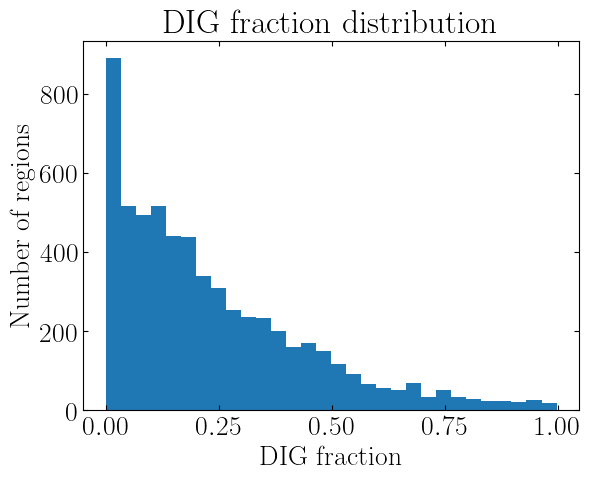

In [122]:
ratio = cat['bg_local']*cat['area_px_after_carve']/cat['F_Halpha_sum_dered']

# ratio = cat['Halpha_b_edge']/cat['F_Halpha_sum_dered']

mask = np.isfinite(ratio) & (ratio > 0) & (ratio < 1)
cat['DIG_fraction'] = ratio[mask]
plt.hist(ratio[mask], bins = 30)
plt.xlabel('DIG fraction')
plt.ylabel('Number of regions')
plt.title('DIG fraction distribution')
plt.show()

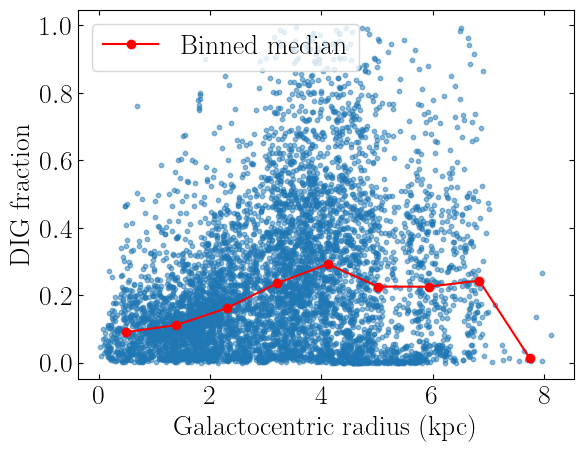

In [123]:
plt.scatter(cat['R_gal_kpc'], cat['DIG_fraction'], s=10, alpha=0.5)
#plot binned median trend
bins = np.linspace(cat['R_gal_kpc'].min(), cat['R_gal_kpc'].max(), 10)
bin_centers = 0.5 * (bins[:- 1] + bins[1:])
bin_medians = []
for i in range(len(bins) - 1):
    in_bin = (cat['R_gal_kpc'] >= bins[i]) & (cat['R_gal_kpc'] < bins[i + 1]) & mask
    if in_bin.sum() > 0:
        bin_medians.append(cat.loc[in_bin, 'DIG_fraction'].median())
    else:
        bin_medians.append(np.nan)
plt.plot(bin_centers, bin_medians, marker='o', color='red', label='Binned median')
plt.legend()
plt.xlabel('Galactocentric radius (kpc)')
plt.ylabel('DIG fraction')
plt.show()

DIG ENVIRONMENT DEFINITION
Low DIG:  DIG_fraction <= 0.1066
High DIG: DIG_fraction >= 0.2735
DIG_environment
Intermediate    2440
High DIG        2064
Low DIG         2004

1) RADIAL TREND OF DIG FRACTION
increases with radius; Spearman rho=0.252, p=6.26e-89, inner median=0.1046, outer median=0.2265

2) RADIAL TRENDS OF HII REGION PROPERTIES
Electron Density (cm$^{-3}$): increases with radius; Spearman rho=0.120, p=2.58e-13, inner median=85.32, outer median=128.3
Ionization Parameter (Kobulnicky \& Kewley 2004): increases with radius; Spearman rho=0.131, p=1.83e-24, inner median=-3.541, outer median=-3.461
O/H (Brazzini+2024 N2S2Halpha): decreases with radius; Spearman rho=-0.553, p=0.00e+00, inner median=8.399, outer median=8.232
Size (pc): decreases with radius; Spearman rho=-0.104, p=5.11e-17, inner median=13.18, outer median=12.36
$L_{\mathrm{H}\alpha}$ (erg/s): decreases with radius; Spearman rho=-0.348, p=1.14e-177, inner median=2.179e+36, outer median=5.132e+35

3) LOW-DIG VS HI

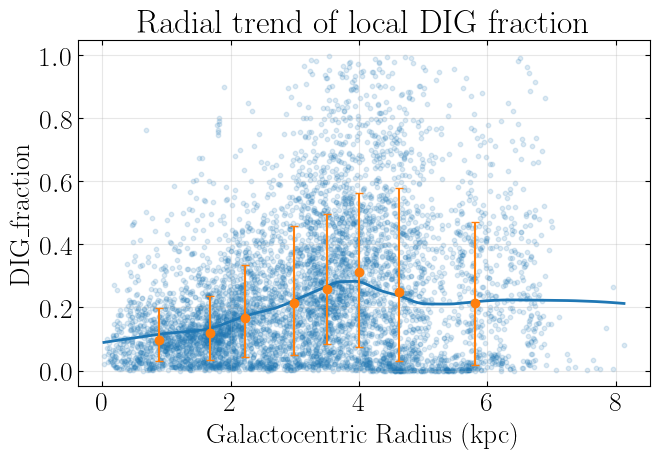

Python(2208) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2209) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2210) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2211) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2212) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2213) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2214) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2215) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2216) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2217) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


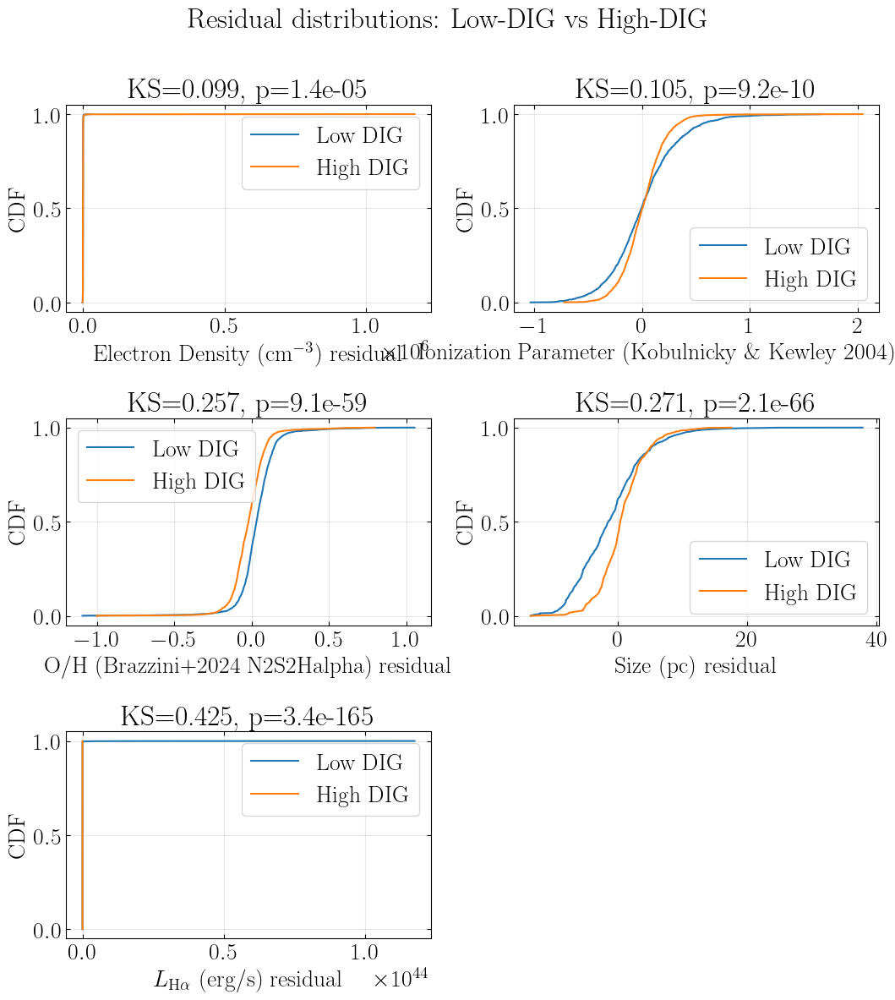

Python(2218) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2219) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2220) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2221) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2223) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2224) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2225) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2226) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2227) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2228) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


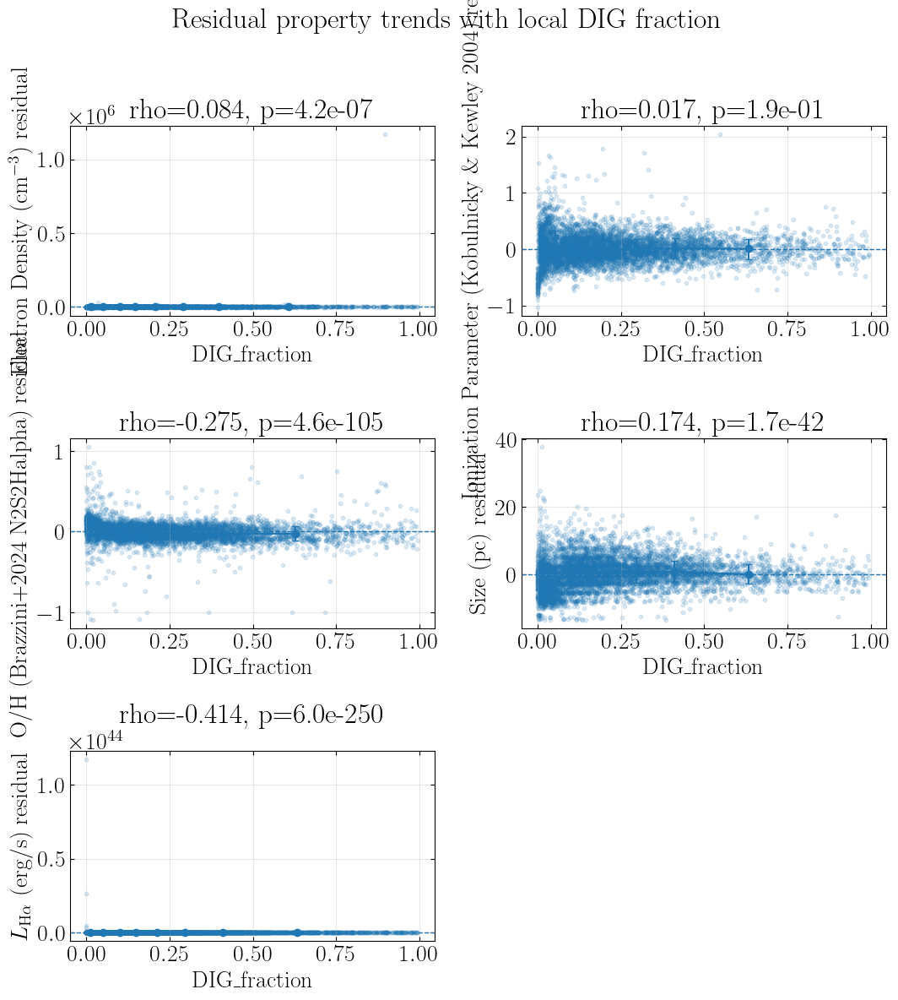

Python(2229) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(2230) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


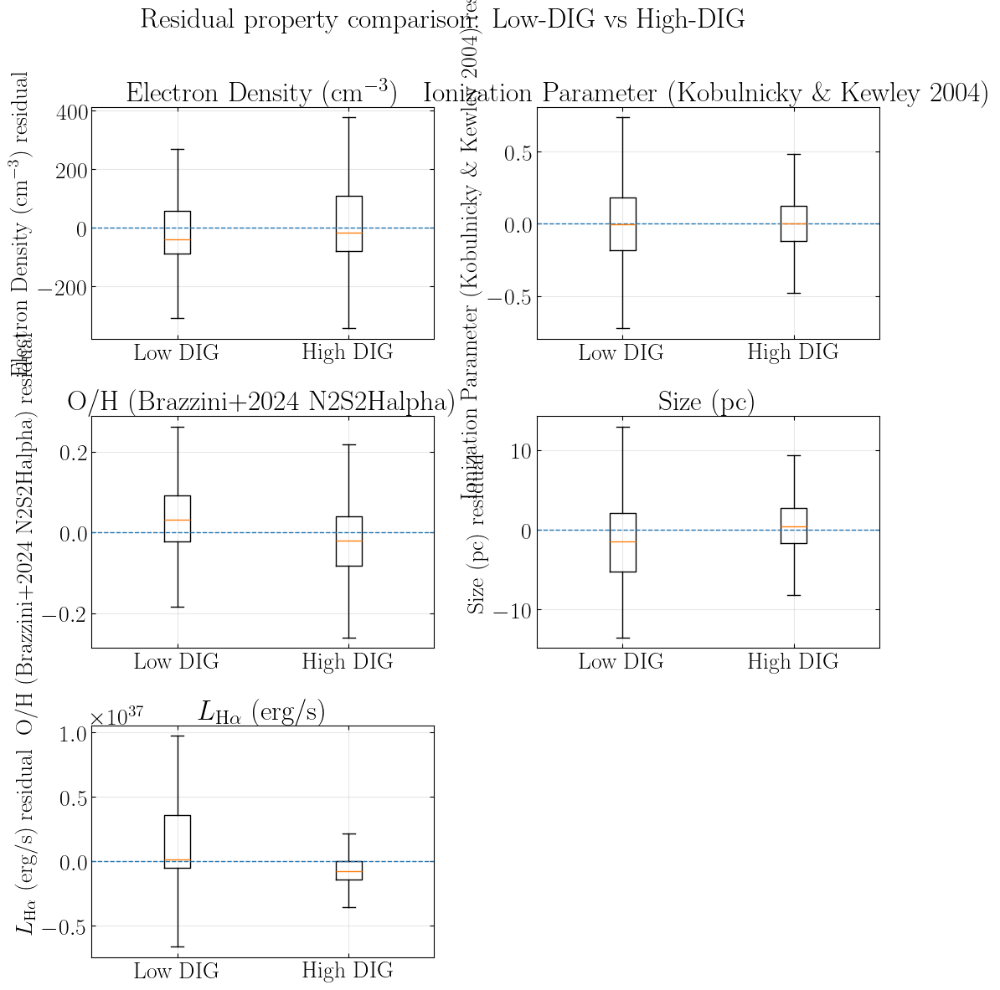


FINAL DIG SUMMARY
Strongest Low-DIG vs High-DIG residual difference:
  $L_{\mathrm{H}\alpha}$ (erg/s)
  KS=0.4249, p=3.393e-165
  Low-DIG median residual=1.48907e+35
  High-DIG median residual=-7.51583e+35

Strongest continuous residual trend with DIG_fraction:
  $L_{\mathrm{H}\alpha}$ (erg/s)
  rho=-0.4139, p=5.953e-250

Suggested interpretation framework:
1) Figure 1 shows whether local DIG fraction itself varies with galactocentric radius.
2) Figures 2 and the KS table show whether high-DIG and low-DIG regions differ at fixed radius.
3) Figure 3 shows whether those differences are continuous or only appear after thresholding.
4) If line-ratio-based quantities shift with DIG more strongly than structural quantities, DIG may be affecting diagnostics as well as environment.


In [124]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import ks_2samp, spearmanr
from statsmodels.nonparametric.smoothers_lowess import lowess

# ============================================================
# USER INPUTS
# ============================================================
# Assumes your catalog is already loaded as: cat

radius_col = "R_gal_kpc"
dig_col = "DIG_fraction"

properties = [
    ("ne_SII_cm3", r"Electron Density (cm$^{-3}$)"),
    ("logU_KK04", r"Ionization Parameter (Kobulnicky \& Kewley 2004)"),
    ("Z_N2S2Halpha_Brazzini2024", r"O/H (Brazzini+2024 N2S2Halpha)"),
    ("radius_p50_pc", r"Size (pc)"),
    ("L_Ha_sum_dered", r"$L_{\mathrm{H}\alpha}$ (erg/s)")
]

# LOWESS smoothing strengths
lowess_frac_prop = 0.25   # for radial trends in properties
lowess_frac_dig = 0.25    # for radial trend in DIG_fraction

# Number of bins
n_radial_bins = 8
n_dig_bins = 8

# Optional saving
OUTPUT_DIR = None
# Example:
# OUTPUT_DIR = CATALOG_DIR

# ============================================================
# HELPER FUNCTIONS
# ============================================================
def ensure_dir(path):
    if path is not None:
        os.makedirs(path, exist_ok=True)

def lowess_trend_and_residuals(x, y, frac=0.25):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    good = np.isfinite(x) & np.isfinite(y)
    trend = np.full_like(y, np.nan, dtype=float)
    resid = np.full_like(y, np.nan, dtype=float)

    if good.sum() < 5:
        return trend, resid

    fit = lowess(y[good], x[good], frac=frac, return_sorted=True)
    x_fit = fit[:, 0]
    y_fit = fit[:, 1]

    trend_good = np.interp(x[good], x_fit, y_fit)
    trend[good] = trend_good
    resid[good] = y[good] - trend_good

    return trend, resid

def binned_profile(x, y, q=8):
    df = pd.DataFrame({"x": x, "y": y}).dropna()
    if len(df) < q:
        return pd.DataFrame(columns=["x_median", "y_median", "y_p16", "y_p84", "N"])

    df["bin"] = pd.qcut(df["x"], q=q, duplicates="drop")
    out = df.groupby("bin", observed=False).agg(
        x_median=("x", "median"),
        y_median=("y", "median"),
        y_p16=("y", lambda z: np.percentile(z, 16)),
        y_p84=("y", lambda z: np.percentile(z, 84)),
        N=("y", "size")
    ).reset_index(drop=True)
    return out

def plot_cdf(ax, a, b, label_a="Low DIG", label_b="High DIG"):
    a = np.sort(np.asarray(a, dtype=float))
    b = np.sort(np.asarray(b, dtype=float))
    ya = np.arange(1, len(a) + 1) / len(a)
    yb = np.arange(1, len(b) + 1) / len(b)

    ax.plot(a, ya, label=label_a)
    ax.plot(b, yb, label=label_b)
    ax.set_ylabel("CDF")
    ax.grid(alpha=0.3)

def ks_test_groups(df, value_col, group_col="DIG_environment", low_label="Low DIG", high_label="High DIG"):
    sub = df[[value_col, group_col]].dropna()
    low = sub.loc[sub[group_col] == low_label, value_col].values
    high = sub.loc[sub[group_col] == high_label, value_col].values

    if len(low) < 3 or len(high) < 3:
        return {
            "N_low": len(low),
            "N_high": len(high),
            "KS_stat": np.nan,
            "KS_p": np.nan,
            "Low_median": np.nan if len(low) == 0 else np.median(low),
            "High_median": np.nan if len(high) == 0 else np.median(high),
        }

    ks_stat, ks_p = ks_2samp(low, high)
    return {
        "N_low": len(low),
        "N_high": len(high),
        "KS_stat": ks_stat,
        "KS_p": ks_p,
        "Low_median": np.median(low),
        "High_median": np.median(high),
    }

def interpret_ks(p):
    if not np.isfinite(p):
        return "insufficient data"
    if p < 1e-4:
        return "very strong evidence the distributions differ"
    if p < 1e-2:
        return "strong evidence the distributions differ"
    if p < 5e-2:
        return "marginal evidence the distributions differ"
    return "no strong evidence the distributions differ"

def radial_summary_string(x, y):
    df = pd.DataFrame({"x": x, "y": y}).dropna()
    if len(df) < 10:
        return "insufficient data"

    rho, p = spearmanr(df["x"], df["y"])
    q1 = df["x"].quantile(0.2)
    q2 = df["x"].quantile(0.8)

    inner = df.loc[df["x"] <= q1, "y"].median()
    outer = df.loc[df["x"] >= q2, "y"].median()

    if outer > inner:
        direction = "increases with radius"
    elif outer < inner:
        direction = "decreases with radius"
    else:
        direction = "is roughly flat with radius"

    return f"{direction}; Spearman rho={rho:.3f}, p={p:.2e}, inner median={inner:.4g}, outer median={outer:.4g}"

# ============================================================
# COPY CATALOG
# ============================================================
dig_cat = cat.copy()

# Keep only valid DIG_fraction values
dig_cat[dig_col] = pd.to_numeric(dig_cat[dig_col], errors="coerce")

# ============================================================
# DEFINE LOW-DIG / HIGH-DIG / INTERMEDIATE
# ============================================================
q_low = dig_cat[dig_col].quantile(0.33)
q_high = dig_cat[dig_col].quantile(0.66)

dig_cat["DIG_environment"] = "Intermediate"
dig_cat.loc[dig_cat[dig_col] <= q_low, "DIG_environment"] = "Low DIG"
dig_cat.loc[dig_cat[dig_col] >= q_high, "DIG_environment"] = "High DIG"

print("=" * 80)
print("DIG ENVIRONMENT DEFINITION")
print(f"Low DIG:  {dig_col} <= {q_low:.4f}")
print(f"High DIG: {dig_col} >= {q_high:.4f}")
print(dig_cat["DIG_environment"].value_counts(dropna=False).to_string())

# ============================================================
# 1) RADIAL TREND OF DIG FRACTION
# ============================================================
dig_trend, dig_resid = lowess_trend_and_residuals(
    dig_cat[radius_col].values,
    dig_cat[dig_col].values,
    frac=lowess_frac_dig
)
dig_cat[f"{dig_col}_radial_trend"] = dig_trend
dig_cat[f"{dig_col}_residual"] = dig_resid

print("\n" + "=" * 80)
print("1) RADIAL TREND OF DIG FRACTION")
print(radial_summary_string(dig_cat[radius_col], dig_cat[dig_col]))

# ============================================================
# 2) FIT RADIAL TRENDS IN EACH PROPERTY AND BUILD RESIDUALS
# ============================================================
radial_summaries = []
for prop, label in properties:
    trend_col = f"{prop}_radial_trend"
    resid_col = f"{prop}_residual"

    trend, resid = lowess_trend_and_residuals(
        dig_cat[radius_col].values,
        dig_cat[prop].values,
        frac=lowess_frac_prop
    )

    dig_cat[trend_col] = trend
    dig_cat[resid_col] = resid

    radial_summaries.append({
        "property": prop,
        "label": label,
        "summary": radial_summary_string(dig_cat[radius_col], dig_cat[prop])
    })

print("\n" + "=" * 80)
print("2) RADIAL TRENDS OF HII REGION PROPERTIES")
for row in radial_summaries:
    print(f"{row['label']}: {row['summary']}")

# ============================================================
# 3) KS TESTS: LOW DIG VS HIGH DIG ON PROPERTY RESIDUALS
# ============================================================
results = []

for prop, label in properties:
    resid_col = f"{prop}_residual"
    res = ks_test_groups(dig_cat, resid_col, group_col="DIG_environment")
    results.append({
        "property": prop,
        "label": label,
        "test_column": resid_col,
        **res,
        "interpretation": interpret_ks(res["KS_p"])
    })

results_df = pd.DataFrame(results)

print("\n" + "=" * 80)
print("3) LOW-DIG VS HIGH-DIG COMPARISON (AFTER SUBTRACTING RADIAL TRENDS)")
for _, row in results_df.iterrows():
    print(f"{row['label']}:")
    print(f"  N(Low DIG)={row['N_low']}, N(High DIG)={row['N_high']}")
    print(f"  KS statistic={row['KS_stat']:.4f}, p={row['KS_p']:.3e}")
    print(f"  Median residual (Low DIG)={row['Low_median']:.6g}")
    print(f"  Median residual (High DIG)={row['High_median']:.6g}")
    print(f"  Interpretation: {row['interpretation']}")
    print()

# ============================================================
# 4) CONTINUOUS TRENDS OF PROPERTY RESIDUALS VS DIG FRACTION
# ============================================================
corr_rows = []
print("=" * 80)
print("4) CONTINUOUS TRENDS: PROPERTY RESIDUAL VS DIG FRACTION")

for prop, label in properties:
    resid_col = f"{prop}_residual"
    sub = dig_cat[[dig_col, resid_col]].dropna()

    if len(sub) < 5:
        rho, p = np.nan, np.nan
    else:
        rho, p = spearmanr(sub[dig_col], sub[resid_col])

    corr_rows.append({
        "property": prop,
        "label": label,
        "Spearman_rho": rho,
        "Spearman_p": p
    })

    print(f"{label}: rho={rho:.4f}, p={p:.3e}")

corr_df = pd.DataFrame(corr_rows)

# ============================================================
# FIGURE 1: RADIAL TREND OF DIG FRACTION
# ============================================================
fig, ax = plt.subplots(figsize=(7, 5))

sub = dig_cat[[radius_col, dig_col, f"{dig_col}_radial_trend"]].dropna()
ax.scatter(sub[radius_col], sub[dig_col], s=10, alpha=0.15)

order = np.argsort(sub[radius_col].values)
ax.plot(
    sub[radius_col].values[order],
    sub[f"{dig_col}_radial_trend"].values[order],
    lw=2
)

prof = binned_profile(sub[radius_col], sub[dig_col], q=n_radial_bins)
if len(prof) > 0:
    yerr_lower = prof["y_median"] - prof["y_p16"]
    yerr_upper = prof["y_p84"] - prof["y_median"]
    ax.errorbar(
        prof["x_median"],
        prof["y_median"],
        yerr=[yerr_lower, yerr_upper],
        fmt="o",
        capsize=3
    )

ax.set_xlabel("Galactocentric Radius (kpc)")
ax.set_ylabel("DIG_fraction")
ax.set_title("Radial trend of local DIG fraction")
ax.grid(alpha=0.3)

plt.tight_layout()
if OUTPUT_DIR is not None:
    ensure_dir(OUTPUT_DIR)
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_DIG_radial_trend.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# FIGURE 2: CDFs OF PROPERTY RESIDUALS, LOW DIG VS HIGH DIG
# ============================================================
n_props = len(properties)
ncols = 2
nrows = math.ceil(n_props / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(11, 4 * nrows))
axes = np.atleast_1d(axes).ravel()

for i, (prop, label) in enumerate(properties):
    ax = axes[i]
    resid_col = f"{prop}_residual"
    sub = dig_cat[[resid_col, "DIG_environment"]].dropna()

    low = sub.loc[sub["DIG_environment"] == "Low DIG", resid_col].values
    high = sub.loc[sub["DIG_environment"] == "High DIG", resid_col].values

    if len(low) > 2 and len(high) > 2:
        ks_stat, ks_p = ks_2samp(low, high)
        plot_cdf(ax, low, high, label_a="Low DIG", label_b="High DIG")
        ax.set_xlabel(f"{label} residual")
        ax.set_title(f"KS={ks_stat:.3f}, p={ks_p:.1e}")
        ax.legend()
    else:
        ax.text(0.5, 0.5, "Insufficient data", ha="center", va="center", transform=ax.transAxes)
        ax.set_axis_off()

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

fig.suptitle("Residual distributions: Low-DIG vs High-DIG", y=0.995)
plt.tight_layout()
if OUTPUT_DIR is not None:
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_DIG_residual_CDFs.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# FIGURE 3: CONTINUOUS RESIDUAL TRENDS VS DIG FRACTION
# ============================================================
fig, axes = plt.subplots(nrows, ncols, figsize=(11, 4 * nrows))
axes = np.atleast_1d(axes).ravel()

for i, (prop, label) in enumerate(properties):
    ax = axes[i]
    resid_col = f"{prop}_residual"
    sub = dig_cat[[dig_col, resid_col]].dropna()

    ax.scatter(sub[dig_col], sub[resid_col], s=10, alpha=0.15)
    ax.axhline(0, ls="--", lw=1)

    prof = binned_profile(sub[dig_col], sub[resid_col], q=n_dig_bins)
    if len(prof) > 0:
        yerr_lower = prof["y_median"] - prof["y_p16"]
        yerr_upper = prof["y_p84"] - prof["y_median"]
        ax.errorbar(
            prof["x_median"],
            prof["y_median"],
            yerr=[yerr_lower, yerr_upper],
            fmt="o-",
            capsize=3,
            lw=1.5
        )

    if len(sub) > 4:
        rho, p = spearmanr(sub[dig_col], sub[resid_col])
        ax.set_title(f"rho={rho:.3f}, p={p:.1e}")

    ax.set_xlabel("DIG_fraction")
    ax.set_ylabel(f"{label} residual")
    ax.grid(alpha=0.3)

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

fig.suptitle("Residual property trends with local DIG fraction", y=0.995)
plt.tight_layout()
if OUTPUT_DIR is not None:
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_DIG_continuous_residual_trends.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# FIGURE 4: OPTIONAL BOXPLOT SUMMARY OF LOW/HIGH DIG GROUPS
# ============================================================
fig, axes = plt.subplots(nrows, ncols, figsize=(11, 4 * nrows))
axes = np.atleast_1d(axes).ravel()

for i, (prop, label) in enumerate(properties):
    ax = axes[i]
    resid_col = f"{prop}_residual"
    sub = dig_cat[[resid_col, "DIG_environment"]].dropna()
    sub = sub[sub["DIG_environment"].isin(["Low DIG", "High DIG"])]

    if len(sub) > 0:
        groups = [
            sub.loc[sub["DIG_environment"] == "Low DIG", resid_col].values,
            sub.loc[sub["DIG_environment"] == "High DIG", resid_col].values
        ]
        ax.boxplot(groups, labels=["Low DIG", "High DIG"], showfliers=False)
        ax.axhline(0, ls="--", lw=1)
        ax.set_ylabel(f"{label} residual")
        ax.set_title(label)
        ax.grid(alpha=0.3)

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

fig.suptitle("Residual property comparison: Low-DIG vs High-DIG", y=0.995)
plt.tight_layout()
if OUTPUT_DIR is not None:
    fig.savefig(os.path.join(OUTPUT_DIR, "figure_DIG_boxplots.png"), dpi=200, bbox_inches="tight")
plt.show()

# ============================================================
# OPTIONAL SAVE OUTPUTS
# ============================================================
if OUTPUT_DIR is not None:
    ensure_dir(OUTPUT_DIR)
    dig_cat.to_csv(os.path.join(OUTPUT_DIR, "catalog_with_DIG_analysis.csv"), index=False)
    results_df.to_csv(os.path.join(OUTPUT_DIR, "DIG_KS_summary.csv"), index=False)
    corr_df.to_csv(os.path.join(OUTPUT_DIR, "DIG_spearman_summary.csv"), index=False)
    print(f"Saved DIG outputs to: {OUTPUT_DIR}")

# ============================================================
# FINAL INTERPRETIVE SUMMARY
# ============================================================
print("\n" + "=" * 80)
print("FINAL DIG SUMMARY")

# strongest KS result
if np.isfinite(results_df["KS_stat"]).any():
    strongest_ks = results_df.loc[results_df["KS_stat"].idxmax()]
    print("Strongest Low-DIG vs High-DIG residual difference:")
    print(f"  {strongest_ks['label']}")
    print(f"  KS={strongest_ks['KS_stat']:.4f}, p={strongest_ks['KS_p']:.3e}")
    print(f"  Low-DIG median residual={strongest_ks['Low_median']:.6g}")
    print(f"  High-DIG median residual={strongest_ks['High_median']:.6g}")

# strongest continuous trend
corr_df2 = corr_df.dropna(subset=["Spearman_rho"])
if len(corr_df2) > 0:
    strongest_corr = corr_df2.loc[corr_df2["Spearman_rho"].abs().idxmax()]
    print("\nStrongest continuous residual trend with DIG_fraction:")
    print(f"  {strongest_corr['label']}")
    print(f"  rho={strongest_corr['Spearman_rho']:.4f}, p={strongest_corr['Spearman_p']:.3e}")

print("\nSuggested interpretation framework:")
print("1) Figure 1 shows whether local DIG fraction itself varies with galactocentric radius.")
print("2) Figures 2 and the KS table show whether high-DIG and low-DIG regions differ at fixed radius.")
print("3) Figure 3 shows whether those differences are continuous or only appear after thresholding.")
print("4) If line-ratio-based quantities shift with DIG more strongly than structural quantities, DIG may be affecting diagnostics as well as environment.")

TERCILE CLASS DEFINITIONS
DIG_fraction: Low <= 0.4012, High >= 0.6567
log_L_Ha_sum_dered: Low <= 35.78, High >= 36.23
radius_p50_pc: Low <= 10.86, High >= 14.62
logU_KK04: Low <= -3.559, High >= -3.355
ne_SII_cm3: Low <= 62.79, High >= 162.9

TOP 30 PAIRWISE SPEARMAN CORRELATIONS
                             x                             y    N  spearman_rho       p_value  abs_rho
                       sum_A_V                      sum_E_BV 6266      1.000000  0.000000e+00 1.000000
distance_5th_closest_pc_deproj         sigma5_per_pc2_deproj 6508     -1.000000  0.000000e+00 1.000000
             Z_N2_Brazzini2024          log_NII_Ha_sum_dered 6087     -0.999985  0.000000e+00 0.999985
                 radius_p50_pc              radius_areaeq_pc 6498      0.944636  0.000000e+00 0.944636
           Z_O3N2_Brazzini2024         log_OIII_Hb_sum_dered 6087     -0.936292  0.000000e+00 0.936292
              radius_areaeq_pc                   npix_region 6475      0.904964  0.000000e+00 0.90496

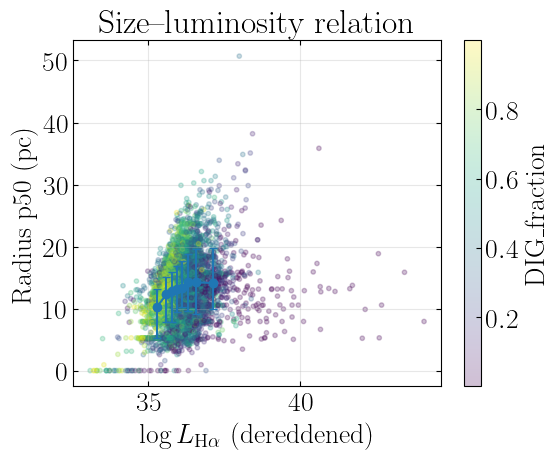

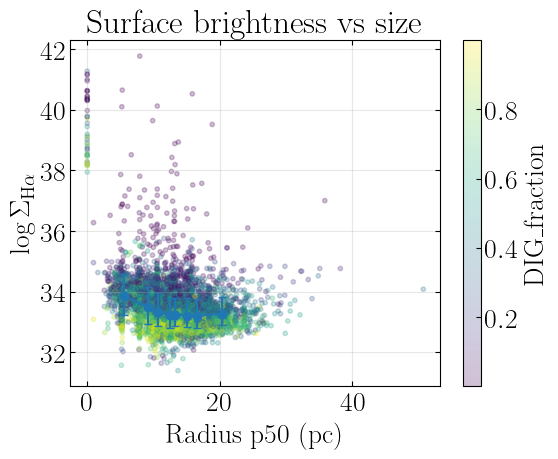

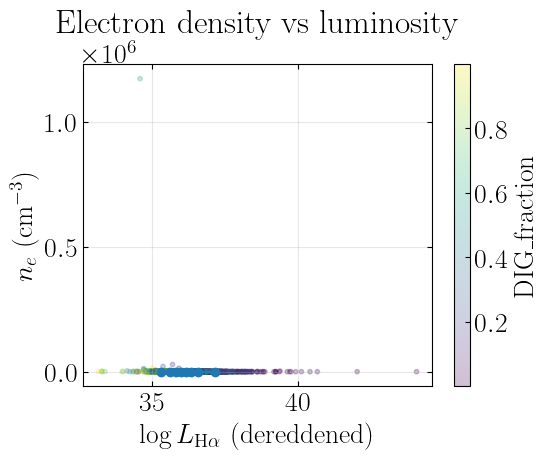

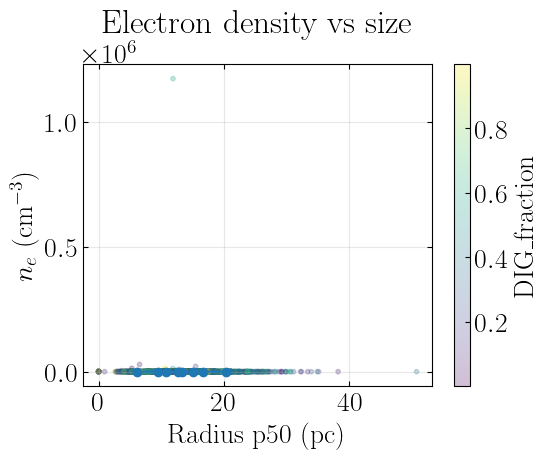

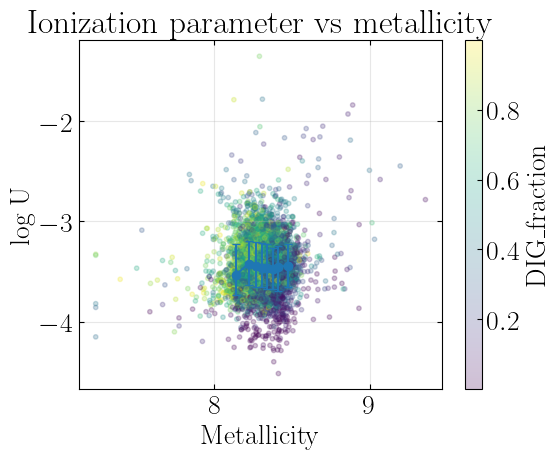

...

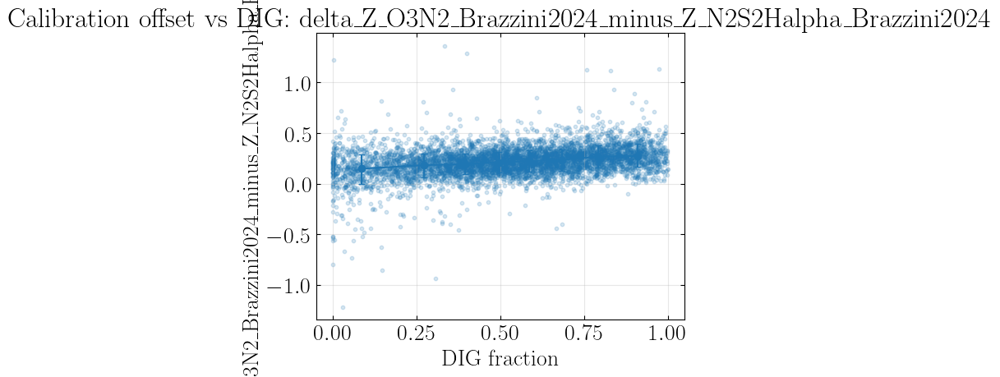

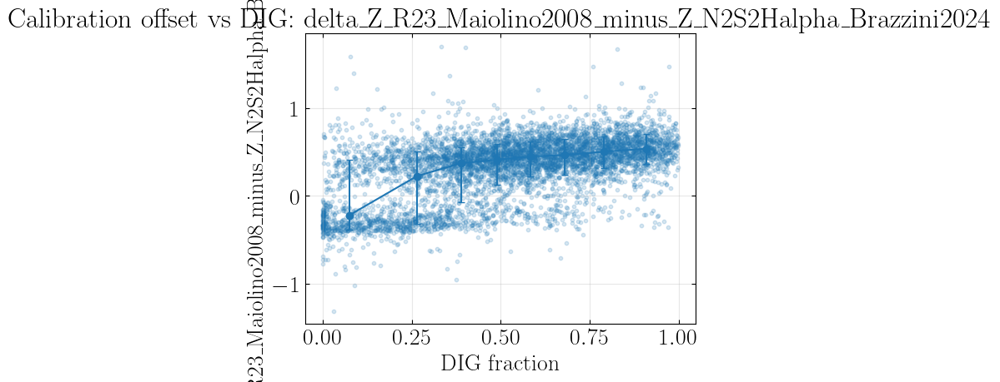

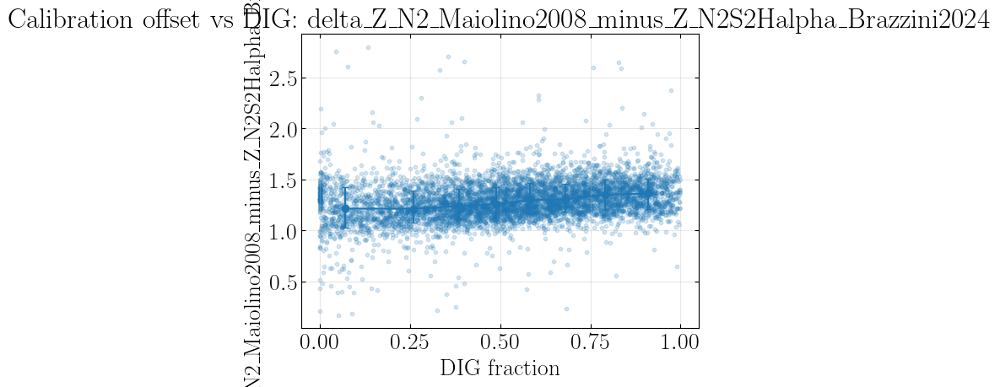

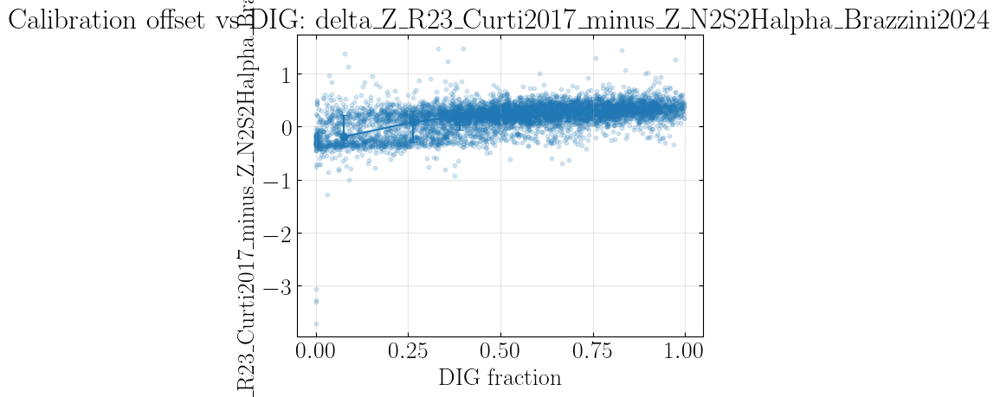

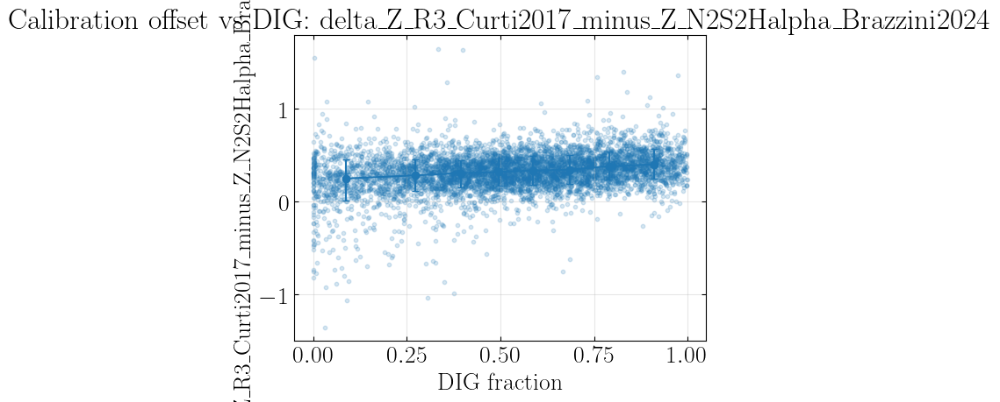


GROUP MEDIANS FOR DIG_class

radius_p50_pc:
DIG_class
High            13.052999
Intermediate    12.990244
Low             12.990244

log_L_Ha_sum_dered:
DIG_class
High            35.732058
Intermediate    36.021614
Low             36.366660

ne_SII_cm3:
DIG_class
High            102.820306
Intermediate     91.111236
Low             120.850985

logU_KK04:
DIG_class
High           -3.430063
Intermediate   -3.423817
Low            -3.544489

Z_N2S2Halpha_Brazzini2024:
DIG_class
High            8.276151
Intermediate    8.327920
Low             8.369418

DIG_fraction:
DIG_class
High            0.803428
Intermediate    0.528616
Low             0.230663

distance_5th_closest_pc_deproj:
DIG_class
High            49.113127
Intermediate    50.011515
Low             51.664344

GROUP MEDIANS FOR luminosity_class

radius_p50_pc:
luminosity_class
High            14.266888
Intermediate    13.178509
Low             11.441508

log_L_Ha_sum_dered:
luminosity_class
High            36.584030
Intermediate

In [113]:
import os
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import spearmanr

# ============================================================
# USER SETTINGS
# ============================================================
# Assumes your catalog is already loaded as `cat`

OUTPUT_DIR = None
# Example:
# OUTPUT_DIR = CATALOG_DIR

# Core columns to analyze
candidate_cols = [
    "R_gal_kpc",
    "log_L_Ha_sum_dered",
    "radius_p50_pc",
    "radius_areaeq_pc",
    "DIG_fraction",
    "distance_5th_closest_pc_deproj",
    "sigma5_per_pc2_deproj",
    "nearest_neighbor_pc_deproj",
    "n_regions_within_100pc_deproj",
    "ne_SII_cm3",
    "logU_KK04",
    "Z_N2S2Halpha_Brazzini2024",
    "Z_O3N2_Brazzini2024",
    "Z_N2_Brazzini2024",
    "log_NII_Ha_sum_dered",
    "log_OIII_Hb_sum_dered",
    "log_SII_Ha_sum_dered",
    "logO32",
    "sum_A_V",
    "sum_E_BV",
    "npix_region",
    "int_flux_int",
]

# Main metallicity choice for convenience
main_Z_col = "Z_N2S2Halpha_Brazzini2024"
main_L_col = "log_L_Ha_sum_dered"
main_size_col = "radius_p50_pc"
main_dig_col = "DIG_fraction"
main_cluster_col = "distance_5th_closest_pc_deproj"

# ============================================================
# COPY CATALOG
# ============================================================
df = cat.copy()

# ============================================================
# DERIVED COLUMNS
# ============================================================
# Halpha surface brightness / luminosity surface density
if "L_Ha_sum_dered" in df.columns and "radius_p50_pc" in df.columns:
    area = np.pi * df["radius_p50_pc"]**2
    df["Sigma_Ha"] = df["L_Ha_sum_dered"] / area
    df["log_Sigma_Ha"] = np.log10(df["Sigma_Ha"].where(df["Sigma_Ha"] > 0))

# Compactness / concentration proxy
if "radius_p50_pc" in df.columns and "radius_areaeq_pc" in df.columns:
    df["size_ratio_p50_areaeq"] = df["radius_p50_pc"] / df["radius_areaeq_pc"]

# Simple calibration offsets
metallicity_cols = [
    c for c in [
        "Z_N2_Brazzini2024",
        "Z_O3N2_Brazzini2024",
        "Z_N2S2Halpha_Brazzini2024",
        "Z_R23_Maiolino2008",
        "Z_N2_Maiolino2008",
        "Z_R23_Curti2017",
        "Z_R3_Curti2017",
        "Z_N2_Curti2017",
        "Z_O3N2_Curti2017",
        "Z_O3N2_M2013",
        "Z_N2_M2013",
        "Z_N2_PP2004",
        "Z_O3N2_PP2004",
    ] if c in df.columns
]

if len(metallicity_cols) >= 2 and main_Z_col in df.columns:
    for col in metallicity_cols:
        if col != main_Z_col:
            df[f"delta_{col}_minus_{main_Z_col}"] = df[col] - df[main_Z_col]

# Optional quantile classes for some useful variables
def add_tercile_class(df, col, new_col):
    good = pd.to_numeric(df[col], errors="coerce")
    q1 = good.quantile(0.33)
    q2 = good.quantile(0.66)
    df[new_col] = "Intermediate"
    df.loc[good <= q1, new_col] = "Low"
    df.loc[good >= q2, new_col] = "High"
    return q1, q2

class_info = {}
for src, dst in [
    ("DIG_fraction", "DIG_class"),
    ("log_L_Ha_sum_dered", "luminosity_class"),
    ("radius_p50_pc", "size_class"),
    ("logU_KK04", "ionization_class"),
    ("ne_SII_cm3", "density_class"),
]:
    if src in df.columns:
        q1, q2 = add_tercile_class(df, src, dst)
        class_info[src] = (q1, q2)

print("="*80)
print("TERCILE CLASS DEFINITIONS")
for k, v in class_info.items():
    print(f"{k}: Low <= {v[0]:.4g}, High >= {v[1]:.4g}")

# ============================================================
# 1) PAIRWISE SPEARMAN CORRELATION SCAN
# ============================================================
usable_cols = [c for c in candidate_cols if c in df.columns]

corr_rows = []
for c1, c2 in itertools.combinations(usable_cols, 2):
    sub = df[[c1, c2]].dropna()
    if len(sub) < 30:
        continue
    rho, p = spearmanr(sub[c1], sub[c2])
    corr_rows.append({
        "x": c1,
        "y": c2,
        "N": len(sub),
        "spearman_rho": rho,
        "p_value": p,
        "abs_rho": abs(rho),
    })

corr_df = pd.DataFrame(corr_rows).sort_values("abs_rho", ascending=False)

print("\n" + "="*80)
print("TOP 30 PAIRWISE SPEARMAN CORRELATIONS")
print(corr_df.head(30).to_string(index=False))

# ============================================================
# 2) PHYSICS-MOTIVATED SCATTER PLOT HELPER
# ============================================================
def scatter_with_binned_trend(
    df, xcol, ycol, xlabel=None, ylabel=None, colorcol=None,
    qbins=8, logx=False, logy=False, title=None
):
    subcols = [xcol, ycol] + ([colorcol] if colorcol is not None else [])
    sub = df[subcols].dropna().copy()
    if len(sub) < 20:
        print(f"Skipping {xcol} vs {ycol}: not enough data")
        return

    plt.figure(figsize=(6, 5))

    if colorcol is None:
        plt.scatter(sub[xcol], sub[ycol], s=10, alpha=0.18)
    else:
        plt.scatter(sub[xcol], sub[ycol], c=sub[colorcol], s=10, alpha=0.25)
        plt.colorbar(label=colorcol)

    # binned median trend
    try:
        sub["bin"] = pd.qcut(sub[xcol], q=qbins, duplicates="drop")
        prof = sub.groupby("bin", observed=False).agg(
            x_median=(xcol, "median"),
            y_median=(ycol, "median"),
            y_p16=(ycol, lambda z: np.percentile(z, 16)),
            y_p84=(ycol, lambda z: np.percentile(z, 84)),
        ).reset_index(drop=True)

        yerr_lower = prof["y_median"] - prof["y_p16"]
        yerr_upper = prof["y_p84"] - prof["y_median"]

        plt.errorbar(
            prof["x_median"], prof["y_median"],
            yerr=[yerr_lower, yerr_upper],
            fmt="o-", capsize=3, lw=1.5
        )
    except Exception:
        pass

    rho, p = spearmanr(sub[xcol], sub[ycol])

    if logx:
        plt.xscale("log")
    if logy:
        plt.yscale("log")

    plt.xlabel(xlabel or xcol)
    plt.ylabel(ylabel or ycol)
    plt.title(title or f"{ycol} vs {xcol}\nSpearman rho={rho:.3f}, p={p:.1e}")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# ============================================================
# 3) KEY PLOTS YOU SHOULD PROBABLY MAKE
# ============================================================
# (a) Size-luminosity relation
if "log_L_Ha_sum_dered" in df.columns and "radius_p50_pc" in df.columns:
    scatter_with_binned_trend(
        df,
        xcol="log_L_Ha_sum_dered",
        ycol="radius_p50_pc",
        xlabel=r"$\log L_{\mathrm{H}\alpha}$ (dereddened)",
        ylabel="Radius p50 (pc)",
        colorcol="DIG_fraction" if "DIG_fraction" in df.columns else None,
        title="Size–luminosity relation"
    )

# (b) Surface brightness vs size
if "log_Sigma_Ha" in df.columns and "radius_p50_pc" in df.columns:
    scatter_with_binned_trend(
        df,
        xcol="radius_p50_pc",
        ycol="log_Sigma_Ha",
        xlabel="Radius p50 (pc)",
        ylabel=r"$\log \Sigma_{\mathrm{H}\alpha}$",
        colorcol="DIG_fraction" if "DIG_fraction" in df.columns else None,
        title="Surface brightness vs size"
    )

# (c) Luminosity vs electron density
if "log_L_Ha_sum_dered" in df.columns and "ne_SII_cm3" in df.columns:
    scatter_with_binned_trend(
        df,
        xcol="log_L_Ha_sum_dered",
        ycol="ne_SII_cm3",
        xlabel=r"$\log L_{\mathrm{H}\alpha}$ (dereddened)",
        ylabel=r"$n_e$ (cm$^{-3}$)",
        colorcol="DIG_fraction" if "DIG_fraction" in df.columns else None,
        title="Electron density vs luminosity"
    )

# (d) Size vs electron density
if "radius_p50_pc" in df.columns and "ne_SII_cm3" in df.columns:
    scatter_with_binned_trend(
        df,
        xcol="radius_p50_pc",
        ycol="ne_SII_cm3",
        xlabel="Radius p50 (pc)",
        ylabel=r"$n_e$ (cm$^{-3}$)",
        colorcol="DIG_fraction" if "DIG_fraction" in df.columns else None,
        title="Electron density vs size"
    )

# (e) logU vs metallicity
if "logU_KK04" in df.columns and main_Z_col in df.columns:
    scatter_with_binned_trend(
        df,
        xcol=main_Z_col,
        ycol="logU_KK04",
        xlabel="Metallicity",
        ylabel="log U",
        colorcol="DIG_fraction" if "DIG_fraction" in df.columns else None,
        title="Ionization parameter vs metallicity"
    )

# (f) DIG vs clustering
if "DIG_fraction" in df.columns and "distance_5th_closest_pc_deproj" in df.columns:
    scatter_with_binned_trend(
        df,
        xcol="distance_5th_closest_pc_deproj",
        ycol="DIG_fraction",
        xlabel=r"$d_5$ (pc)",
        ylabel="DIG fraction",
        logx=True,
        title="DIG fraction vs local clustering"
    )

# ============================================================
# 4) Halpha LUMINOSITY FUNCTION
# ============================================================
if "log_L_Ha_sum_dered" in df.columns:
    sub = df["log_L_Ha_sum_dered"].dropna()

    plt.figure(figsize=(6, 5))
    plt.hist(sub, bins=35, alpha=0.8)
    plt.xlabel(r"$\log L_{\mathrm{H}\alpha}$ (dereddened)")
    plt.ylabel("Number of regions")
    plt.title("HII region luminosity function")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # cumulative LF
    x = np.sort(sub.values)
    y = np.arange(len(x), 0, -1)

    plt.figure(figsize=(6, 5))
    plt.plot(x, y)
    plt.yscale("log")
    plt.xlabel(r"$\log L_{\mathrm{H}\alpha}$ (dereddened)")
    plt.ylabel(r"$N(>L)$")
    plt.title("Cumulative HII region luminosity function")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# ============================================================
# 5) BPT DIAGRAMS COLORED BY ENVIRONMENT
# ============================================================
if {"log_NII_Ha_sum_dered", "log_OIII_Hb_sum_dered"}.issubset(df.columns):
    for colorcol in [c for c in ["DIG_fraction", "distance_5th_closest_pc_deproj", "R_gal_kpc"] if c in df.columns]:
        sub = df[["log_NII_Ha_sum_dered", "log_OIII_Hb_sum_dered", colorcol]].dropna()

        plt.figure(figsize=(6, 5))
        plt.scatter(
            sub["log_NII_Ha_sum_dered"],
            sub["log_OIII_Hb_sum_dered"],
            c=sub[colorcol],
            s=10,
            alpha=0.3
        )
        plt.xlabel(r"$\log([\mathrm{NII}]/\mathrm{H}\alpha)$")
        plt.ylabel(r"$\log([\mathrm{OIII}]/\mathrm{H}\beta)$")
        plt.title(f"BPT diagram colored by {colorcol}")
        plt.colorbar(label=colorcol)
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

# ============================================================
# 6) METALLICITY CALIBRATION OFFSETS VS DIG / logU
# ============================================================
delta_cols = [c for c in df.columns if c.startswith("delta_")]
for dcol in delta_cols[:6]:  # keep this manageable
    if main_dig_col in df.columns:
        scatter_with_binned_trend(
            df,
            xcol=main_dig_col,
            ycol=dcol,
            xlabel="DIG fraction",
            ylabel=dcol,
            title=f"Calibration offset vs DIG: {dcol}"
        )

# ============================================================
# 7) SIMPLE CLASS-BASED COMPARISONS
# ============================================================
def print_group_medians(df, class_col, props):
    if class_col not in df.columns:
        return
    print("\n" + "="*80)
    print(f"GROUP MEDIANS FOR {class_col}")
    for prop in props:
        if prop not in df.columns:
            continue
        out = df.groupby(class_col, observed=False)[prop].median()
        print(f"\n{prop}:")
        print(out.to_string())

for class_col in ["DIG_class", "luminosity_class", "size_class", "ionization_class", "density_class"]:
    print_group_medians(
        df,
        class_col,
        props=[
            "radius_p50_pc",
            "log_L_Ha_sum_dered",
            "ne_SII_cm3",
            "logU_KK04",
            main_Z_col,
            "DIG_fraction",
            "distance_5th_closest_pc_deproj"
        ]
    )

# ============================================================
# 8) SYMMETRY / MORPHOLOGY TRENDS
# ============================================================
if "symmetry_class" in df.columns:
    print("\n" + "="*80)
    print("MEDIAN PROPERTIES BY symmetry_class")
    cols = [c for c in [
        "radius_p50_pc",
        "log_L_Ha_sum_dered",
        "ne_SII_cm3",
        "logU_KK04",
        main_Z_col,
        "DIG_fraction",
        "distance_5th_closest_pc_deproj"
    ] if c in df.columns]

    print(df.groupby("symmetry_class", observed=False)[cols].median().to_string())

# ============================================================
# 9) OPTIONAL: SAVE CORRELATION TABLE
# ============================================================
if OUTPUT_DIR is not None:
    os.makedirs(OUTPUT_DIR, exist_ok=True)
    corr_df.to_csv(os.path.join(OUTPUT_DIR, "pairwise_spearman_scan.csv"), index=False)
    print(f"\nSaved pairwise scan to {os.path.join(OUTPUT_DIR, 'pairwise_spearman_scan.csv')}")

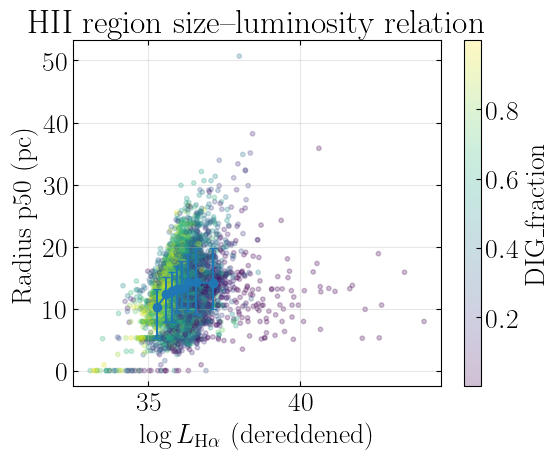

radius_p50_pc vs log_L_Ha_sum_dered: rho=0.3152, p=1.951e-137, N=5955


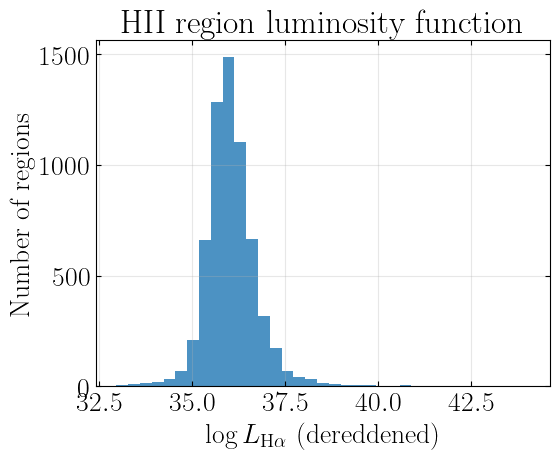

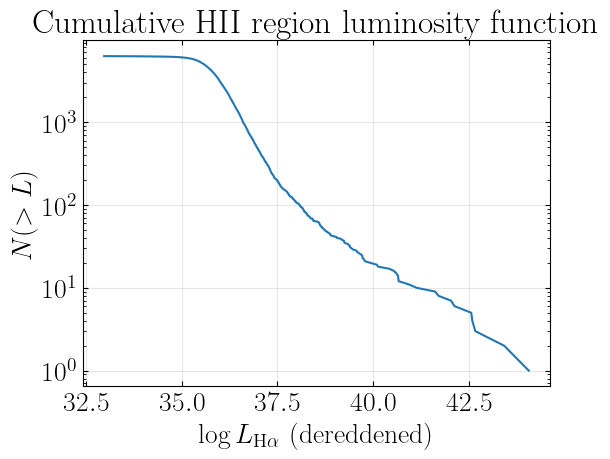

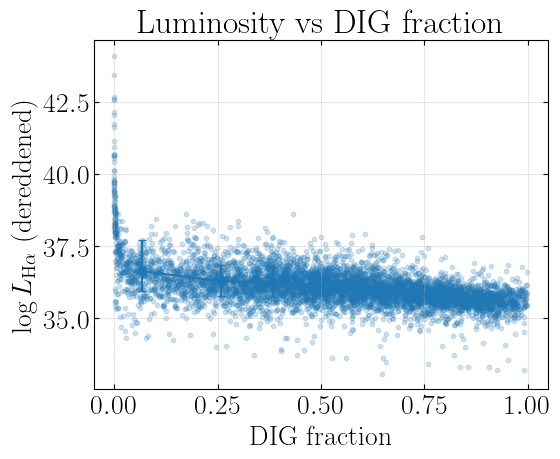

log_L_Ha_sum_dered vs DIG_fraction: rho=-0.5246, p=0.000e+00, N=5955


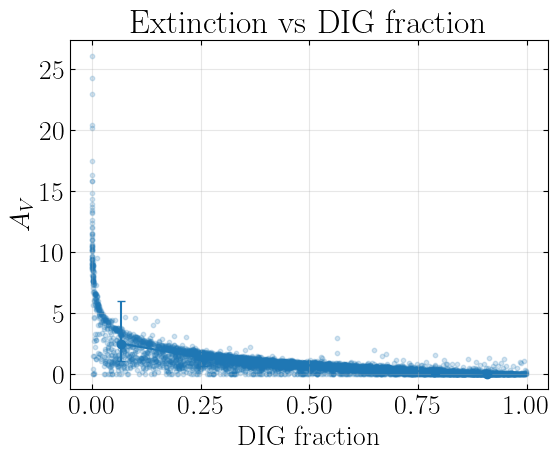

sum_A_V vs DIG_fraction: rho=-0.8432, p=0.000e+00, N=5955


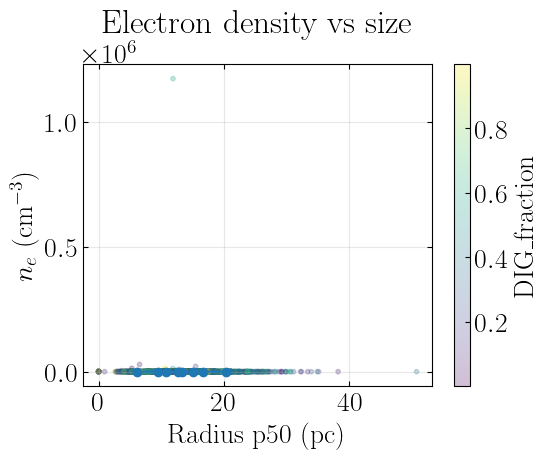

ne_SII_cm3 vs radius_p50_pc: rho=-0.1297, p=7.838e-15, N=3562


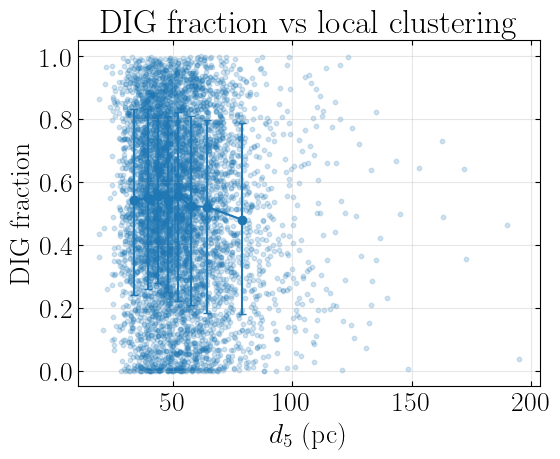

DIG_fraction vs distance_5th_closest_pc_deproj: rho=-0.0677, p=1.668e-07, N=5955


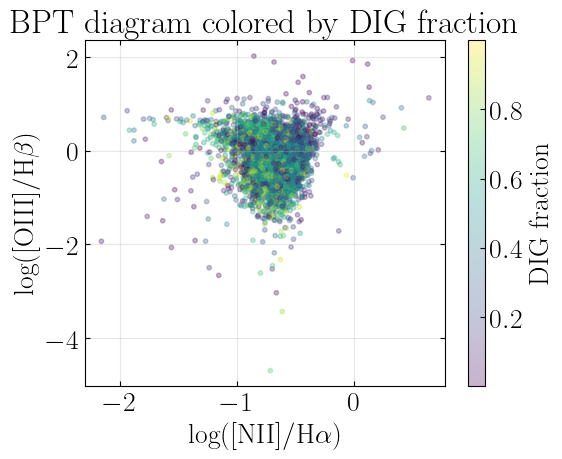

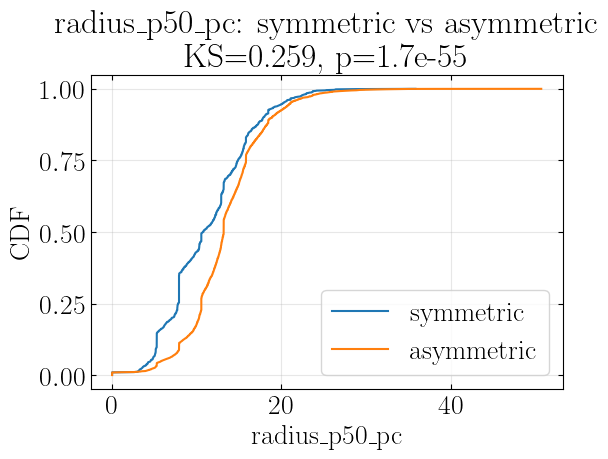

radius_p50_pc: symmetric vs asymmetric -> KS=0.2590, p=1.658e-55


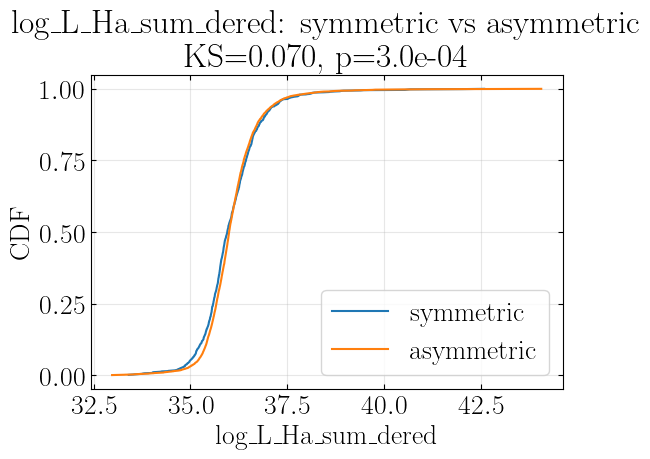

log_L_Ha_sum_dered: symmetric vs asymmetric -> KS=0.0700, p=3.014e-04


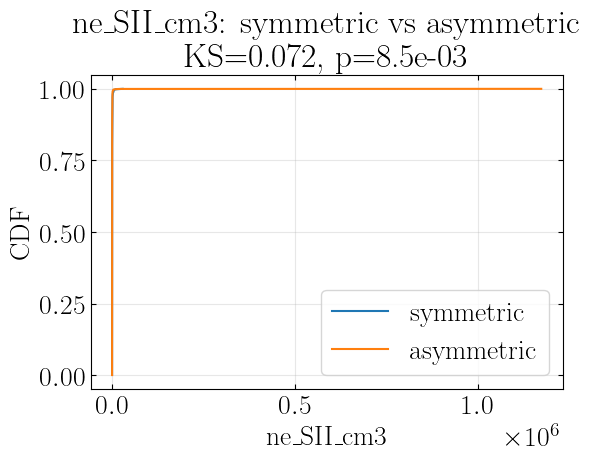

ne_SII_cm3: symmetric vs asymmetric -> KS=0.0717, p=8.530e-03


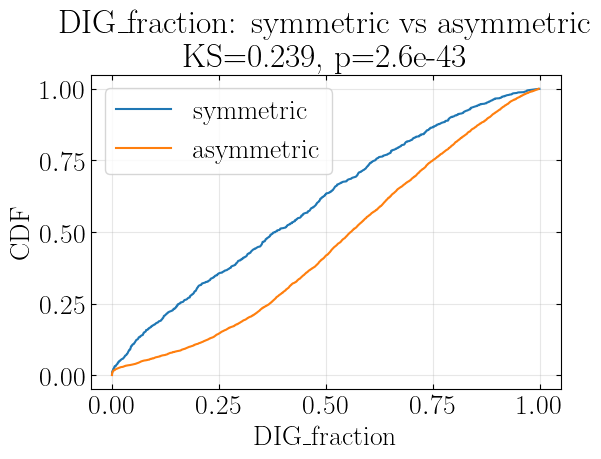

DIG_fraction: symmetric vs asymmetric -> KS=0.2387, p=2.617e-43


In [114]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr, ks_2samp

df = cat.copy()

def scatter_binned(df, xcol, ycol, xlabel=None, ylabel=None, colorcol=None, q=8, title=None):
    subcols = [xcol, ycol] + ([colorcol] if colorcol else [])
    sub = df[subcols].dropna().copy()
    if len(sub) < 20:
        print(f"Skipping {xcol} vs {ycol}: not enough data")
        return

    rho, p = spearmanr(sub[xcol], sub[ycol])

    plt.figure(figsize=(6,5))
    if colorcol:
        sc = plt.scatter(sub[xcol], sub[ycol], c=sub[colorcol], s=10, alpha=0.25)
        plt.colorbar(sc, label=colorcol)
    else:
        plt.scatter(sub[xcol], sub[ycol], s=10, alpha=0.2)

    try:
        sub["bin"] = pd.qcut(sub[xcol], q=q, duplicates="drop")
        prof = sub.groupby("bin", observed=False).agg(
            x_med=(xcol, "median"),
            y_med=(ycol, "median"),
            y16=(ycol, lambda z: np.percentile(z, 16)),
            y84=(ycol, lambda z: np.percentile(z, 84))
        ).reset_index(drop=True)

        yerr_lower = prof["y_med"] - prof["y16"]
        yerr_upper = prof["y84"] - prof["y_med"]

        plt.errorbar(
            prof["x_med"], prof["y_med"],
            yerr=[yerr_lower, yerr_upper],
            fmt="o-", capsize=3, lw=1.5
        )
    except Exception:
        pass

    plt.xlabel(xlabel or xcol)
    plt.ylabel(ylabel or ycol)
    plt.title(title or f"{ycol} vs {xcol}\nSpearman rho={rho:.3f}, p={p:.1e}")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"{ycol} vs {xcol}: rho={rho:.4f}, p={p:.3e}, N={len(sub)}")

def cdf_two_groups(df, value_col, group_col, group1, group2, xlabel=None):
    sub = df[[value_col, group_col]].dropna()
    a = np.sort(sub.loc[sub[group_col] == group1, value_col].values)
    b = np.sort(sub.loc[sub[group_col] == group2, value_col].values)

    if len(a) < 3 or len(b) < 3:
        print(f"Skipping {value_col} by {group_col}: insufficient data")
        return

    ks_stat, p = ks_2samp(a, b)
    ya = np.arange(1, len(a)+1) / len(a)
    yb = np.arange(1, len(b)+1) / len(b)

    plt.figure(figsize=(6,5))
    plt.plot(a, ya, label=group1)
    plt.plot(b, yb, label=group2)
    plt.xlabel(xlabel or value_col)
    plt.ylabel("CDF")
    plt.title(f"{value_col}: {group1} vs {group2}\nKS={ks_stat:.3f}, p={p:.1e}")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"{value_col}: {group1} vs {group2} -> KS={ks_stat:.4f}, p={p:.3e}")

# --------------------------------------------------
# 1) Size-luminosity relation
# --------------------------------------------------
scatter_binned(
    df,
    xcol="log_L_Ha_sum_dered",
    ycol="radius_p50_pc",
    xlabel=r"$\log L_{\mathrm{H}\alpha}$ (dereddened)",
    ylabel="Radius p50 (pc)",
    colorcol="DIG_fraction",
    title="HII region size–luminosity relation"
)

# --------------------------------------------------
# 2) Luminosity function
# --------------------------------------------------
sub = df["log_L_Ha_sum_dered"].dropna()

plt.figure(figsize=(6,5))
plt.hist(sub, bins=35, alpha=0.8)
plt.xlabel(r"$\log L_{\mathrm{H}\alpha}$ (dereddened)")
plt.ylabel("Number of regions")
plt.title("HII region luminosity function")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

x = np.sort(sub.values)
y = np.arange(len(x), 0, -1)

plt.figure(figsize=(6,5))
plt.plot(x, y)
plt.yscale("log")
plt.xlabel(r"$\log L_{\mathrm{H}\alpha}$ (dereddened)")
plt.ylabel(r"$N(>L)$")
plt.title("Cumulative HII region luminosity function")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 3) Luminosity vs DIG
# --------------------------------------------------
scatter_binned(
    df,
    xcol="DIG_fraction",
    ycol="log_L_Ha_sum_dered",
    xlabel="DIG fraction",
    ylabel=r"$\log L_{\mathrm{H}\alpha}$ (dereddened)",
    title="Luminosity vs DIG fraction"
)

# --------------------------------------------------
# 4) Extinction vs DIG
# --------------------------------------------------
scatter_binned(
    df,
    xcol="DIG_fraction",
    ycol="sum_A_V",
    xlabel="DIG fraction",
    ylabel=r"$A_V$",
    title="Extinction vs DIG fraction"
)

# --------------------------------------------------
# 5) Density vs size
# --------------------------------------------------
scatter_binned(
    df,
    xcol="radius_p50_pc",
    ycol="ne_SII_cm3",
    xlabel="Radius p50 (pc)",
    ylabel=r"$n_e$ (cm$^{-3}$)",
    colorcol="DIG_fraction",
    title="Electron density vs size"
)

# --------------------------------------------------
# 6) DIG vs clustering
# --------------------------------------------------
scatter_binned(
    df,
    xcol="distance_5th_closest_pc_deproj",
    ycol="DIG_fraction",
    xlabel=r"$d_5$ (pc)",
    ylabel="DIG fraction",
    title="DIG fraction vs local clustering"
)

# --------------------------------------------------
# 7) BPT colored by DIG
# --------------------------------------------------
sub = df[["log_NII_Ha_sum_dered", "log_OIII_Hb_sum_dered", "DIG_fraction"]].dropna()
plt.figure(figsize=(6,5))
sc = plt.scatter(
    sub["log_NII_Ha_sum_dered"],
    sub["log_OIII_Hb_sum_dered"],
    c=sub["DIG_fraction"],
    s=10,
    alpha=0.3
)
plt.xlabel(r"$\log([\mathrm{NII}]/\mathrm{H}\alpha)$")
plt.ylabel(r"$\log([\mathrm{OIII}]/\mathrm{H}\beta)$")
plt.title("BPT diagram colored by DIG fraction")
plt.colorbar(sc, label="DIG fraction")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 8) Symmetry-class CDF comparisons
# --------------------------------------------------
for prop in ["radius_p50_pc", "log_L_Ha_sum_dered", "ne_SII_cm3", "DIG_fraction"]:
    cdf_two_groups(
        df,
        value_col=prop,
        group_col="symmetry_class",
        group1="symmetric",
        group2="asymmetric",
        xlabel=prop
    )

In [115]:
for col in cat.columns:
    print(col)

region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_int
F_Hbeta_e_int
SNR_Hbeta_int
F_[OIII]4959_int
F_[OIII]4959_e_int
SNR_[OIII]4959_int
F_[OI